In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
os.chdir('/content/gdrive/MyDrive')
## Data
kidney_df = pd.read_csv('Kidney disease.csv')

In [ ]:
## Seperate data to X (data for different features) and Y(the quality label)
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()

Visualizing Data

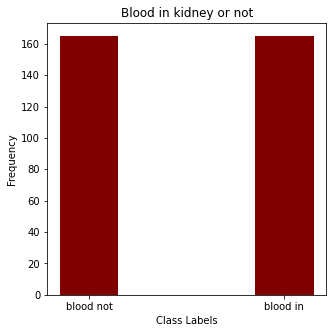

In [ ]:
## Visualizing the data
# Distribution of blood in kidney vs blood not in kidney 
# We are assuming class label 0 = blood not and class label 1 = blood in
goodCount = np.count_nonzero(y_kidney)
badCount = X_kidney.shape[0] - goodCount
classLabel = ["blood not", "blood in"]
classLabelCount = [badCount, goodCount]
plt.figure(figsize=(5,5))
plt.bar(classLabel, classLabelCount, color='maroon', width=0.3)
plt.xlabel("Class Labels")
plt.ylabel("Frequency")
plt.title("Blood in kidney or not")
plt.show()

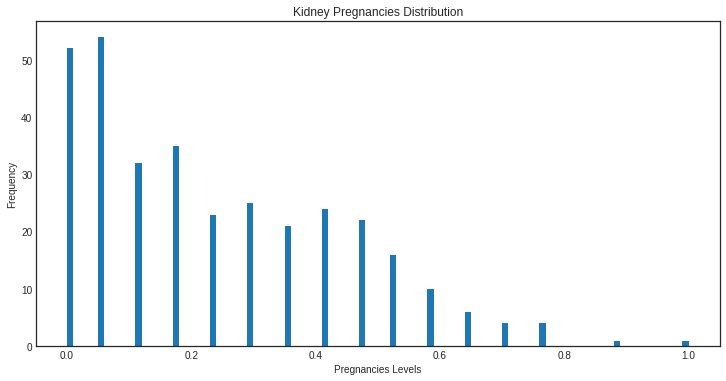

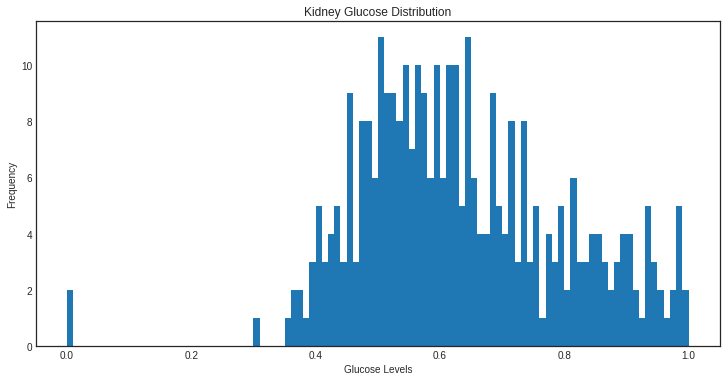

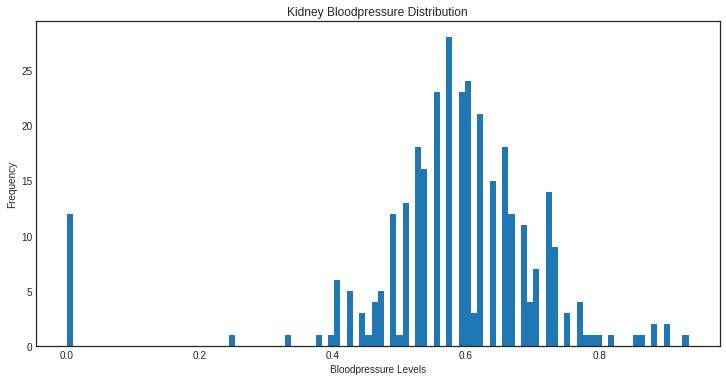

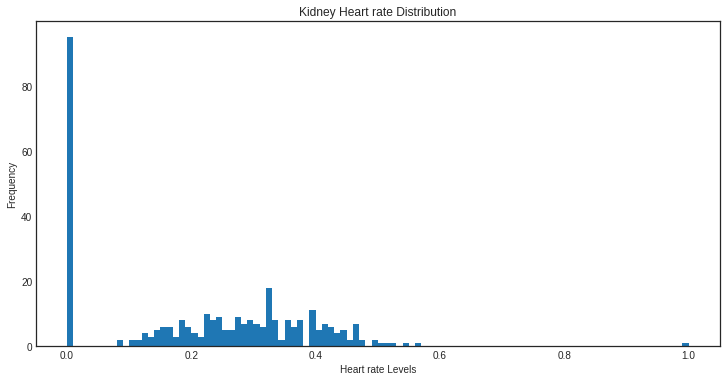

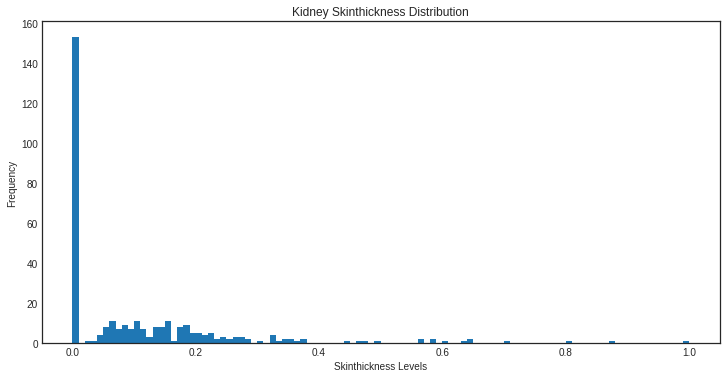

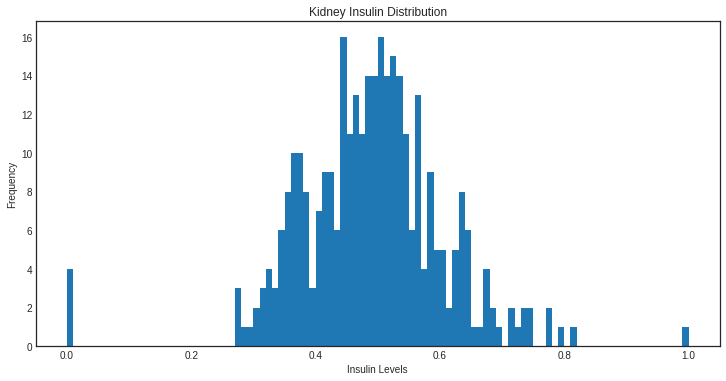

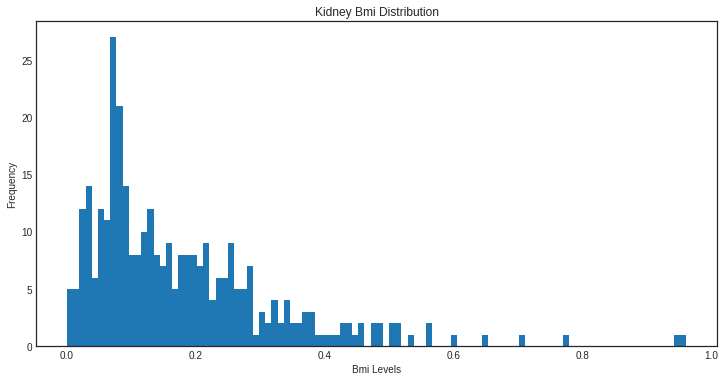

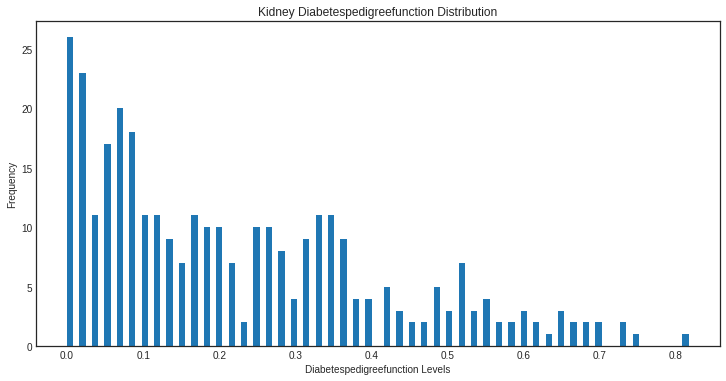

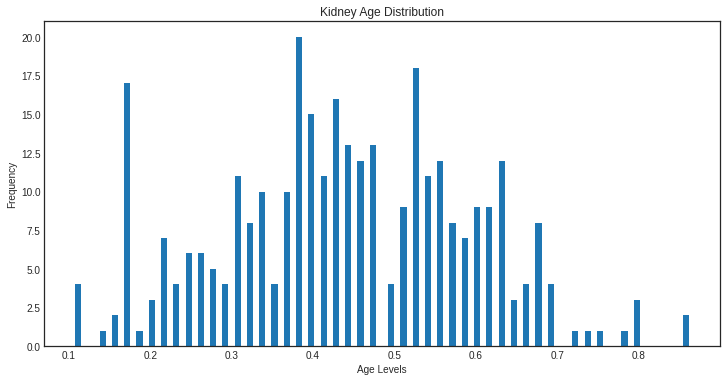

In [ ]:
## Visualizing the data
## Checking distribution
nBins = 100
# getting the feature names
featureNames = kidney_df.columns

# Distribution of other features of Hepatitis
plt.style.use('seaborn-white')
for curFeature in range(0, X_kidney.shape[1]):
  plt.figure(figsize=(10,5))
  plt.hist(X_kidney[:, curFeature], nBins)
  plt.tight_layout()
  plt.xlabel(featureNames[curFeature].capitalize() + " Levels")
  plt.ylabel("Frequency")
  plt.title("Kidney " + str(featureNames[curFeature].capitalize()) + " Distribution")
  plt.show()

<ipython-input-85-54bdfec0e299>:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  temp.hist(bins=100, ax=ax, grid=False)


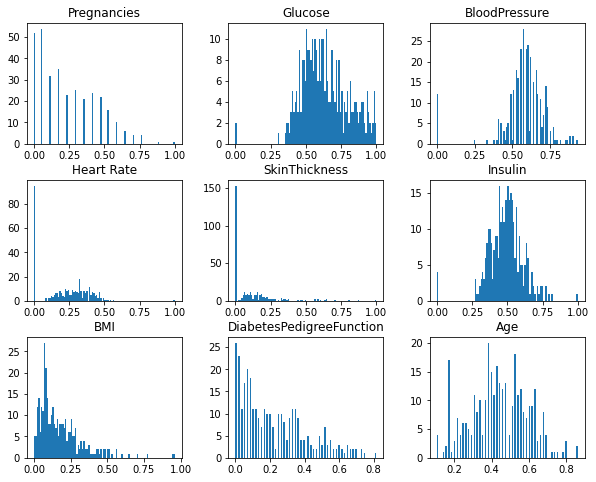

In [ ]:
## Visualizing the data together
fig, ax = plt.subplots(figsize=(10, 8))
temp = kidney_df.drop('blood label', axis=1)
temp.hist(bins=100, ax=ax, grid=False)
fig.show()

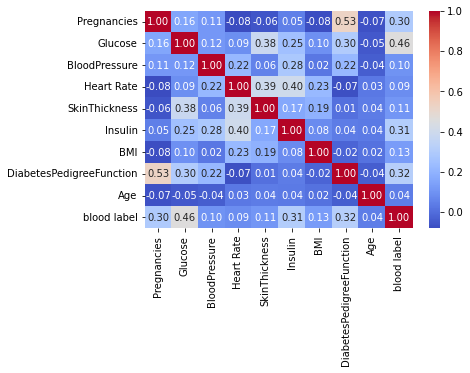

In [ ]:
## Visualizing the data
## Checking correlation
corr_matrix = kidney_df.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm',fmt='.2f')
plt.show()

Function

In [ ]:
## feature Standardization
def featureStandardization(X): 
    mean = np.mean(X[:,1:],axis=0)
    std = np.std(X[:, 1:],axis=0)
    for i in range(0, X.shape[0]):
        X[i, 1:] = (X[i, 1:] - mean)/std
    return X

In [ ]:
## function of finding outlier in data (Z score >3)
def detect_outliers(data, columns):
    outliers = []
    for column in columns:
        mean = np.mean(data[column])
        std = np.std(data[column])
        for i in data.index:
            z_score = (data.loc[i, column] - mean) / std
            if np.abs(z_score) > 3:
                outliers.append(i)
    return outliers

In [ ]:
## function of shuffling the data
def shuffle(X,y):
  indices = np.random.permutation(X.shape[0])
  X = X[indices]
  y = y[indices]
  return X, y

In [ ]:
## function of Logistic function
def sigmoid(z):
    #clip the values of the input to the sigmoid function to prevent overflow or underflow.
    z = np.clip(z, -10000, 10000)
    return 1.0/(1 + np.exp(-z))
## Loss/Cost function
def loss(y, y_hat):
    #add a small epsilon value to the predicted probabilities to ensure they are not exactly 0 or 1
    y_hat = np.clip(y_hat, 1e-8, 1-1e-8)
    loss = -np.mean(y*(np.log(y_hat)) + (1-y)*np.log(1-y_hat))
    return loss
## Gradient Descent
def gradients(X, y, y_hat):
    
    # X --> Input data.
    # y --> true/target value.
    # y_hat --> hypothesis/predictions.
    # dw --> weights (parameter).
    # db --> bias (parameter).
    
    # m-> number of training examples.
    m = X.shape[0]
    
    # Gradient of loss w.r.t weights.
    dw = (1/m)*np.dot(X.T, (y_hat - y))
    
    # Gradient of loss w.r.t bias.
    db = (1/m)*np.sum((y_hat - y)) 
    
    return dw, db

def train(X, y, stop, lr, decay):
    
    # X --> Input.
    # y --> true/target value.
    # stop --> Stop threshold of the L2 distance between the current and previous parameter estimates.
    # lr --> Learning rate.
    # decay --> Decaying rate.
        
    # m-> number of training examples
    # n-> number of features 
    m, n = X.shape
    
    # Initializing weights and bias to zeros.
    w = np.zeros((n,1))
    b=0
    
    # Reshaping y.
    y = y.reshape(m,1)
    
    
    # Empty list to store losses and L2 distance(error).
    losses = []
    err=[]
    error = 888 ## giving a very large error to start the for loop
    interations=0
    # Training loop.
    for epoch in range(1000000000): ##maximum 10^9 interations
        if error >= stop:
            
            # Calculating hypothesis/prediction.
            y_hat = sigmoid(np.dot(X, w) + b)
            
            # Getting the gradients of loss w.r.t parameters.
            dw, db = gradients(X, y, y_hat)
            
            # Updating the parameters.
            alpha = lr/(interations*decay + 1)
            w_new = w - alpha*dw
        # Calculating error and appending it in the list.
            error =  np.linalg.norm(w_new - w, 2)
            b_new = b - alpha*db
            err.append(error)
            w = w_new
            b = b_new
        # Calculating loss and appending it in the list.
            l = loss(y, sigmoid(np.dot(X, w) + b))
            interations +=1
            losses.append(l)
        else:
            break
        
        
    # returning weights, bias, losses(List), error(List), interations.
    return w, b, losses, err, interations

# Predict label from test data
def predict(X,para,bias):
    
    # X --> Input.
    
    # Calculating presictions/y_hat.
    preds = sigmoid(np.dot(X, para) + bias)
    
    # Empty List to store predictions.
    pred_class = []
    #print(preds[0:5])
    # if y_hat >= 0.5 --> round up to 1
    # if y_hat < 0.5 --> round up to 1
    pred_class = [1 if i > 0.5 else 0 for i in preds]
    
    return np.array(pred_class)

# Calculating Accuracy
def accuracy(y, y_hat):
    accuracy = np.sum(y == y_hat) / len(y)
    return accuracy

def changeModelOrder(model_order, X):
  # If model order is greater than one do something about the matrix
  Xtmp = X
  if model_order > 1:
    for k in range(2,model_order+1):
      temp = Xtmp[:,0:Xtmp.shape[1]]**k
      Xtmp =  np.concatenate((Xtmp,temp),axis=1)
    print(f"The order of the linear model is now: {model_order}")
    m, n = Xtmp.shape
    print("The shape of X ---> " + str(m) + "x" + str(n))
    return Xtmp   
  # If model order = 1 or less we set model to original model
  else:
    print(f"The order of the linear model didn't change: {model_order}")
    m, n = Xtmp.shape
    print("The shape of X ---> " + str(m) + "x" + str(n))
    return Xtmp

  

In [ ]:
## function of k-folds validation

def validation(k, X, y, stop_threshold, learning_rate, decay_rate):
  ## k --> how many folds?
  fold_size = y.size//k
  folds = [np.arange(i*fold_size, (i+1)*fold_size) for i in range(k-1)]
  folds.append(np.arange((k-1)*fold_size, y.size))

  # Empty list to store all accuracy, losses, interation time and L2 distance(error)
  all_acu =[]
  all_err = []
  all_losses=[]
  all_interation = []
  for i in range(k):
    print('No.'+ str(i+1) + ' fold start')
    # Get the test fold indices

    test_indices = folds[i]
    
    # Get the training fold indices
    train_indices = np.concatenate([folds[j] for j in range(k) if j != i])
    
    # Split the data into train and test sets
    X_train, X_test = X[train_indices], X[test_indices]
    y_train, y_test = y[train_indices], y[test_indices]
    w, b, losses, err, interation = train(X_train, y_train, stop=stop_threshold, lr=learning_rate, decay= decay_rate)
    #print(test_indices)
    #print(w)
    #print(b)
    #print(predict(X_test,w,b)[0:5])
    print('interations  ' + str(interation))
    all_acu.append(accuracy(y_test, y_hat=predict(X_test,w,b)))
    print(accuracy(y_test, y_hat=predict(X_test,w,b)))
    all_err.append(err)
    all_losses.append(losses)
    all_interation.append(interation)
  return all_acu, all_err, all_losses, all_interation 



In [ ]:
## function of plotting results
def plot_results(all_acu, all_err, all_losses, all_interation):
  print('Average Accuracy --> ' + str(sum(all_acu)/10))
  ## plot Accuracy Distribution 10-Fold of Current Model
  plt.figure(figsize=(7,7))
  labels = ['1st', '2nd', '3rd', '4th', '5th', '6th', '7th', '8th', '9th', '10th']
  plt.bar(range(1,11), all_acu, 0.5, color='b')
  plt.xticks(range(1, 11), labels, rotation=45)
  plt.xlabel('Fold Number', fontsize=14)  
  plt.ylabel('Accuracy', fontsize=14)
  plt.yticks(fontsize=14)
  plt.xticks(fontsize=14)
  plt.title("Accuracy Distribution 10-Fold of Current Model", fontsize=16)
  plt.grid()
  plt.show()
  ## plot loss function with interations
  plt.figure(figsize=(7,7))
  y = all_losses
  x = all_interation
  colors = ['red', 'blue', 'green', 'purple', 'orange', 'yellow', 'brown', 'pink', 'gray', 'black']
  fig, ax = plt.subplots()
  for i in range(10):
    ax.plot(range(1,x[i]+1), y[i], c=colors[i], label=f'Fold {i+1}')
  ax.set_xscale('log')
  #ax.set_yscale('log')
  ax.set_xlabel('Interation of Gradient decent', fontsize=14)
  ax.set_ylabel('Loss', fontsize=14)
  ax.legend()
  plt.show()
  ## plot relatively error with interations
  plt.figure(figsize=(7,7))
  y = all_err
  x = all_interation
  colors = ['red', 'blue', 'green', 'purple', 'orange', 'yellow', 'brown', 'pink', 'gray', 'black']
  fig, ax = plt.subplots()
  for i in range(10):
    ax.plot(range(1,x[i]+1), y[i], c=colors[i], label=f'Fold {i+1}')
  ax.set_xscale('log')
  #ax.set_yscale('log')
  ax.set_xlabel('Interation of Gradient decent', fontsize=14)
  ax.set_ylabel('Relative Error Between Parameters (w)', fontsize=14)
  ax.legend()
  plt.show()




-------- Model 1 (polynomial order 1)-------

test for learning rate 10

-------- Raw Data Test Start --------
The order of the linear model didn't change: 1
The shape of X ---> 330x9
-------- Now testing learing rate is 10--------
No.1 fold start
interations  904021
0.6666666666666666
No.2 fold start
interations  918501
0.696969696969697
No.3 fold start
interations  946124
0.6666666666666666
No.4 fold start
interations  984579
0.7272727272727273
No.5 fold start
interations  949932
0.7575757575757576
No.6 fold start
interations  981068
0.7878787878787878
No.7 fold start
interations  917947
0.7575757575757576
No.8 fold start
interations  910238
0.7272727272727273
No.9 fold start
interations  903025
0.6666666666666666
No.10 fold start
interations  934484
0.696969696969697
Average Accuracy --> 0.7151515151515153


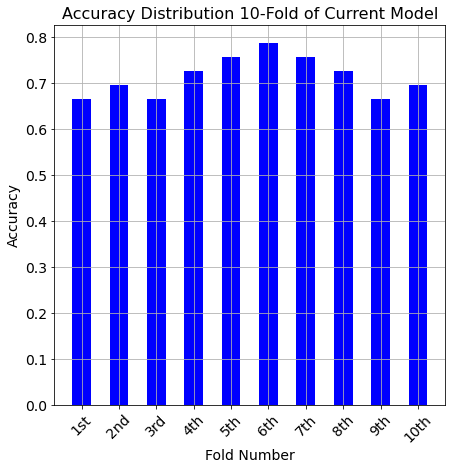

<Figure size 504x504 with 0 Axes>

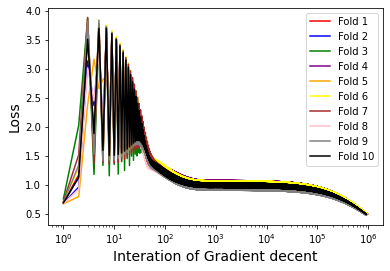

<Figure size 504x504 with 0 Axes>

/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


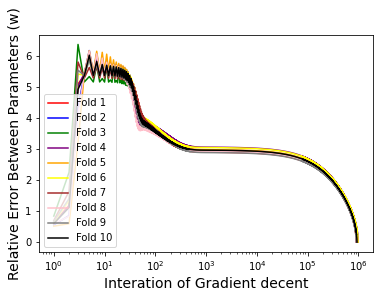

In [ ]:
## Running for the raw data
print('-------- Raw Data Test Start --------')
# create list to save data
raw_order1_accur=[]
raw_order1_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 1
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(1, X_kidney)
## testing 7 different learning rates
learn_test = [10]
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  raw_order1_accur.append(sum(all_acu)/10)
  raw_order1_iteration.append(sum(all_interation)/10)

In [ ]:
learn_para = [4, 1, 0.5, 0.1, 0.05, 0.01, 0.005]

Testing 1. Raw data (Try other learning rates)

-------- Raw Data Test Start --------
The order of the linear model didn't change: 1
The shape of X ---> 330x9
-------- Now testing learing rate is 4--------
No.1 fold start
interations  1618
0.7272727272727273
No.2 fold start
interations  1471
0.696969696969697
No.3 fold start
interations  1586
0.6363636363636364
No.4 fold start
interations  1453
0.8787878787878788
No.5 fold start
interations  1452
0.6666666666666666
No.6 fold start
interations  1501
0.8181818181818182
No.7 fold start
interations  1715
0.5757575757575758
No.8 fold start
interations  1588
0.6060606060606061
No.9 fold start
interations  1444
0.8484848484848485
No.10 fold start
interations  1507
0.7878787878787878
Average Accuracy --> 0.7242424242424244


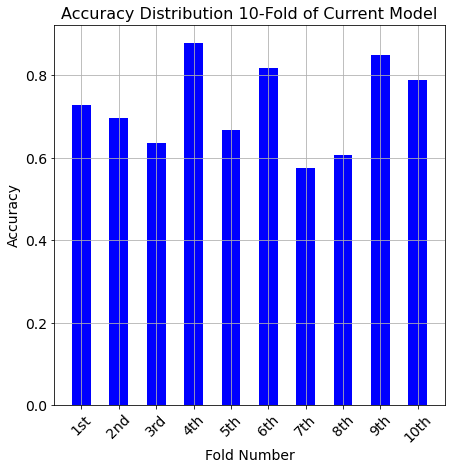

<Figure size 504x504 with 0 Axes>

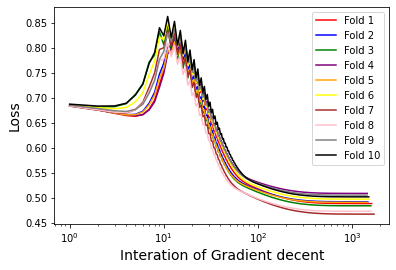

<Figure size 504x504 with 0 Axes>

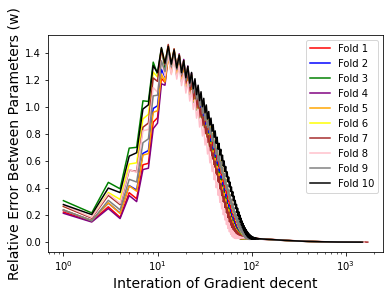

-------- Now testing learing rate is 1--------
No.1 fold start
interations  5015
0.7272727272727273
No.2 fold start
interations  4576
0.696969696969697
No.3 fold start
interations  4904
0.6363636363636364
No.4 fold start
interations  4509
0.8787878787878788
No.5 fold start
interations  4516
0.6666666666666666
No.6 fold start
interations  4657
0.8181818181818182
No.7 fold start
interations  5295
0.5757575757575758
No.8 fold start
interations  4911
0.6060606060606061
No.9 fold start
interations  4492
0.8484848484848485
No.10 fold start
interations  4694
0.7878787878787878
Average Accuracy --> 0.7242424242424244


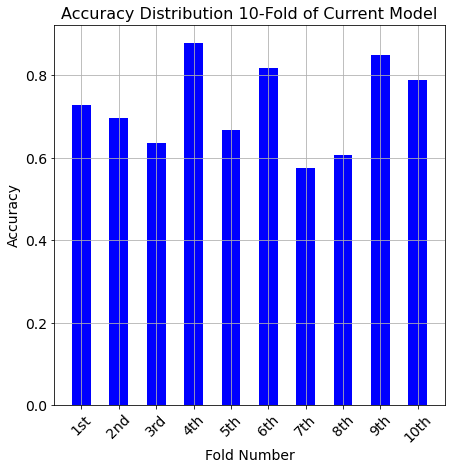

<Figure size 504x504 with 0 Axes>

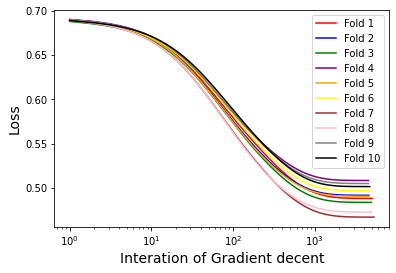

<Figure size 504x504 with 0 Axes>

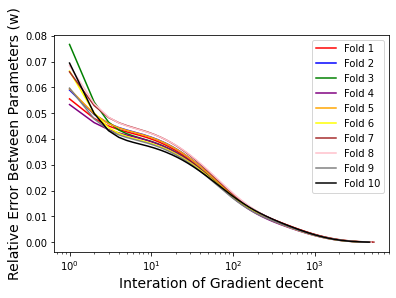

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  8567
0.7272727272727273
No.2 fold start
interations  7840
0.696969696969697
No.3 fold start
interations  8364
0.6363636363636364
No.4 fold start
interations  7709
0.8787878787878788
No.5 fold start
interations  7734
0.6666666666666666
No.6 fold start
interations  7960
0.8181818181818182
No.7 fold start
interations  9018
0.5757575757575758
No.8 fold start
interations  8378
0.6060606060606061
No.9 fold start
interations  7691
0.8484848484848485
No.10 fold start
interations  8042
0.7878787878787878
Average Accuracy --> 0.7242424242424244


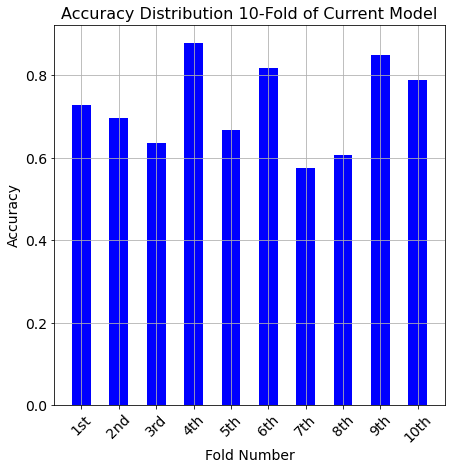

<Figure size 504x504 with 0 Axes>

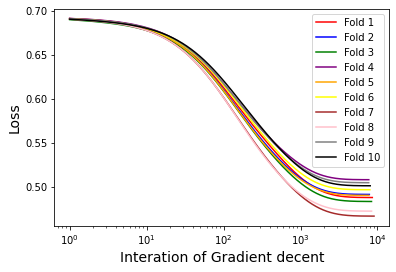

<Figure size 504x504 with 0 Axes>

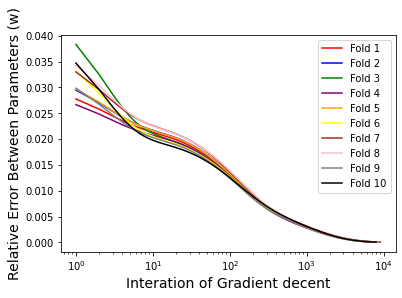

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  26182
0.7272727272727273
No.2 fold start
interations  24235
0.696969696969697
No.3 fold start
interations  25450
0.6363636363636364
No.4 fold start
interations  23626
0.8787878787878788
No.5 fold start
interations  23867
0.6666666666666666
No.6 fold start
interations  24424
0.8181818181818182
No.7 fold start
interations  27210
0.6060606060606061
No.8 fold start
interations  25484
0.6060606060606061
No.9 fold start
interations  23752
0.8484848484848485
No.10 fold start
interations  24873
0.7878787878787878
Average Accuracy --> 0.7272727272727273


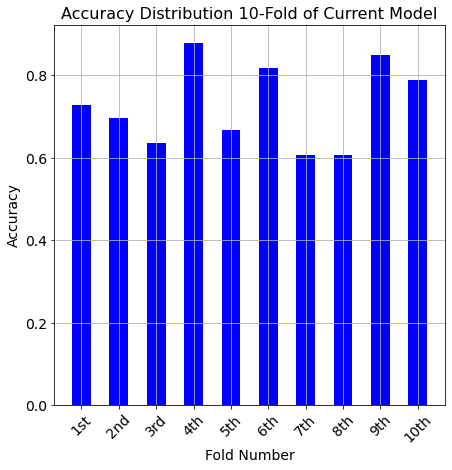

<Figure size 504x504 with 0 Axes>

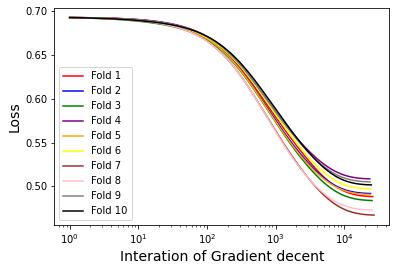

<Figure size 504x504 with 0 Axes>

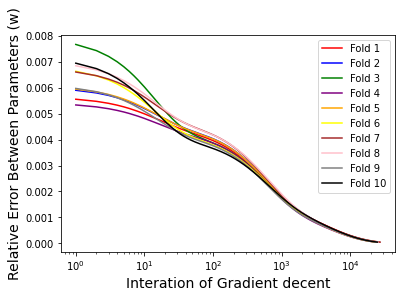

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  38762
0.7272727272727273
No.2 fold start
interations  36180
0.6666666666666666
No.3 fold start
interations  37619
0.6363636363636364
No.4 fold start
interations  35033
0.9090909090909091
No.5 fold start
interations  35560
0.6666666666666666
No.6 fold start
interations  36322
0.8181818181818182
No.7 fold start
interations  39918
0.6060606060606061
No.8 fold start
interations  37601
0.5757575757575758
No.9 fold start
interations  35463
0.8484848484848485
No.10 fold start
interations  37140
0.7878787878787878
Average Accuracy --> 0.7242424242424244


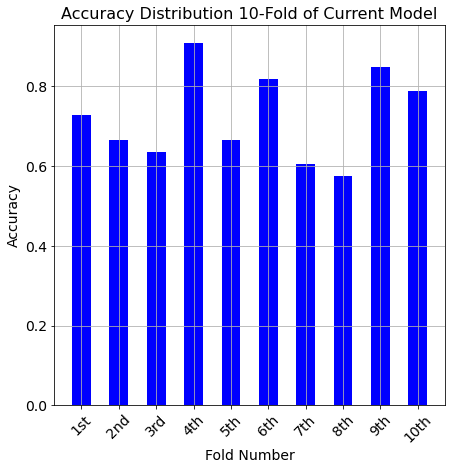

<Figure size 504x504 with 0 Axes>

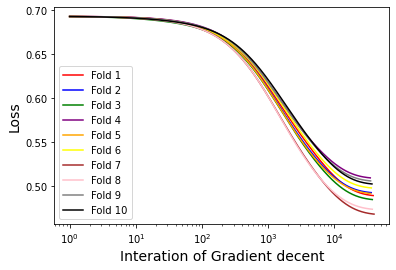

<Figure size 504x504 with 0 Axes>

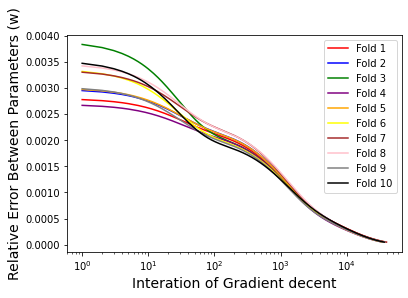

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  61830
0.7272727272727273
No.2 fold start
interations  58650
0.696969696969697
No.3 fold start
interations  58249
0.6363636363636364
No.4 fold start
interations  54166
0.8484848484848485
No.5 fold start
interations  55922
0.6363636363636364
No.6 fold start
interations  58755
0.7878787878787878
No.7 fold start
interations  61386
0.5757575757575758
No.8 fold start
interations  57228
0.5757575757575758
No.9 fold start
interations  56618
0.8787878787878788
No.10 fold start
interations  60545
0.8181818181818182
Average Accuracy --> 0.7181818181818183


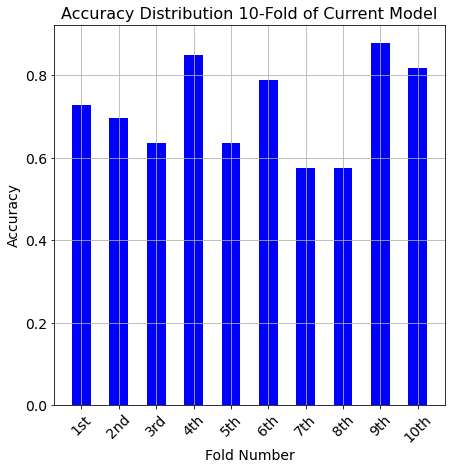

<Figure size 504x504 with 0 Axes>

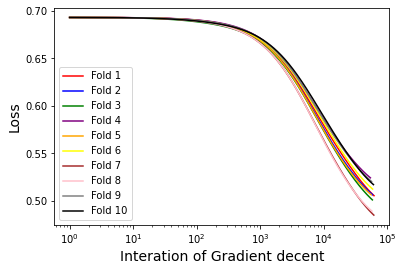

<Figure size 504x504 with 0 Axes>

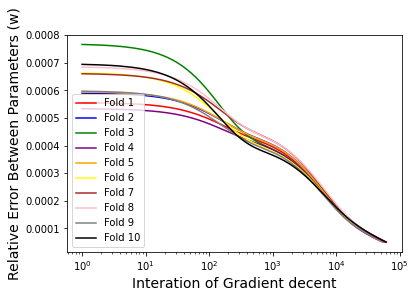

-------- Now testing learing rate is 0.005--------
No.1 fold start
interations  47596
0.7272727272727273
No.2 fold start
interations  48185
0.696969696969697
No.3 fold start
interations  44907
0.6363636363636364
No.4 fold start
interations  42948
0.8181818181818182
No.5 fold start
interations  46014
0.7272727272727273
No.6 fold start
interations  46861
0.7575757575757576
No.7 fold start
interations  48948
0.5454545454545454
No.8 fold start
interations  48319
0.6060606060606061
No.9 fold start
interations  43666
0.8787878787878788
No.10 fold start
interations  48815
0.8484848484848485
Average Accuracy --> 0.7242424242424244


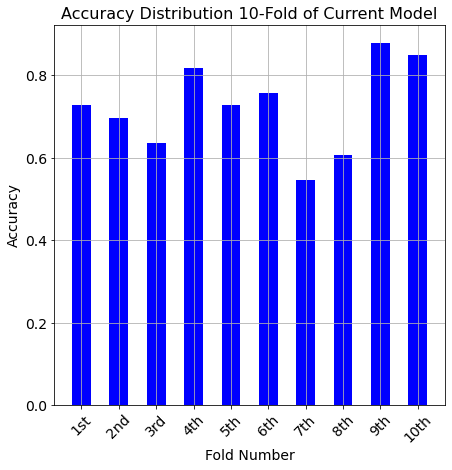

<Figure size 504x504 with 0 Axes>

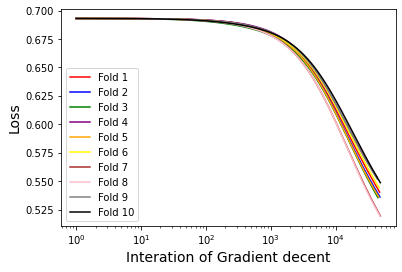

<Figure size 504x504 with 0 Axes>

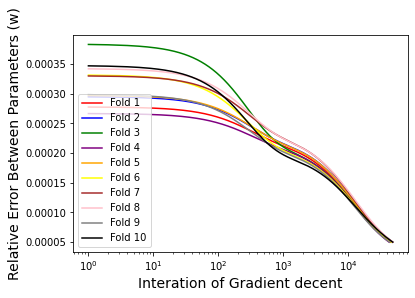

In [ ]:
## Running for the raw data
print('-------- Raw Data Test Start --------')
# create list to save data
raw_order1_accur=[]
raw_order1_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 1
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(1, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  raw_order1_accur.append(sum(all_acu)/10)
  raw_order1_iteration.append(sum(all_interation)/10)

In [ ]:
learn_para = [1, 0.5, 0.25, 0.1, 0.05, 0.025, 0.01]     # new learn because 4 is too high costs overfitting and < 0.005 seems to low becasue loss function not yet converge

Testing 1. Raw data

-------- Raw Data Test Start --------
The order of the linear model didn't change: 1
The shape of X ---> 330x9
-------- Now testing learing rate is 1--------
No.1 fold start
interations  4397
0.7272727272727273
No.2 fold start
interations  4774
0.7575757575757576
No.3 fold start
interations  4361
0.7272727272727273
No.4 fold start
interations  4586
0.7272727272727273
No.5 fold start
interations  4760
0.7878787878787878
No.6 fold start
interations  5060
0.7272727272727273
No.7 fold start
interations  4776
0.6666666666666666
No.8 fold start
interations  5560
0.7272727272727273
No.9 fold start
interations  4923
0.696969696969697
No.10 fold start
interations  4484
0.7272727272727273
Average Accuracy --> 0.7272727272727274


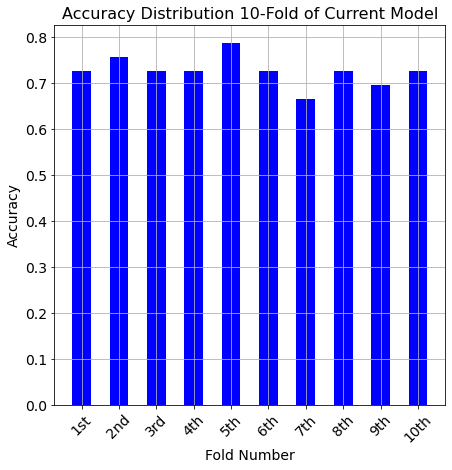

<Figure size 504x504 with 0 Axes>

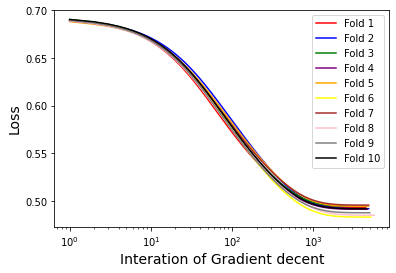

<Figure size 504x504 with 0 Axes>

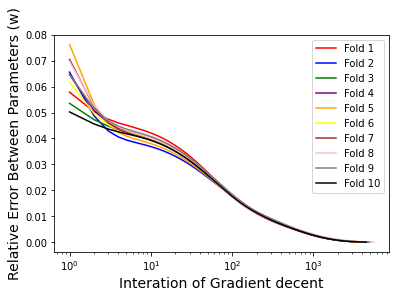

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  7537
0.7272727272727273
No.2 fold start
interations  8170
0.7575757575757576
No.3 fold start
interations  7473
0.7272727272727273
No.4 fold start
interations  7830
0.7272727272727273
No.5 fold start
interations  8154
0.7878787878787878
No.6 fold start
interations  8636
0.7272727272727273
No.7 fold start
interations  8152
0.6666666666666666
No.8 fold start
interations  9477
0.7272727272727273
No.9 fold start
interations  8394
0.696969696969697
No.10 fold start
interations  7689
0.7272727272727273
Average Accuracy --> 0.7272727272727274


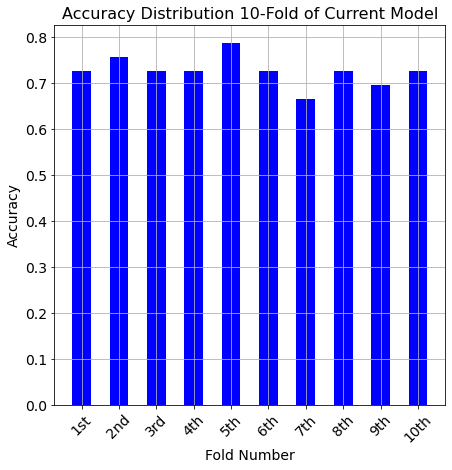

<Figure size 504x504 with 0 Axes>

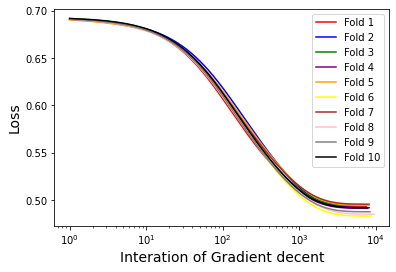

<Figure size 504x504 with 0 Axes>

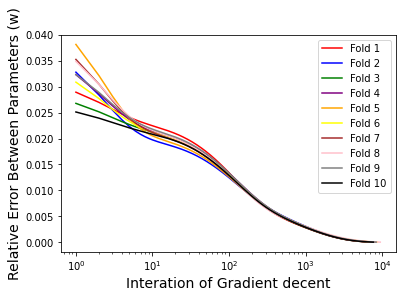

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  12578
0.7272727272727273
No.2 fold start
interations  13607
0.7575757575757576
No.3 fold start
interations  12471
0.7272727272727273
No.4 fold start
interations  13005
0.7272727272727273
No.5 fold start
interations  13594
0.7878787878787878
No.6 fold start
interations  14329
0.7272727272727273
No.7 fold start
interations  13525
0.6666666666666666
No.8 fold start
interations  15685
0.7272727272727273
No.9 fold start
interations  13910
0.696969696969697
No.10 fold start
interations  12837
0.7272727272727273
Average Accuracy --> 0.7272727272727274


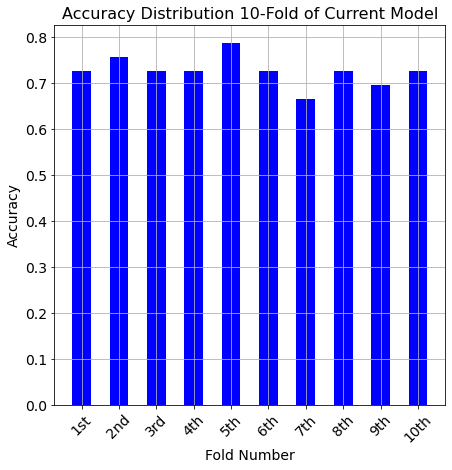

<Figure size 504x504 with 0 Axes>

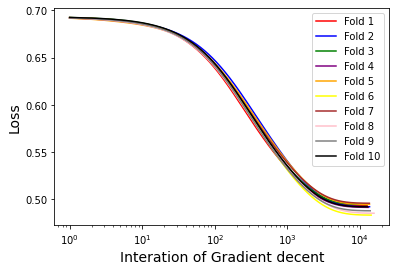

<Figure size 504x504 with 0 Axes>

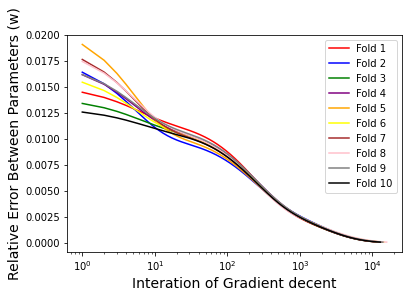

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  23348
0.7272727272727273
No.2 fold start
interations  25164
0.7575757575757576
No.3 fold start
interations  23154
0.7272727272727273
No.4 fold start
interations  23952
0.7272727272727273
No.5 fold start
interations  25181
0.7878787878787878
No.6 fold start
interations  26290
0.7272727272727273
No.7 fold start
interations  24829
0.6666666666666666
No.8 fold start
interations  28594
0.696969696969697
No.9 fold start
interations  25491
0.696969696969697
No.10 fold start
interations  23842
0.7272727272727273
Average Accuracy --> 0.7242424242424244


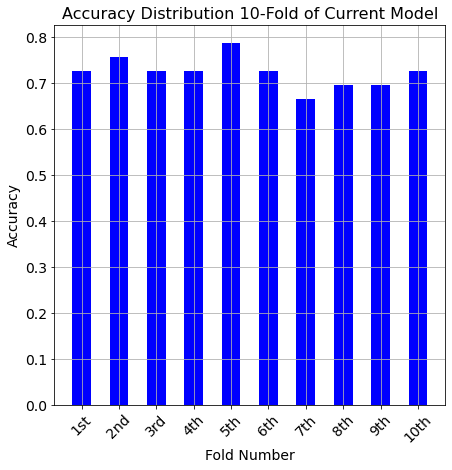

<Figure size 504x504 with 0 Axes>

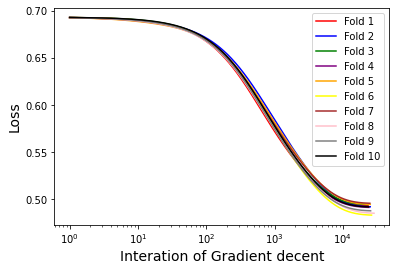

<Figure size 504x504 with 0 Axes>

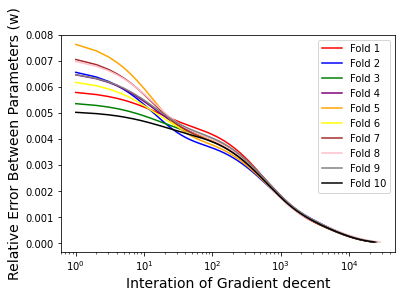

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  34899
0.7272727272727273
No.2 fold start
interations  37490
0.7575757575757576
No.3 fold start
interations  34632
0.7272727272727273
No.4 fold start
interations  35569
0.7272727272727273
No.5 fold start
interations  37544
0.8181818181818182
No.6 fold start
interations  38784
0.7272727272727273
No.7 fold start
interations  36699
0.696969696969697
No.8 fold start
interations  41810
0.696969696969697
No.9 fold start
interations  37619
0.696969696969697
No.10 fold start
interations  35651
0.7575757575757576
Average Accuracy --> 0.7333333333333335


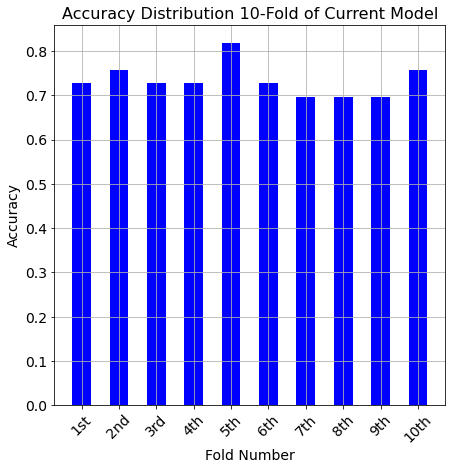

<Figure size 504x504 with 0 Axes>

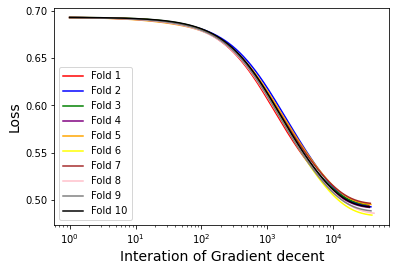

<Figure size 504x504 with 0 Axes>

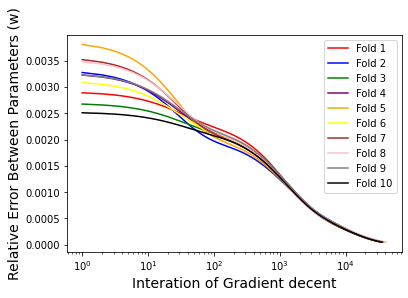

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  47713
0.7272727272727273
No.2 fold start
interations  51177
0.7575757575757576
No.3 fold start
interations  47407
0.7272727272727273
No.4 fold start
interations  48387
0.696969696969697
No.5 fold start
interations  51178
0.7878787878787878
No.6 fold start
interations  52100
0.696969696969697
No.7 fold start
interations  49554
0.7272727272727273
No.8 fold start
interations  55448
0.696969696969697
No.9 fold start
interations  50713
0.696969696969697
No.10 fold start
interations  48779
0.7575757575757576
Average Accuracy --> 0.7272727272727274


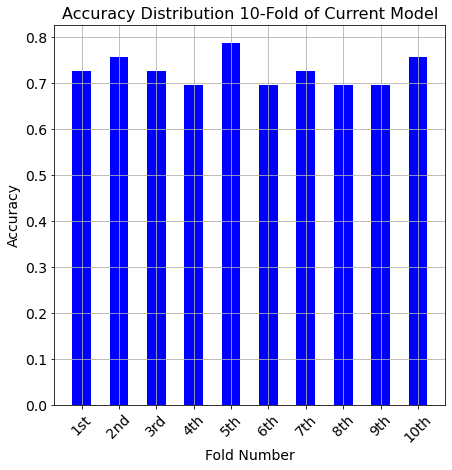

<Figure size 504x504 with 0 Axes>

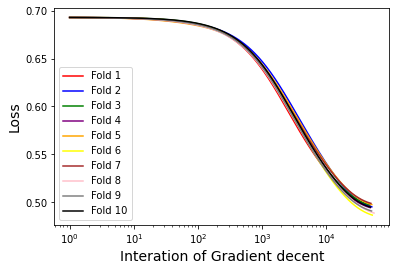

<Figure size 504x504 with 0 Axes>

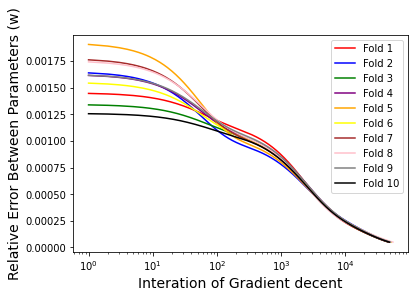

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  55588
0.6666666666666666
No.2 fold start
interations  61162
0.7878787878787878
No.3 fold start
interations  55839
0.696969696969697
No.4 fold start
interations  57122
0.6666666666666666
No.5 fold start
interations  60340
0.7878787878787878
No.6 fold start
interations  59512
0.696969696969697
No.7 fold start
interations  57339
0.7575757575757576
No.8 fold start
interations  61590
0.696969696969697
No.9 fold start
interations  59100
0.696969696969697
No.10 fold start
interations  57357
0.696969696969697
Average Accuracy --> 0.7151515151515152


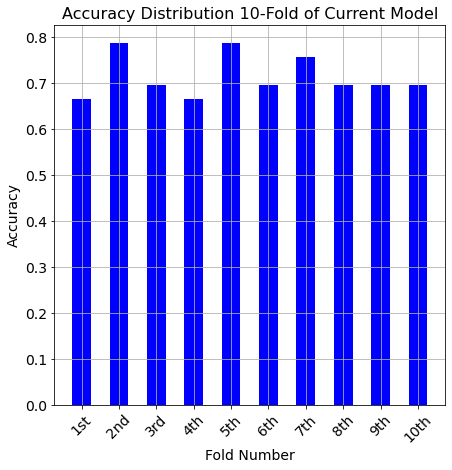

<Figure size 504x504 with 0 Axes>

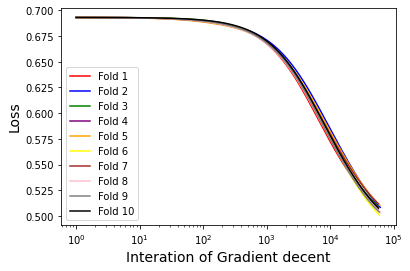

<Figure size 504x504 with 0 Axes>

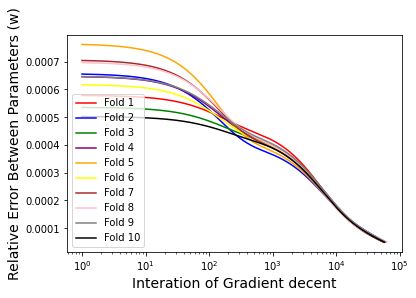

In [ ]:
## Running for the raw data
print('-------- Raw Data Test Start --------')
# create list to save data
raw_order1_accur=[]
raw_order1_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 1
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(1, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  raw_order1_accur.append(sum(all_acu)/10)
  raw_order1_iteration.append(sum(all_interation)/10)

Test 2. Standardization features

-------- Standardization Data Test Start --------
The order of the linear model didn't change: 1
The shape of X ---> 330x9
-------- Now testing learing rate is 1--------
No.1 fold start
interations  1363
0.7575757575757576
No.2 fold start
interations  1198
0.7575757575757576
No.3 fold start
interations  1243
0.6060606060606061
No.4 fold start
interations  1235
0.7272727272727273
No.5 fold start
interations  1216
0.6666666666666666
No.6 fold start
interations  1345
0.7272727272727273
No.7 fold start
interations  1287
0.7272727272727273
No.8 fold start
interations  1261
0.696969696969697
No.9 fold start
interations  1184
0.7878787878787878
No.10 fold start
interations  1243
0.7575757575757576
Average Accuracy --> 0.7212121212121213


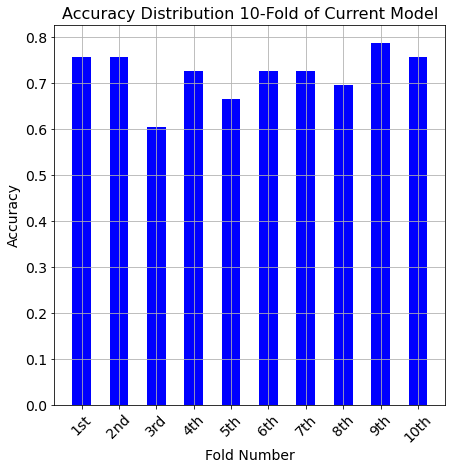

<Figure size 504x504 with 0 Axes>

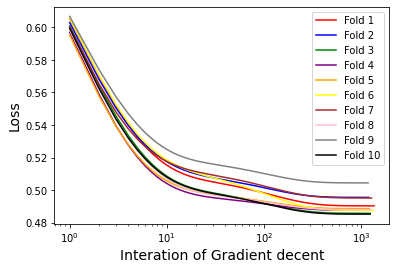

<Figure size 504x504 with 0 Axes>

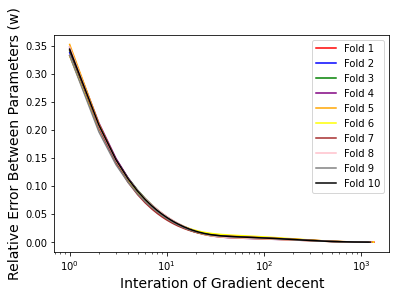

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  2375
0.7575757575757576
No.2 fold start
interations  2087
0.7575757575757576
No.3 fold start
interations  2165
0.6060606060606061
No.4 fold start
interations  2135
0.7272727272727273
No.5 fold start
interations  2108
0.6666666666666666
No.6 fold start
interations  2352
0.7272727272727273
No.7 fold start
interations  2244
0.7272727272727273
No.8 fold start
interations  2185
0.696969696969697
No.9 fold start
interations  2061
0.7878787878787878
No.10 fold start
interations  2165
0.7575757575757576
Average Accuracy --> 0.7212121212121213


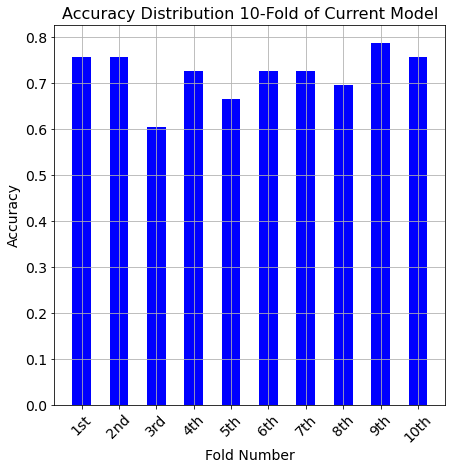

<Figure size 504x504 with 0 Axes>

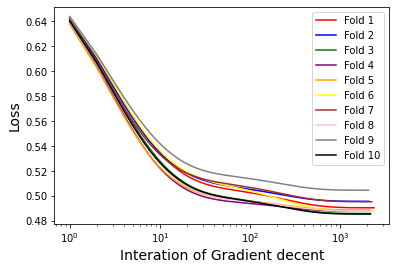

<Figure size 504x504 with 0 Axes>

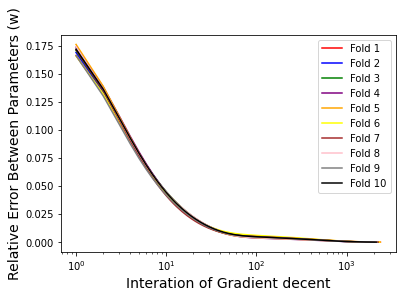

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  4046
0.7575757575757576
No.2 fold start
interations  3555
0.7575757575757576
No.3 fold start
interations  3686
0.6060606060606061
No.4 fold start
interations  3598
0.7272727272727273
No.5 fold start
interations  3565
0.6666666666666666
No.6 fold start
interations  4027
0.7272727272727273
No.7 fold start
interations  3824
0.7272727272727273
No.8 fold start
interations  3697
0.696969696969697
No.9 fold start
interations  3510
0.7878787878787878
No.10 fold start
interations  3687
0.7575757575757576
Average Accuracy --> 0.7212121212121213


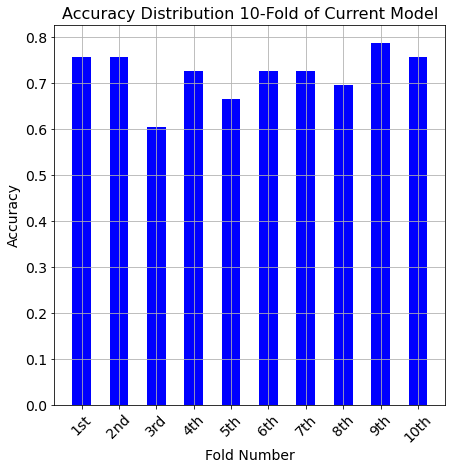

<Figure size 504x504 with 0 Axes>

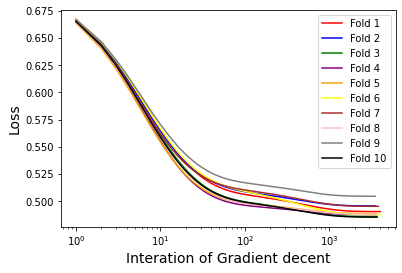

<Figure size 504x504 with 0 Axes>

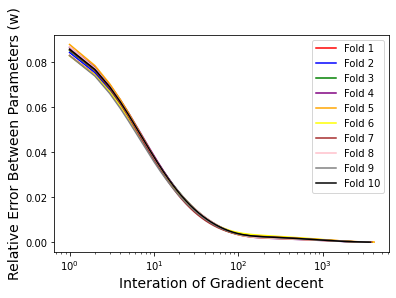

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  7796
0.7575757575757576
No.2 fold start
interations  6842
0.7575757575757576
No.3 fold start
interations  7089
0.6060606060606061
No.4 fold start
interations  6774
0.7272727272727273
No.5 fold start
interations  6762
0.696969696969697
No.6 fold start
interations  7837
0.7272727272727273
No.7 fold start
interations  7373
0.7272727272727273
No.8 fold start
interations  7018
0.7272727272727273
No.9 fold start
interations  6750
0.7878787878787878
No.10 fold start
interations  7092
0.7575757575757576
Average Accuracy --> 0.7272727272727274


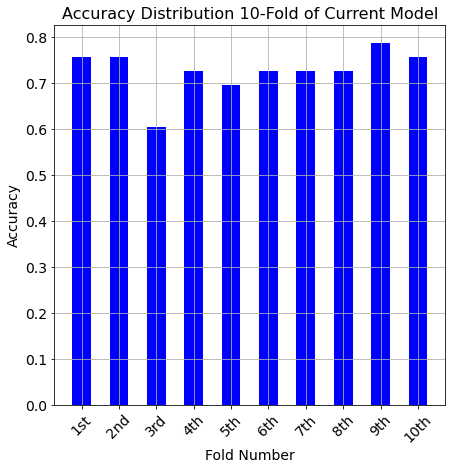

<Figure size 504x504 with 0 Axes>

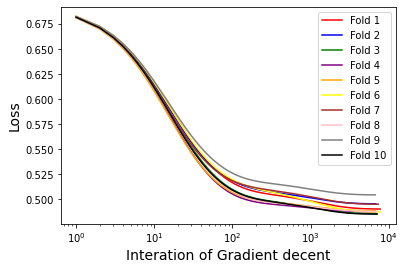

<Figure size 504x504 with 0 Axes>

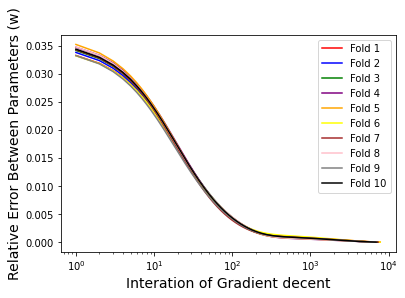

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  12094
0.7575757575757576
No.2 fold start
interations  10598
0.7575757575757576
No.3 fold start
interations  10972
0.6060606060606061
No.4 fold start
interations  10197
0.7272727272727273
No.5 fold start
interations  10280
0.696969696969697
No.6 fold start
interations  12317
0.7272727272727273
No.7 fold start
interations  11449
0.7272727272727273
No.8 fold start
interations  10676
0.7272727272727273
No.9 fold start
interations  10446
0.7878787878787878
No.10 fold start
interations  10983
0.7575757575757576
Average Accuracy --> 0.7272727272727274


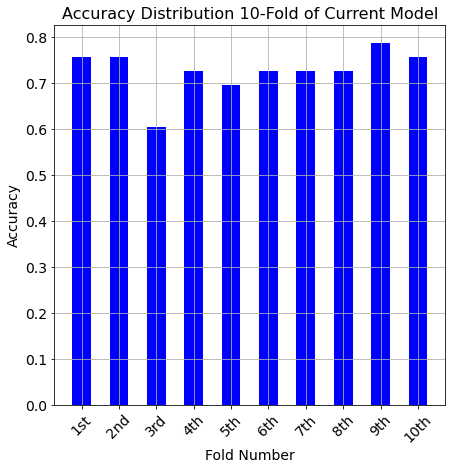

<Figure size 504x504 with 0 Axes>

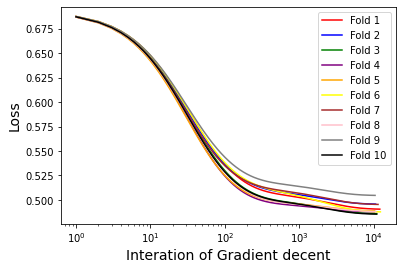

<Figure size 504x504 with 0 Axes>

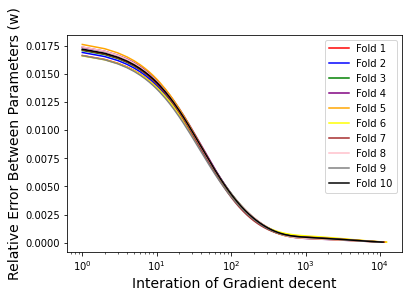

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  17243
0.7575757575757576
No.2 fold start
interations  15059
0.7878787878787878
No.3 fold start
interations  15581
0.6060606060606061
No.4 fold start
interations  13735
0.7272727272727273
No.5 fold start
interations  14110
0.696969696969697
No.6 fold start
interations  17989
0.7575757575757576
No.7 fold start
interations  16360
0.7575757575757576
No.8 fold start
interations  14662
0.696969696969697
No.9 fold start
interations  14823
0.7878787878787878
No.10 fold start
interations  15610
0.7878787878787878
Average Accuracy --> 0.7363636363636366


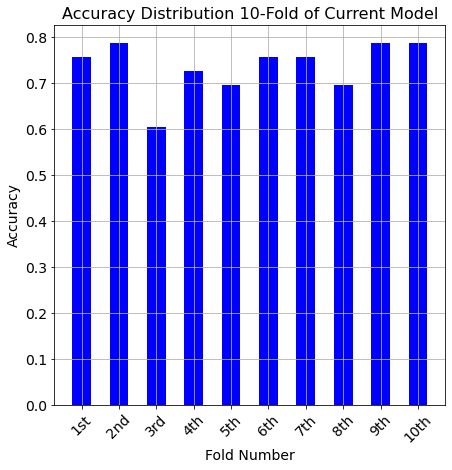

<Figure size 504x504 with 0 Axes>

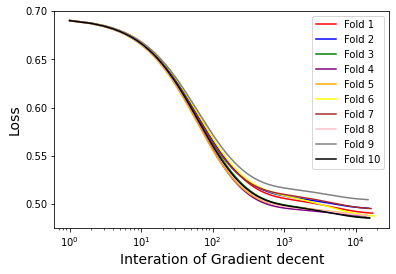

<Figure size 504x504 with 0 Axes>

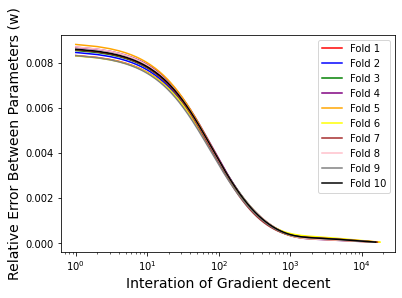

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  20619
0.696969696969697
No.2 fold start
interations  17712
0.7878787878787878
No.3 fold start
interations  18350
0.6060606060606061
No.4 fold start
interations  12780
0.7272727272727273
No.5 fold start
interations  14338
0.6363636363636364
No.6 fold start
interations  23611
0.7575757575757576
No.7 fold start
interations  19793
0.7575757575757576
No.8 fold start
interations  14854
0.6666666666666666
No.9 fold start
interations  17364
0.7878787878787878
No.10 fold start
interations  18464
0.7575757575757576
Average Accuracy --> 0.7181818181818183


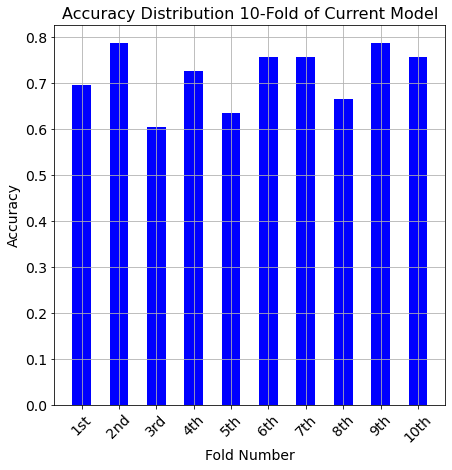

<Figure size 504x504 with 0 Axes>

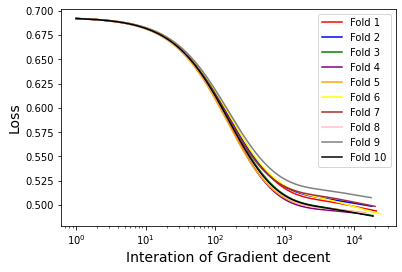

<Figure size 504x504 with 0 Axes>

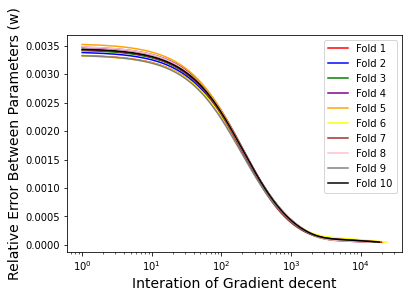

In [ ]:
## Running for the Standardization data
print('-------- Standardization Data Test Start --------')
# create list to save data
std_order1_accur=[]
std_order1_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
X_kidney = featureStandardization(X_kidney)
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 1
X_kidney = changeModelOrder(1, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  std_order1_accur.append(sum(all_acu)/10)
  std_order1_iteration.append(sum(all_interation)/10)

Test 3. Removing outlier

-------- Remove Outliers Data Test Start --------
The order of the linear model didn't change: 1
The shape of X ---> 296x9
-------- Now testing learing rate is 1--------
No.1 fold start
interations  5901
0.7241379310344828
No.2 fold start
interations  6673
0.7241379310344828
No.3 fold start
interations  6782
0.7586206896551724
No.4 fold start
interations  5922
0.6206896551724138
No.5 fold start
interations  6189
0.8275862068965517
No.6 fold start
interations  6291
0.7241379310344828
No.7 fold start
interations  6924
0.6551724137931034
No.8 fold start
interations  6164
0.6551724137931034
No.9 fold start
interations  6730
0.6896551724137931
No.10 fold start
interations  6698
0.7428571428571429
Average Accuracy --> 0.7122167487684729


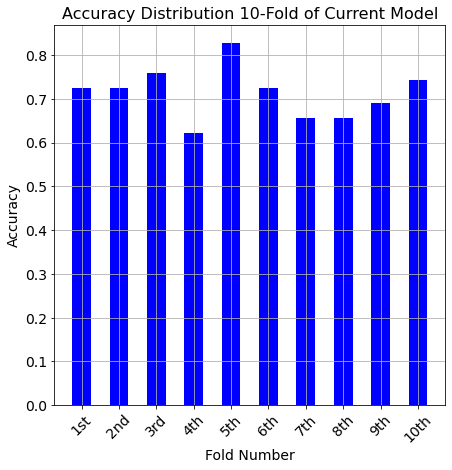

<Figure size 504x504 with 0 Axes>

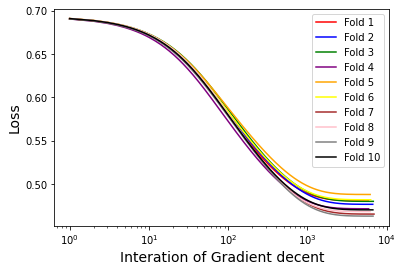

<Figure size 504x504 with 0 Axes>

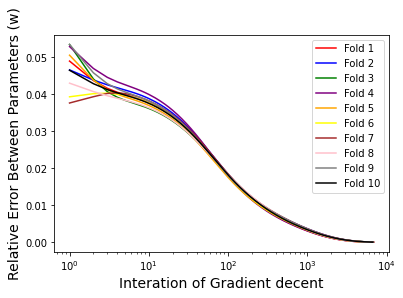

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  10007
0.7241379310344828
No.2 fold start
interations  11351
0.7241379310344828
No.3 fold start
interations  11487
0.7586206896551724
No.4 fold start
interations  10039
0.6206896551724138
No.5 fold start
interations  10503
0.8275862068965517
No.6 fold start
interations  10667
0.7241379310344828
No.7 fold start
interations  11744
0.6551724137931034
No.8 fold start
interations  10467
0.6551724137931034
No.9 fold start
interations  11404
0.6896551724137931
No.10 fold start
interations  11330
0.7428571428571429
Average Accuracy --> 0.7122167487684729


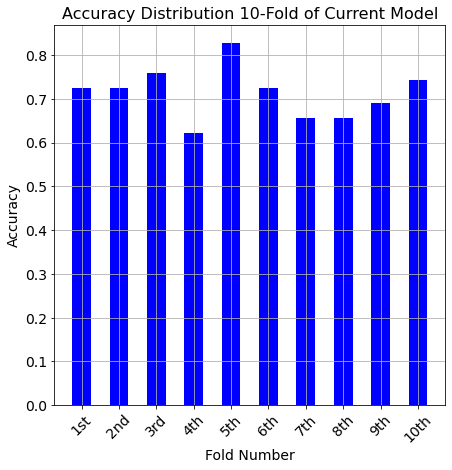

<Figure size 504x504 with 0 Axes>

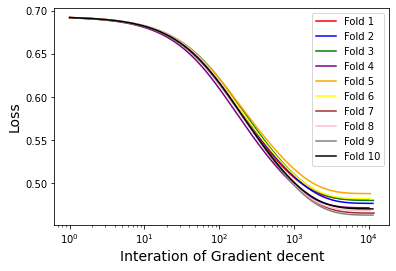

<Figure size 504x504 with 0 Axes>

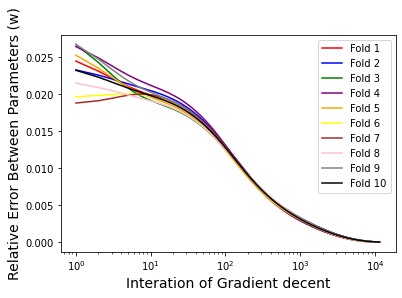

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  16460
0.7241379310344828
No.2 fold start
interations  18747
0.7241379310344828
No.3 fold start
interations  18850
0.7586206896551724
No.4 fold start
interations  16509
0.6206896551724138
No.5 fold start
interations  17295
0.8275862068965517
No.6 fold start
interations  17544
0.7241379310344828
No.7 fold start
interations  19314
0.6551724137931034
No.8 fold start
interations  17253
0.6551724137931034
No.9 fold start
interations  18742
0.6896551724137931
No.10 fold start
interations  18566
0.7428571428571429
Average Accuracy --> 0.7122167487684729


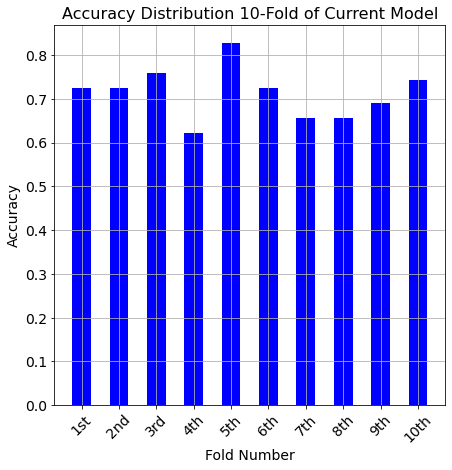

<Figure size 504x504 with 0 Axes>

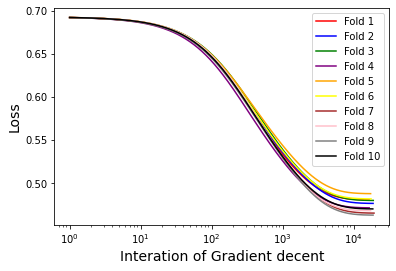

<Figure size 504x504 with 0 Axes>

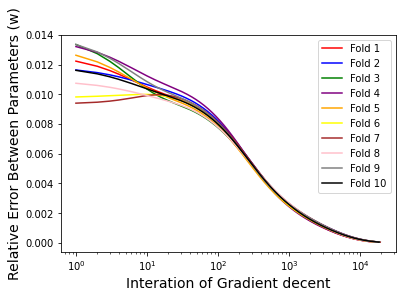

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  29716
0.7241379310344828
No.2 fold start
interations  34070
0.7241379310344828
No.3 fold start
interations  33781
0.7586206896551724
No.4 fold start
interations  29783
0.6206896551724138
No.5 fold start
interations  31269
0.8275862068965517
No.6 fold start
interations  31645
0.7241379310344828
No.7 fold start
interations  34791
0.6551724137931034
No.8 fold start
interations  31281
0.6551724137931034
No.9 fold start
interations  33764
0.6896551724137931
No.10 fold start
interations  33218
0.7142857142857143
Average Accuracy --> 0.70935960591133


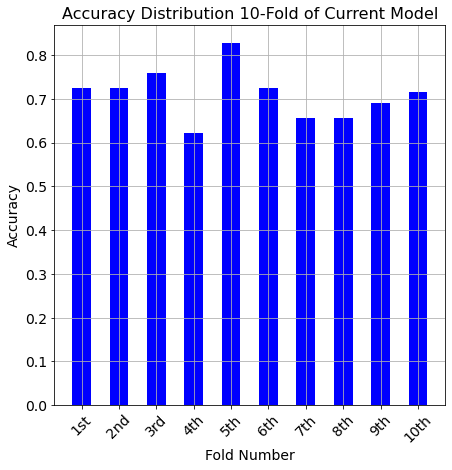

<Figure size 504x504 with 0 Axes>

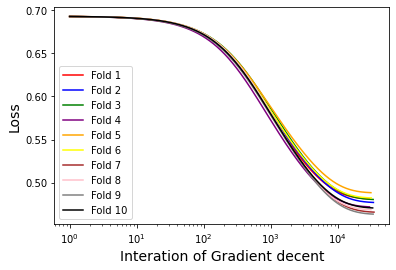

<Figure size 504x504 with 0 Axes>

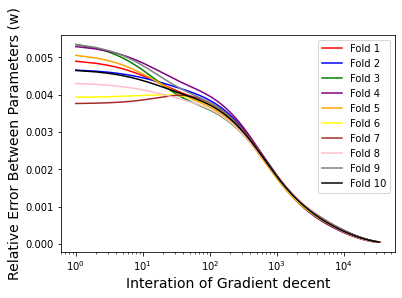

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  43032
0.7241379310344828
No.2 fold start
interations  49607
0.7241379310344828
No.3 fold start
interations  48431
0.7586206896551724
No.4 fold start
interations  43066
0.6206896551724138
No.5 fold start
interations  45332
0.7931034482758621
No.6 fold start
interations  45762
0.7241379310344828
No.7 fold start
interations  50189
0.6551724137931034
No.8 fold start
interations  45561
0.6206896551724138
No.9 fold start
interations  48827
0.6896551724137931
No.10 fold start
interations  47594
0.7142857142857143
Average Accuracy --> 0.7024630541871921


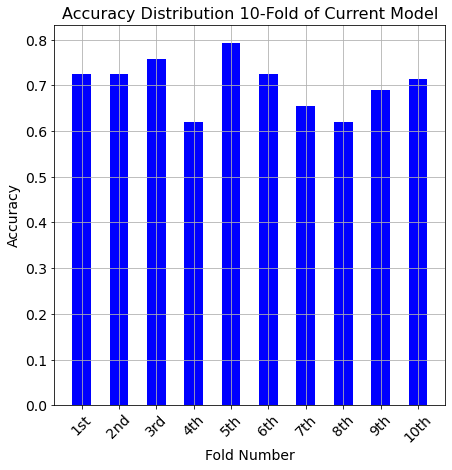

<Figure size 504x504 with 0 Axes>

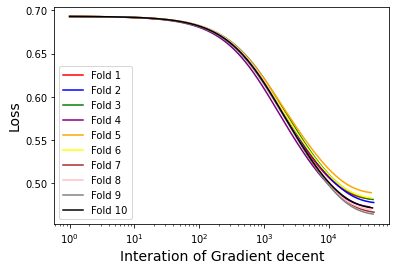

<Figure size 504x504 with 0 Axes>

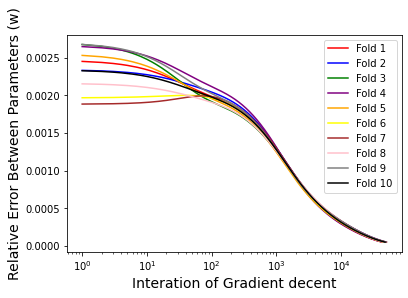

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  55992
0.6896551724137931
No.2 fold start
interations  64941
0.7241379310344828
No.3 fold start
interations  62336
0.8275862068965517
No.4 fold start
interations  55842
0.6206896551724138
No.5 fold start
interations  59123
0.7931034482758621
No.6 fold start
interations  59469
0.7241379310344828
No.7 fold start
interations  65108
0.6551724137931034
No.8 fold start
interations  60012
0.6551724137931034
No.9 fold start
interations  63782
0.6896551724137931
No.10 fold start
interations  61166
0.7142857142857143
Average Accuracy --> 0.70935960591133


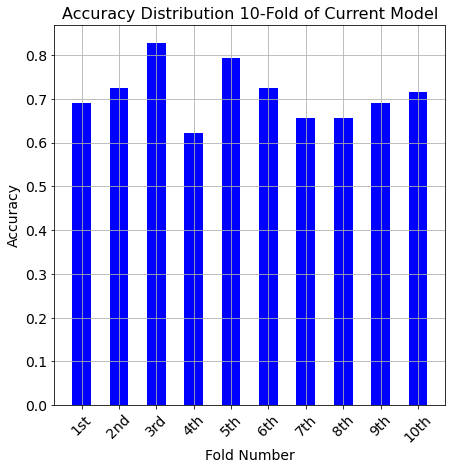

<Figure size 504x504 with 0 Axes>

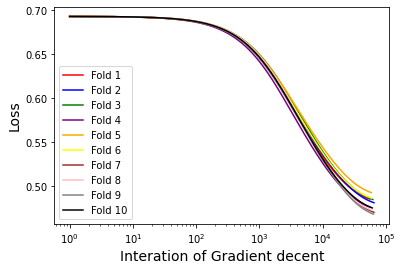

<Figure size 504x504 with 0 Axes>

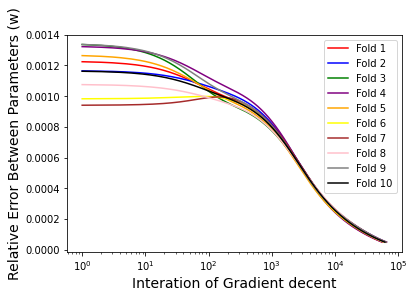

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  59129
0.6896551724137931
No.2 fold start
interations  68167
0.7586206896551724
No.3 fold start
interations  65151
0.8275862068965517
No.4 fold start
interations  58242
0.6206896551724138
No.5 fold start
interations  62257
0.8275862068965517
No.6 fold start
interations  62525
0.6896551724137931
No.7 fold start
interations  68838
0.6551724137931034
No.8 fold start
interations  65714
0.6896551724137931
No.9 fold start
interations  68305
0.7241379310344828
No.10 fold start
interations  63577
0.6857142857142857
Average Accuracy --> 0.7168472906403942


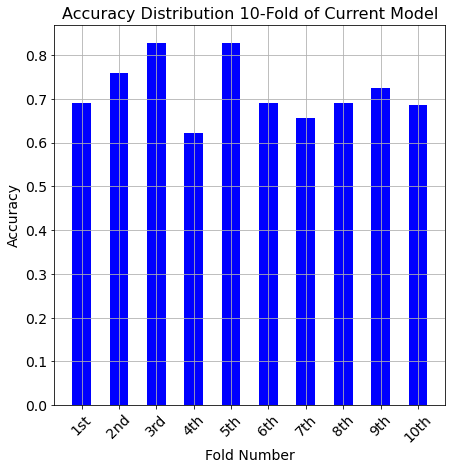

<Figure size 504x504 with 0 Axes>

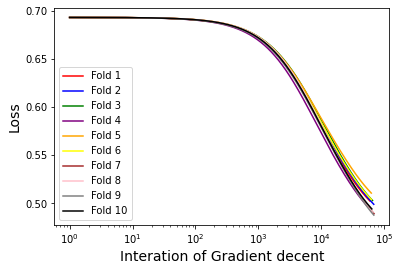

<Figure size 504x504 with 0 Axes>

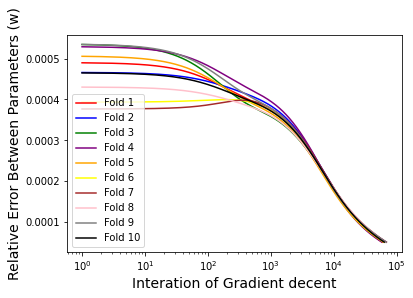

In [ ]:
## Running for the remove outlier data
print('-------- Remove Outliers Data Test Start --------')
# create list to save data
remove_order1_accur=[]
remove_order1_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
columns = ['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
# remove outlier in features
outliers = detect_outliers(kidney_df, columns)
outliers = list(set(outliers))
kidney_df = kidney_df.drop(outliers)
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 1
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(1, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove_order1_accur.append(sum(all_acu)/10)
  remove_order1_iteration.append(sum(all_interation)/10)

Test 4. Removing relatively low correlation value between features and label (Age and heart rate)

-------- Remove Data Test2 Start --------
The order of the linear model didn't change: 1
The shape of X ---> 330x7
-------- Now testing learing rate is 1--------
No.1 fold start
interations  4138
0.696969696969697
No.2 fold start
interations  4795
0.5757575757575758
No.3 fold start
interations  4055
0.7272727272727273
No.4 fold start
interations  4114
0.7878787878787878
No.5 fold start
interations  4775
0.5757575757575758
No.6 fold start
interations  4241
0.7878787878787878
No.7 fold start
interations  4363
0.6060606060606061
No.8 fold start
interations  4737
0.7272727272727273
No.9 fold start
interations  4035
0.8484848484848485
No.10 fold start
interations  4096
0.8484848484848485
Average Accuracy --> 0.7181818181818183


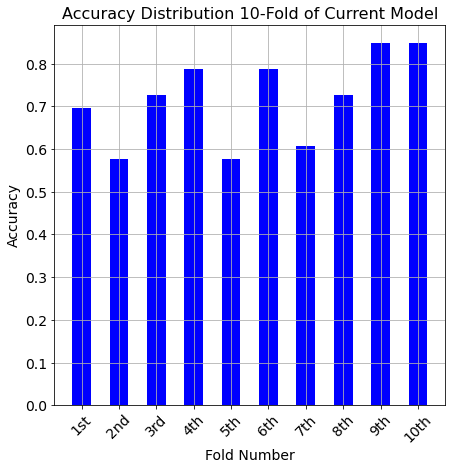

<Figure size 504x504 with 0 Axes>

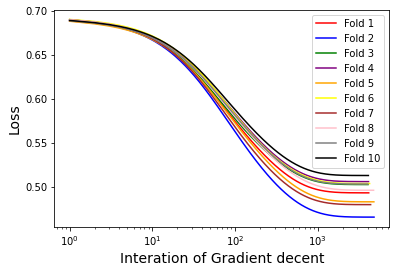

<Figure size 504x504 with 0 Axes>

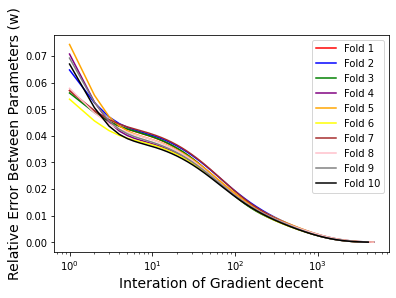

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  7116
0.696969696969697
No.2 fold start
interations  8219
0.5757575757575758
No.3 fold start
interations  6975
0.7272727272727273
No.4 fold start
interations  7071
0.7878787878787878
No.5 fold start
interations  8192
0.5757575757575758
No.6 fold start
interations  7283
0.7878787878787878
No.7 fold start
interations  7498
0.6060606060606061
No.8 fold start
interations  8133
0.7272727272727273
No.9 fold start
interations  6946
0.8484848484848485
No.10 fold start
interations  7040
0.8484848484848485
Average Accuracy --> 0.7181818181818183


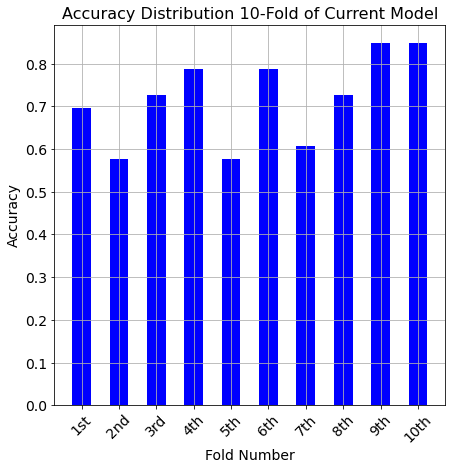

<Figure size 504x504 with 0 Axes>

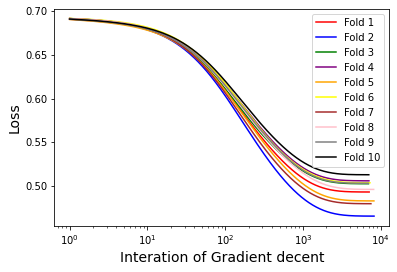

<Figure size 504x504 with 0 Axes>

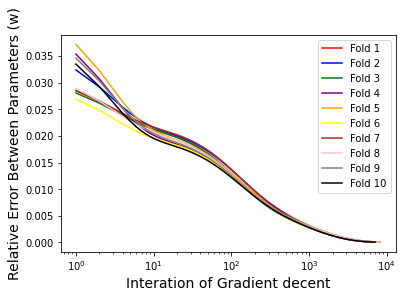

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  11928
0.696969696969697
No.2 fold start
interations  13715
0.5757575757575758
No.3 fold start
interations  11693
0.7272727272727273
No.4 fold start
interations  11840
0.7878787878787878
No.5 fold start
interations  13682
0.5757575757575758
No.6 fold start
interations  12180
0.7878787878787878
No.7 fold start
interations  12558
0.6060606060606061
No.8 fold start
interations  13600
0.7272727272727273
No.9 fold start
interations  11655
0.8484848484848485
No.10 fold start
interations  11789
0.8484848484848485
Average Accuracy --> 0.7181818181818183


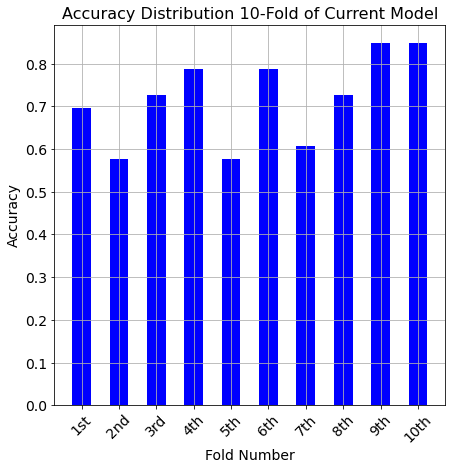

<Figure size 504x504 with 0 Axes>

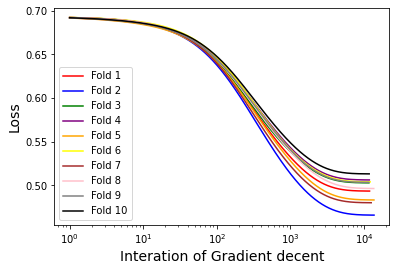

<Figure size 504x504 with 0 Axes>

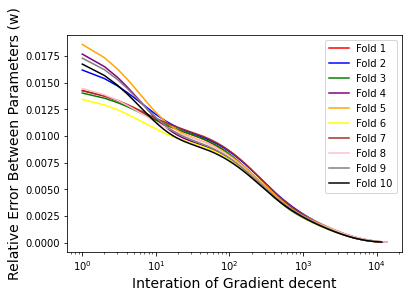

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  22323
0.696969696969697
No.2 fold start
interations  25446
0.5757575757575758
No.3 fold start
interations  21888
0.7272727272727273
No.4 fold start
interations  22119
0.7878787878787878
No.5 fold start
interations  25421
0.5757575757575758
No.6 fold start
interations  22689
0.7878787878787878
No.7 fold start
interations  23462
0.6363636363636364
No.8 fold start
interations  25330
0.7272727272727273
No.9 fold start
interations  21863
0.8484848484848485
No.10 fold start
interations  22018
0.8484848484848485
Average Accuracy --> 0.7212121212121213


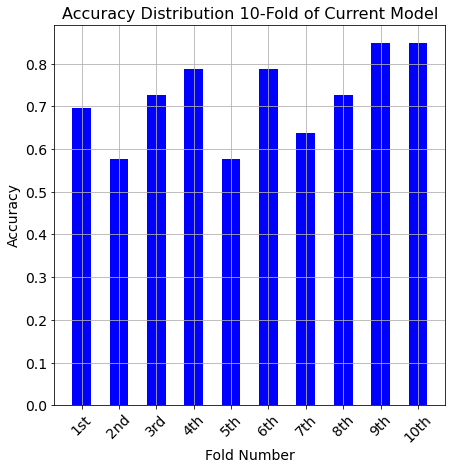

<Figure size 504x504 with 0 Axes>

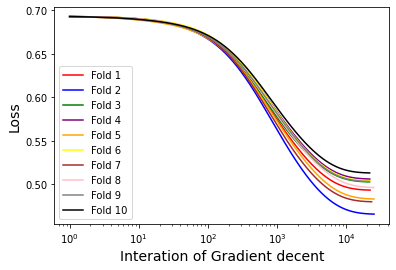

<Figure size 504x504 with 0 Axes>

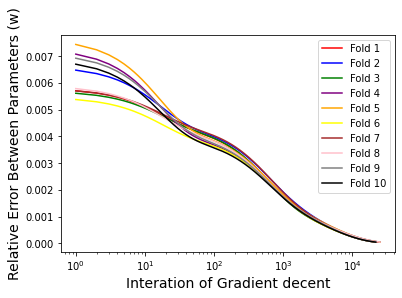

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  33680
0.696969696969697
No.2 fold start
interations  38021
0.5757575757575758
No.3 fold start
interations  33013
0.7272727272727273
No.4 fold start
interations  33314
0.7878787878787878
No.5 fold start
interations  38039
0.5757575757575758
No.6 fold start
interations  34018
0.7878787878787878
No.7 fold start
interations  35329
0.6363636363636364
No.8 fold start
interations  37977
0.7272727272727273
No.9 fold start
interations  33076
0.8484848484848485
No.10 fold start
interations  33127
0.8484848484848485
Average Accuracy --> 0.7212121212121213


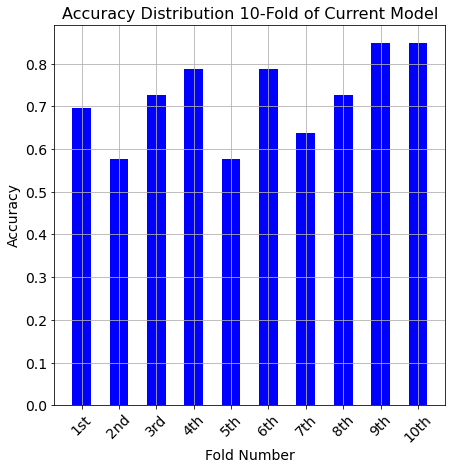

<Figure size 504x504 with 0 Axes>

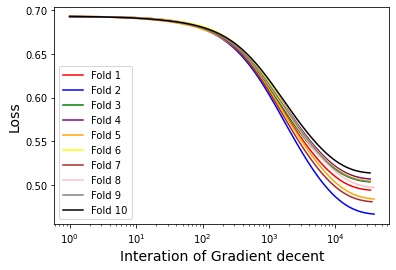

<Figure size 504x504 with 0 Axes>

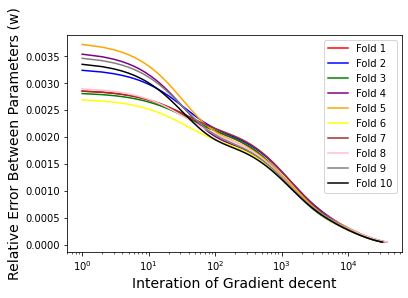

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  46672
0.696969696969697
No.2 fold start
interations  51995
0.5757575757575758
No.3 fold start
interations  45677
0.7272727272727273
No.4 fold start
interations  46053
0.7878787878787878
No.5 fold start
interations  52206
0.5757575757575758
No.6 fold start
interations  46559
0.7878787878787878
No.7 fold start
interations  48850
0.6363636363636364
No.8 fold start
interations  52003
0.7878787878787878
No.9 fold start
interations  46027
0.8181818181818182
No.10 fold start
interations  45637
0.8484848484848485
Average Accuracy --> 0.7242424242424244


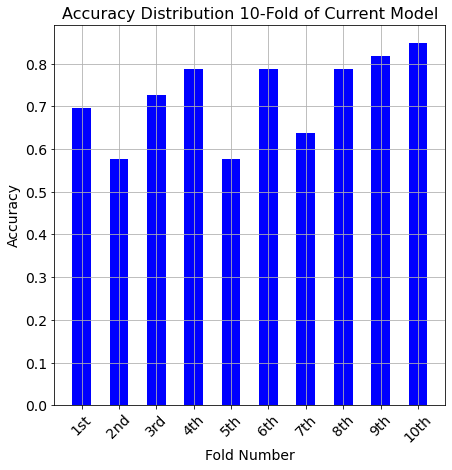

<Figure size 504x504 with 0 Axes>

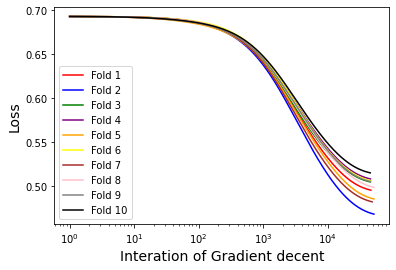

<Figure size 504x504 with 0 Axes>

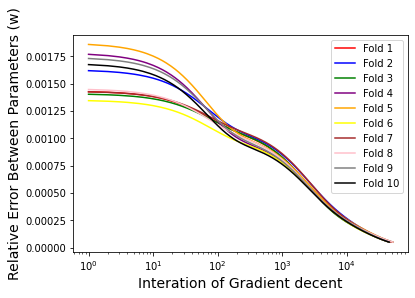

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  56461
0.6363636363636364
No.2 fold start
interations  61682
0.5151515151515151
No.3 fold start
interations  54496
0.7575757575757576
No.4 fold start
interations  55290
0.7878787878787878
No.5 fold start
interations  62724
0.6363636363636364
No.6 fold start
interations  53609
0.7878787878787878
No.7 fold start
interations  59158
0.6060606060606061
No.8 fold start
interations  60255
0.7878787878787878
No.9 fold start
interations  56251
0.7575757575757576
No.10 fold start
interations  54069
0.8484848484848485
Average Accuracy --> 0.7121212121212122


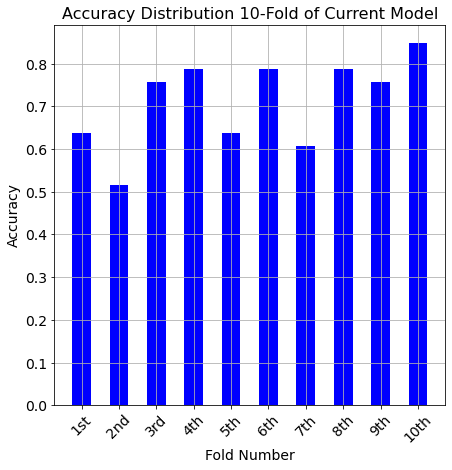

<Figure size 504x504 with 0 Axes>

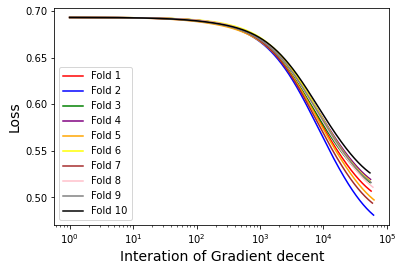

<Figure size 504x504 with 0 Axes>

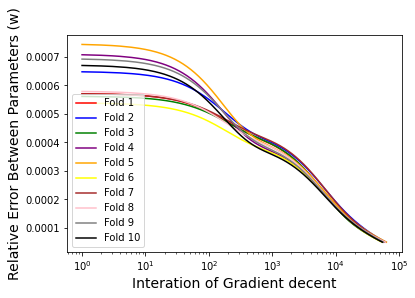

In [ ]:
## Running 
print('-------- Remove Data Test2 Start --------')
# create list to save data
remove2_order1_accur=[]
remove2_order1_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 1
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(1, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove2_order1_accur.append(sum(all_acu)/10)
  remove2_order1_iteration.append(sum(all_interation)/10)

Test 5. Removing features has many 0 values (SkinThickness, Heart rate)

-------- Remove Data Test3 Start --------
The order of the linear model didn't change: 1
The shape of X ---> 330x7
-------- Now testing learing rate is 1--------
No.1 fold start
interations  3839
0.6060606060606061
No.2 fold start
interations  3789
0.7575757575757576
No.3 fold start
interations  4158
0.5757575757575758
No.4 fold start
interations  4618
0.6363636363636364
No.5 fold start
interations  3684
0.9090909090909091
No.6 fold start
interations  3822
0.7272727272727273
No.7 fold start
interations  3634
0.8484848484848485
No.8 fold start
interations  3722
0.8181818181818182
No.9 fold start
interations  4717
0.6060606060606061
No.10 fold start
interations  3702
0.7575757575757576
Average Accuracy --> 0.7242424242424244


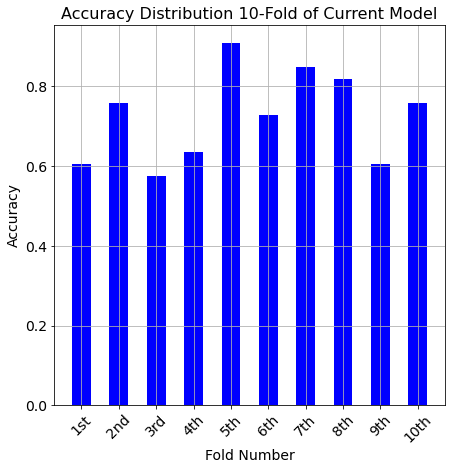

<Figure size 504x504 with 0 Axes>

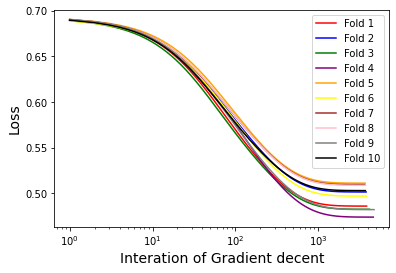

<Figure size 504x504 with 0 Axes>

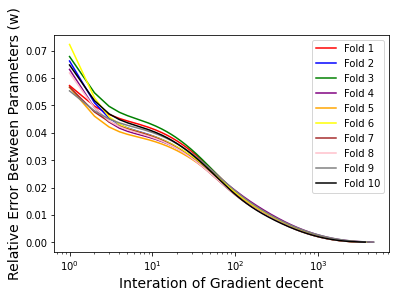

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  6583
0.6060606060606061
No.2 fold start
interations  6504
0.7575757575757576
No.3 fold start
interations  7117
0.5757575757575758
No.4 fold start
interations  7889
0.6363636363636364
No.5 fold start
interations  6331
0.8787878787878788
No.6 fold start
interations  6558
0.7272727272727273
No.7 fold start
interations  6243
0.8484848484848485
No.8 fold start
interations  6388
0.8181818181818182
No.9 fold start
interations  8072
0.6060606060606061
No.10 fold start
interations  6350
0.7575757575757576
Average Accuracy --> 0.7212121212121213


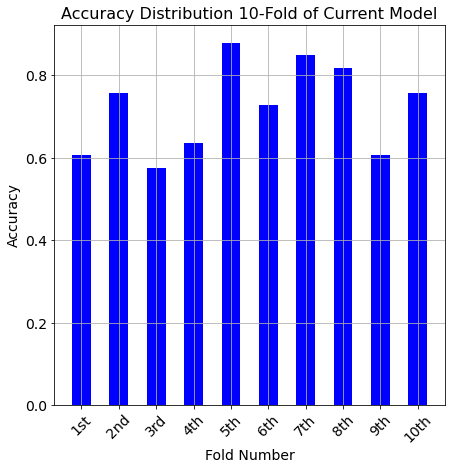

<Figure size 504x504 with 0 Axes>

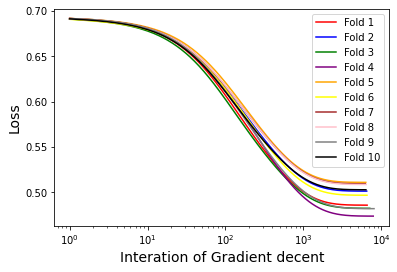

<Figure size 504x504 with 0 Axes>

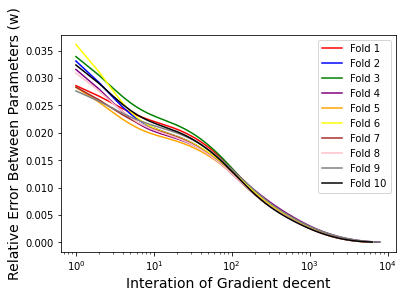

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  10990
0.6060606060606061
No.2 fold start
interations  10869
0.7575757575757576
No.3 fold start
interations  11849
0.5454545454545454
No.4 fold start
interations  13106
0.6363636363636364
No.5 fold start
interations  10597
0.8787878787878788
No.6 fold start
interations  10959
0.7272727272727273
No.7 fold start
interations  10444
0.8484848484848485
No.8 fold start
interations  10674
0.8181818181818182
No.9 fold start
interations  13433
0.6060606060606061
No.10 fold start
interations  10605
0.7575757575757576
Average Accuracy --> 0.7181818181818183


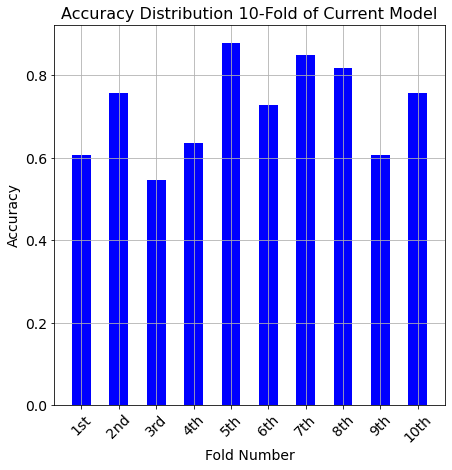

<Figure size 504x504 with 0 Axes>

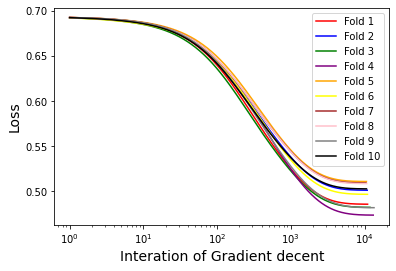

<Figure size 504x504 with 0 Axes>

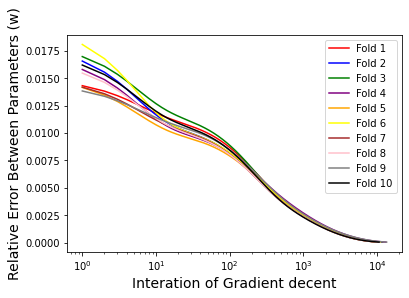

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  20410
0.6060606060606061
No.2 fold start
interations  20213
0.7575757575757576
No.3 fold start
interations  21878
0.5757575757575758
No.4 fold start
interations  24107
0.6363636363636364
No.5 fold start
interations  19755
0.8787878787878788
No.6 fold start
interations  20383
0.696969696969697
No.7 fold start
interations  19466
0.8484848484848485
No.8 fold start
interations  19837
0.8181818181818182
No.9 fold start
interations  24740
0.6060606060606061
No.10 fold start
interations  19700
0.7575757575757576
Average Accuracy --> 0.7181818181818183


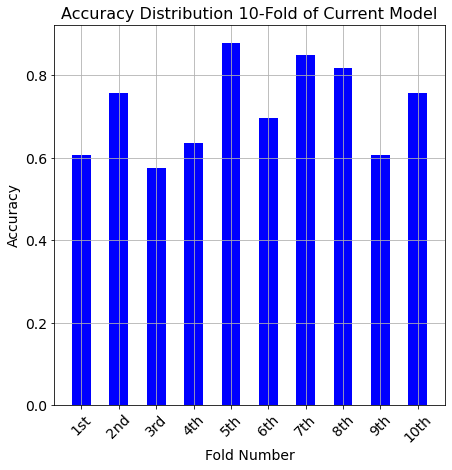

<Figure size 504x504 with 0 Axes>

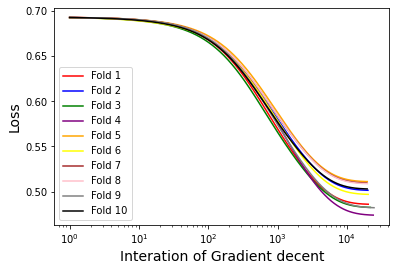

<Figure size 504x504 with 0 Axes>

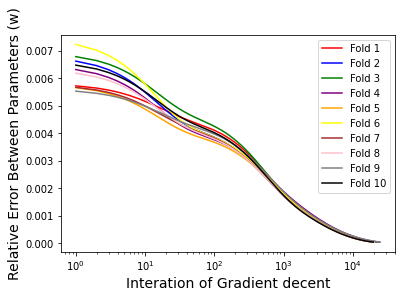

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  30527
0.6060606060606061
No.2 fold start
interations  30260
0.7575757575757576
No.3 fold start
interations  32494
0.5757575757575758
No.4 fold start
interations  35692
0.6363636363636364
No.5 fold start
interations  29630
0.8484848484848485
No.6 fold start
interations  30543
0.696969696969697
No.7 fold start
interations  29223
0.8484848484848485
No.8 fold start
interations  29650
0.8181818181818182
No.9 fold start
interations  36541
0.6060606060606061
No.10 fold start
interations  29453
0.7575757575757576
Average Accuracy --> 0.7151515151515152


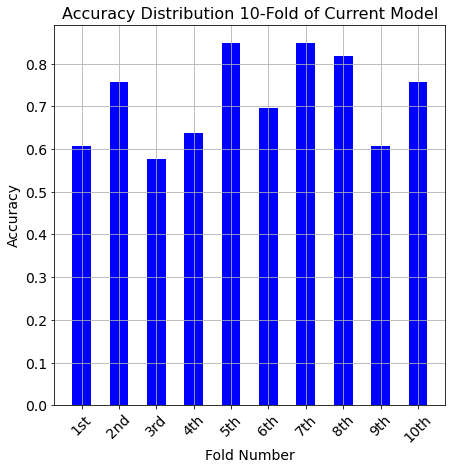

<Figure size 504x504 with 0 Axes>

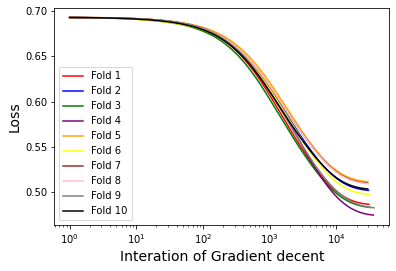

<Figure size 504x504 with 0 Axes>

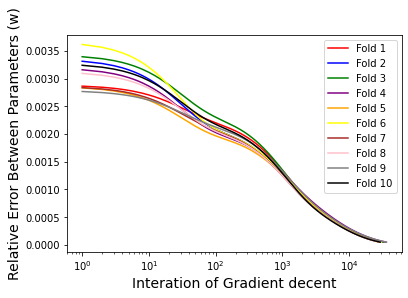

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  41841
0.6060606060606061
No.2 fold start
interations  41505
0.7575757575757576
No.3 fold start
interations  44100
0.5757575757575758
No.4 fold start
interations  48370
0.6363636363636364
No.5 fold start
interations  40667
0.8484848484848485
No.6 fold start
interations  42027
0.696969696969697
No.7 fold start
interations  40259
0.8484848484848485
No.8 fold start
interations  40520
0.8181818181818182
No.9 fold start
interations  48984
0.6060606060606061
No.10 fold start
interations  40296
0.7575757575757576
Average Accuracy --> 0.7151515151515152


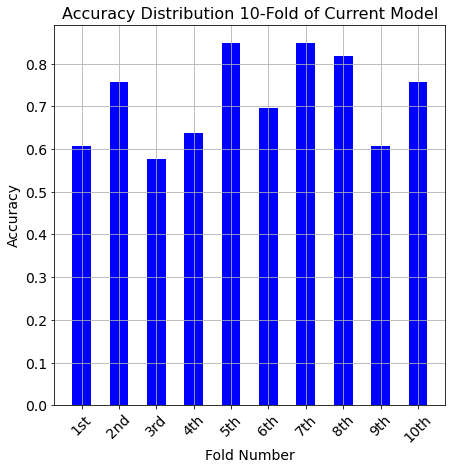

<Figure size 504x504 with 0 Axes>

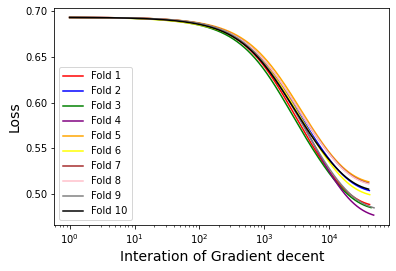

<Figure size 504x504 with 0 Axes>

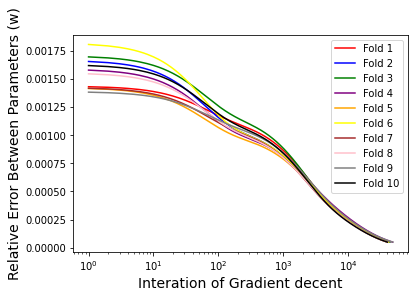

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  51326
0.6060606060606061
No.2 fold start
interations  50868
0.7878787878787878
No.3 fold start
interations  52994
0.6060606060606061
No.4 fold start
interations  58673
0.6363636363636364
No.5 fold start
interations  50055
0.8787878787878788
No.6 fold start
interations  52434
0.696969696969697
No.7 fold start
interations  49837
0.8181818181818182
No.8 fold start
interations  49468
0.8484848484848485
No.9 fold start
interations  57324
0.6060606060606061
No.10 fold start
interations  48970
0.7575757575757576
Average Accuracy --> 0.7242424242424244


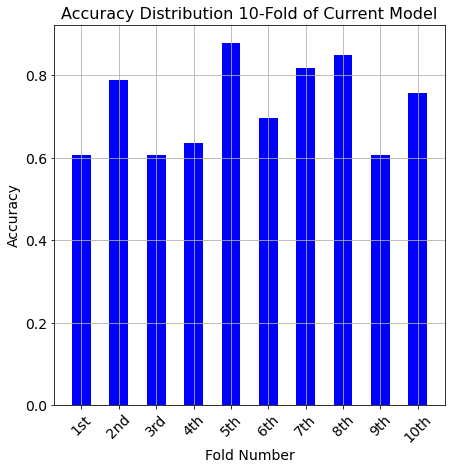

<Figure size 504x504 with 0 Axes>

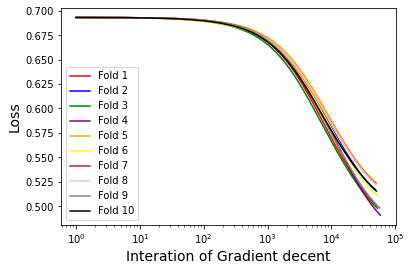

<Figure size 504x504 with 0 Axes>

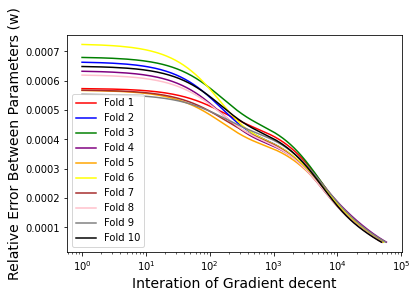

In [ ]:
## Running 
print('-------- Remove Data Test3 Start --------')
# create list to save data
remove3_order1_accur=[]
remove3_order1_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 1
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(1, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate ---  
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove3_order1_accur.append(sum(all_acu)/10)
  remove3_order1_iteration.append(sum(all_interation)/10)

Test 6. Use log transform to make the distribution has less skewness for some features

-------- log transform Data Test Start --------


<ipython-input-49-4e36d908fe2f>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  temp.hist(bins=100, ax=ax)


The order of the linear model didn't change: 1
The shape of X ---> 330x9
-------- Now testing learing rate is 1--------
No.1 fold start
interations  1267
0.6363636363636364
No.2 fold start
interations  1233
0.7575757575757576
No.3 fold start
interations  1254
0.6060606060606061
No.4 fold start
interations  1279
0.696969696969697
No.5 fold start
interations  1275
0.6666666666666666
No.6 fold start
interations  1247
0.7878787878787878
No.7 fold start
interations  1263
0.6363636363636364
No.8 fold start
interations  1191
0.7272727272727273
No.9 fold start
interations  1298
0.7878787878787878
No.10 fold start
interations  1184
0.9090909090909091
Average Accuracy --> 0.7212121212121213


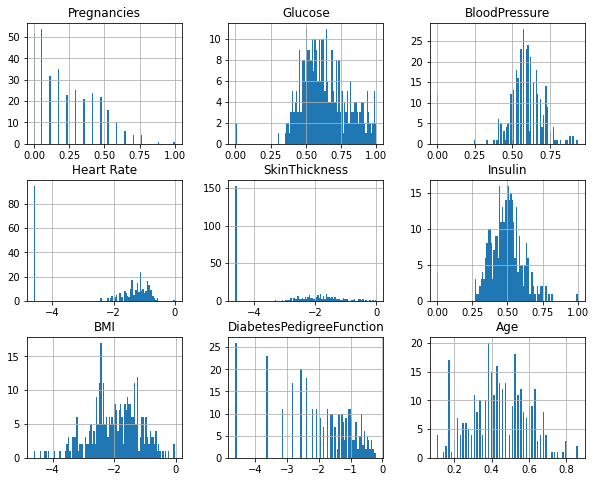

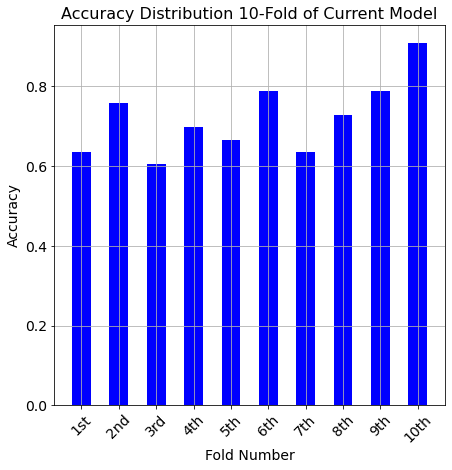

<Figure size 504x504 with 0 Axes>

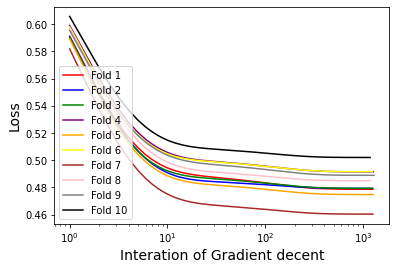

<Figure size 504x504 with 0 Axes>

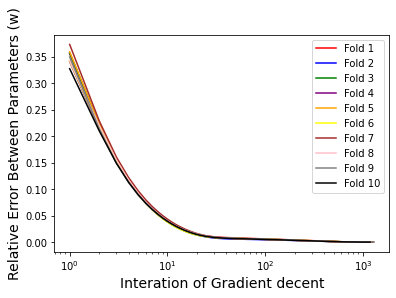

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  2193
0.6363636363636364
No.2 fold start
interations  2115
0.7575757575757576
No.3 fold start
interations  2165
0.6060606060606061
No.4 fold start
interations  2210
0.696969696969697
No.5 fold start
interations  2199
0.6666666666666666
No.6 fold start
interations  2154
0.7878787878787878
No.7 fold start
interations  2176
0.6363636363636364
No.8 fold start
interations  2054
0.7272727272727273
No.9 fold start
interations  2242
0.7878787878787878
No.10 fold start
interations  2041
0.9090909090909091
Average Accuracy --> 0.7212121212121213


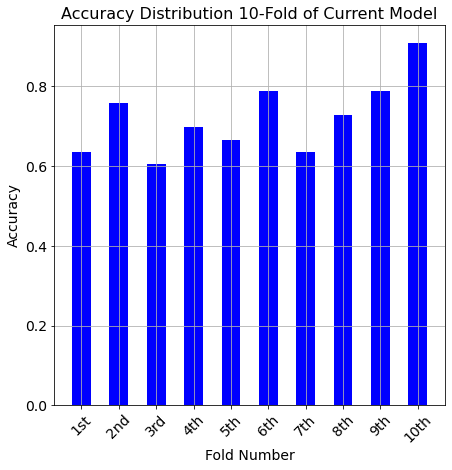

<Figure size 504x504 with 0 Axes>

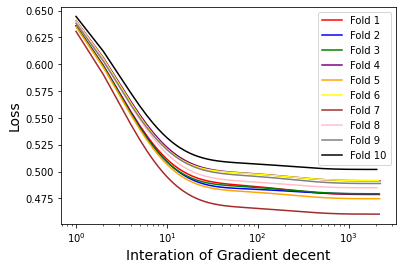

<Figure size 504x504 with 0 Axes>

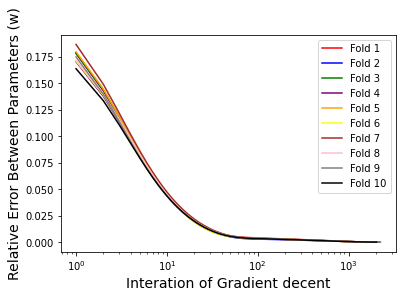

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  3705
0.6363636363636364
No.2 fold start
interations  3530
0.7575757575757576
No.3 fold start
interations  3641
0.6060606060606061
No.4 fold start
interations  3720
0.696969696969697
No.5 fold start
interations  3696
0.6666666666666666
No.6 fold start
interations  3624
0.7878787878787878
No.7 fold start
interations  3651
0.6363636363636364
No.8 fold start
interations  3450
0.7272727272727273
No.9 fold start
interations  3776
0.7878787878787878
No.10 fold start
interations  3427
0.9090909090909091
Average Accuracy --> 0.7212121212121213


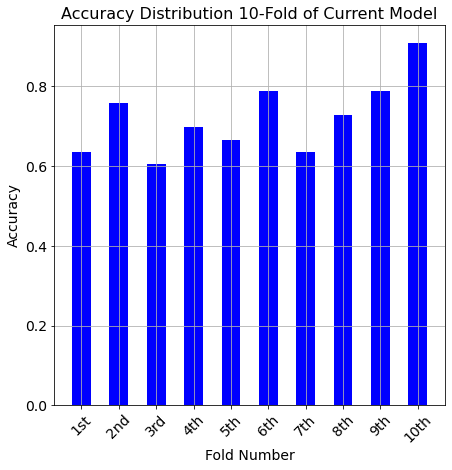

<Figure size 504x504 with 0 Axes>

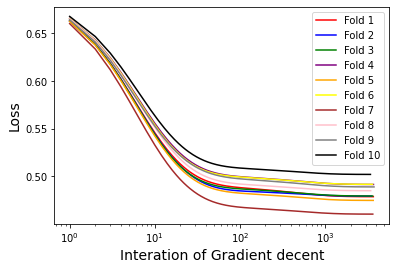

<Figure size 504x504 with 0 Axes>

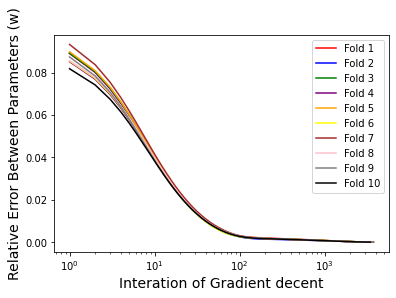

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  7011
0.6666666666666666
No.2 fold start
interations  6509
0.7575757575757576
No.3 fold start
interations  6829
0.6060606060606061
No.4 fold start
interations  6988
0.696969696969697
No.5 fold start
interations  6924
0.696969696969697
No.6 fold start
interations  6804
0.7878787878787878
No.7 fold start
interations  6814
0.6363636363636364
No.8 fold start
interations  6451
0.7272727272727273
No.9 fold start
interations  7102
0.7878787878787878
No.10 fold start
interations  6405
0.9090909090909091
Average Accuracy --> 0.7272727272727274


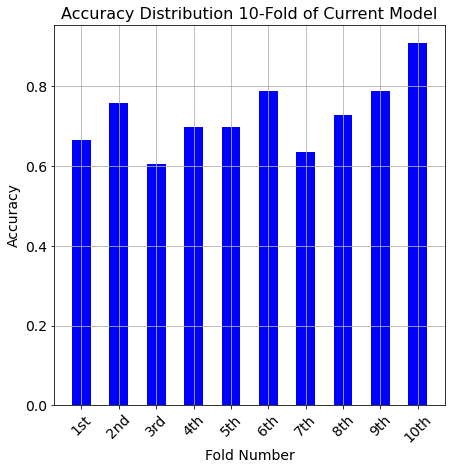

<Figure size 504x504 with 0 Axes>

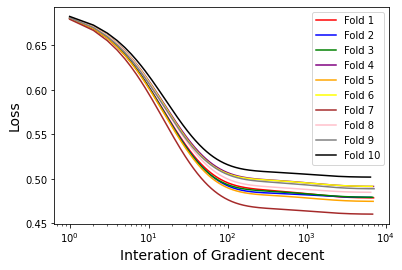

<Figure size 504x504 with 0 Axes>

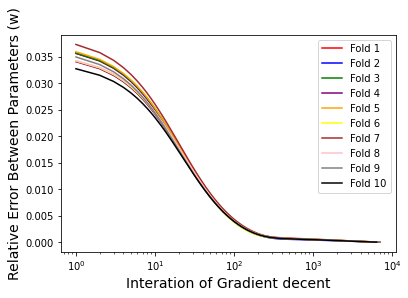

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  10628
0.6666666666666666
No.2 fold start
interations  9524
0.7575757575757576
No.3 fold start
interations  10226
0.6060606060606061
No.4 fold start
interations  10493
0.696969696969697
No.5 fold start
interations  10354
0.696969696969697
No.6 fold start
interations  10204
0.7878787878787878
No.7 fold start
interations  10136
0.6363636363636364
No.8 fold start
interations  9622
0.7272727272727273
No.9 fold start
interations  10676
0.7878787878787878
No.10 fold start
interations  9545
0.9090909090909091
Average Accuracy --> 0.7272727272727274


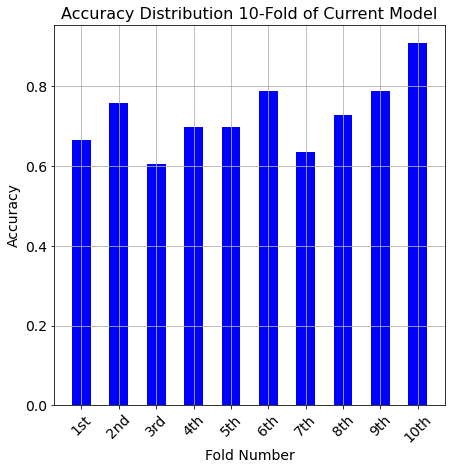

<Figure size 504x504 with 0 Axes>

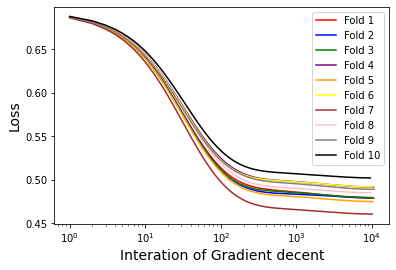

<Figure size 504x504 with 0 Axes>

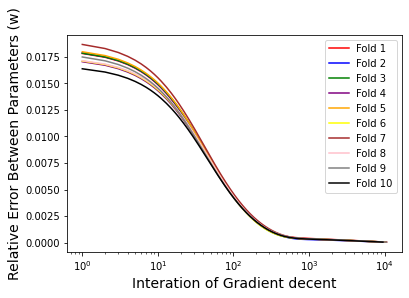

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  14522
0.6666666666666666
No.2 fold start
interations  12110
0.7272727272727273
No.3 fold start
interations  13631
0.6060606060606061
No.4 fold start
interations  14070
0.7272727272727273
No.5 fold start
interations  13775
0.6666666666666666
No.6 fold start
interations  13651
0.7878787878787878
No.7 fold start
interations  13335
0.6363636363636364
No.8 fold start
interations  12730
0.7272727272727273
No.9 fold start
interations  14348
0.8181818181818182
No.10 fold start
interations  12600
0.9090909090909091
Average Accuracy --> 0.7272727272727273


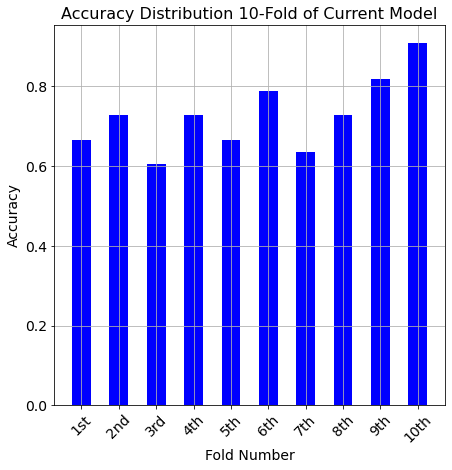

<Figure size 504x504 with 0 Axes>

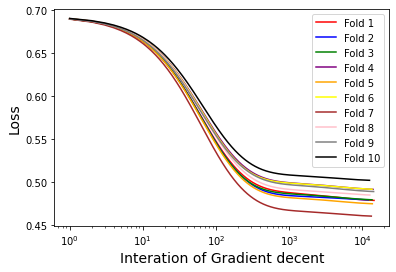

<Figure size 504x504 with 0 Axes>

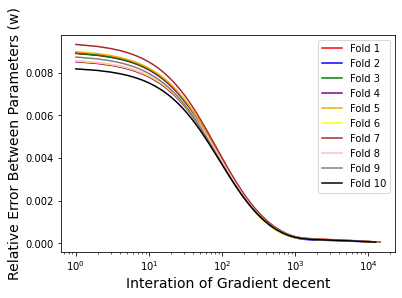

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  14596
0.6666666666666666
No.2 fold start
interations  7921
0.7272727272727273
No.3 fold start
interations  11996
0.6060606060606061
No.4 fold start
interations  12867
0.7272727272727273
No.5 fold start
interations  12076
0.6363636363636364
No.6 fold start
interations  12319
0.7878787878787878
No.7 fold start
interations  10934
0.6363636363636364
No.8 fold start
interations  10803
0.7272727272727273
No.9 fold start
interations  13227
0.8484848484848485
No.10 fold start
interations  10484
0.9090909090909091
Average Accuracy --> 0.7272727272727273


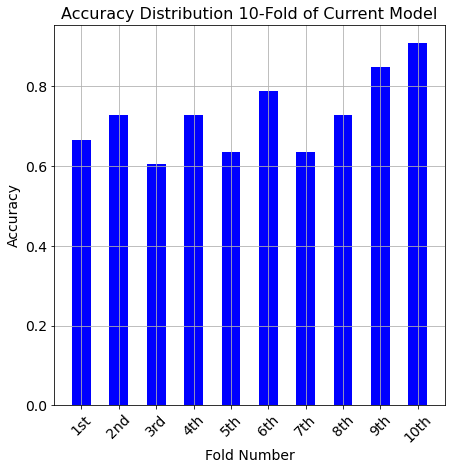

<Figure size 504x504 with 0 Axes>

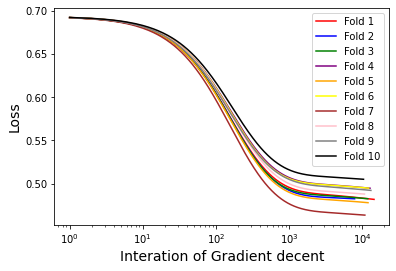

<Figure size 504x504 with 0 Axes>

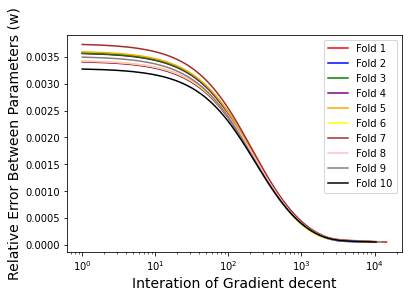

In [ ]:
## Running 
print('-------- log transform Data Test Start --------')
# create list to save data
remove4_order1_accur=[]
remove4_order1_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')

kidney_df[['Heart Rate', 'SkinThickness', 'BMI', 'DiabetesPedigreeFunction']] = kidney_df[['Heart Rate', 'SkinThickness', 'BMI', 'DiabetesPedigreeFunction']] + 0.01
kidney_df[['Heart Rate', 'SkinThickness', 'BMI', 'DiabetesPedigreeFunction']] = kidney_df[['Heart Rate', 'SkinThickness', 'BMI', 'DiabetesPedigreeFunction']].apply(np.log)
# check again hist plot
fig, ax = plt.subplots(figsize=(10, 8))
temp = kidney_df.drop('blood label', axis=1)
temp.hist(bins=100, ax=ax)
fig.show()
#
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 1
X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(1, X_kidney)
## testing 7 different learning rates
learn_test = learn_para 
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove4_order1_accur.append(sum(all_acu)/10)
  remove4_order1_iteration.append(sum(all_interation)/10)

Plot the first model result

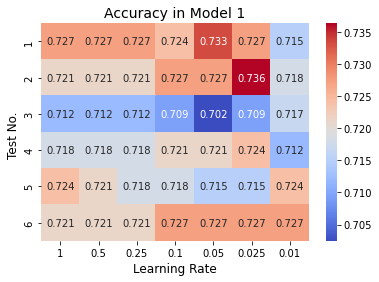

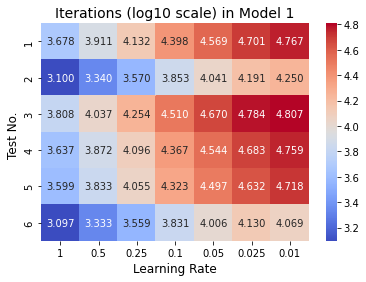

In [ ]:
acc = np.array([raw_order1_accur, std_order1_accur, remove_order1_accur,remove2_order1_accur,remove3_order1_accur,remove4_order1_accur])
[2, 1, 0.5, 0.3, 0.1, 0.08, 0.05]
xticklabels = ['1', '0.5', '0.25', '0.1', '0.05', '0.025', '0.01']
yticklabels = ['1', '2', '3', '4', '5', '6']
ax = sns.heatmap(acc, annot=True, fmt='.3f', xticklabels=xticklabels, yticklabels=yticklabels, cmap='coolwarm')
ax.set_xlabel('Learning Rate', fontsize=12)
ax.set_ylabel('Test No. ', fontsize=12)
ax.set_title("Accuracy in Model 1", fontsize=14)
plt.show()

time = np.log10(np.array([raw_order1_iteration,std_order1_iteration,remove_order1_iteration,remove2_order1_iteration,remove3_order1_iteration,remove4_order1_iteration]))
xticklabels = ['1', '0.5', '0.25', '0.1', '0.05', '0.025', '0.01']
yticklabels = ['1', '2', '3', '4', '5', '6']
ax = sns.heatmap(time, annot=True, fmt='.3f', xticklabels=xticklabels, yticklabels=yticklabels, cmap='coolwarm')
ax.set_xlabel('Learning Rate', fontsize=12)
ax.set_ylabel('Test No. ', fontsize=12)
ax.set_title("Iterations (log10 scale) in Model 1", fontsize=14)
plt.show()

-------- Model 2 (polynomial order 2)-------

Test 1. Raw data

-------- Raw Data Test Start --------
The order of the linear model is now: 2
The shape of X ---> 330x18
-------- Now testing learing rate is 1--------
No.1 fold start
interations  56737
0.6666666666666666
No.2 fold start
interations  60668
0.6666666666666666
No.3 fold start
interations  62655
0.6363636363636364
No.4 fold start
interations  64172
0.5757575757575758
No.5 fold start
interations  56680
0.7575757575757576
No.6 fold start
interations  58558
0.6666666666666666
No.7 fold start
interations  59692
0.7575757575757576
No.8 fold start
interations  63662
0.7575757575757576
No.9 fold start
interations  52049
0.9090909090909091
No.10 fold start
interations  80335
0.7575757575757576
Average Accuracy --> 0.7151515151515151


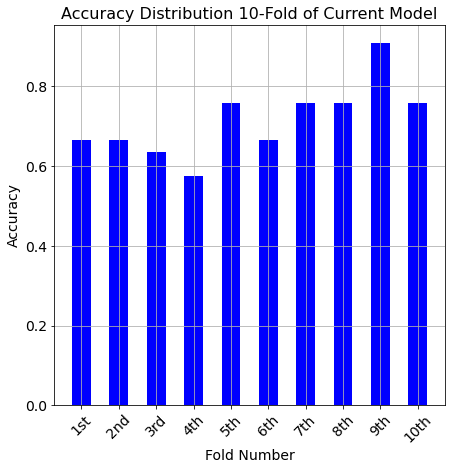

<Figure size 504x504 with 0 Axes>

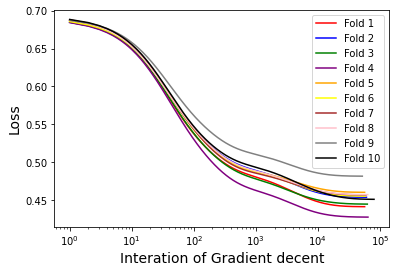

<Figure size 504x504 with 0 Axes>

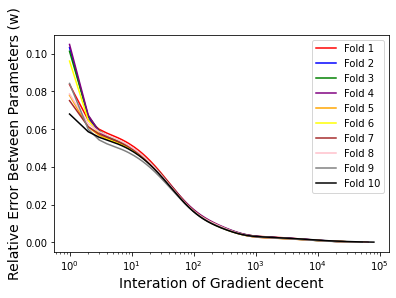

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  87931
0.6666666666666666
No.2 fold start
interations  91769
0.6666666666666666
No.3 fold start
interations  95575
0.6363636363636364
No.4 fold start
interations  92909
0.6060606060606061
No.5 fold start
interations  88015
0.7575757575757576
No.6 fold start
interations  90937
0.6666666666666666
No.7 fold start
interations  90831
0.7575757575757576
No.8 fold start
interations  93978
0.7575757575757576
No.9 fold start
interations  79393
0.9090909090909091
No.10 fold start
interations  123807
0.7575757575757576
Average Accuracy --> 0.7181818181818181


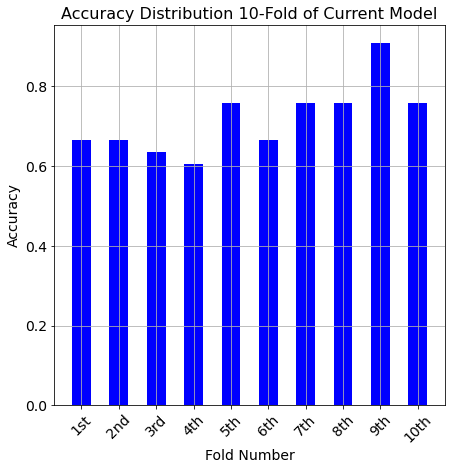

<Figure size 504x504 with 0 Axes>

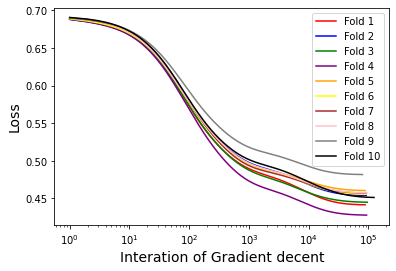

<Figure size 504x504 with 0 Axes>

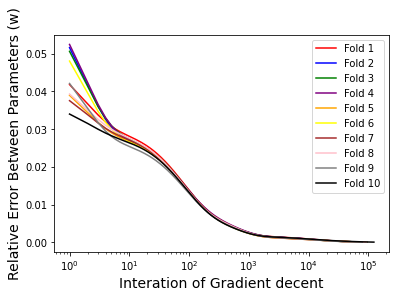

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  127322
0.6666666666666666
No.2 fold start
interations  129434
0.6666666666666666
No.3 fold start
interations  132077
0.6666666666666666
No.4 fold start
interations  126178
0.6060606060606061
No.5 fold start
interations  125761
0.7575757575757576
No.6 fold start
interations  130447
0.6666666666666666
No.7 fold start
interations  127914
0.7575757575757576
No.8 fold start
interations  128725
0.7575757575757576
No.9 fold start
interations  111519
0.9090909090909091
No.10 fold start
interations  174514
0.7575757575757576
Average Accuracy --> 0.7212121212121213


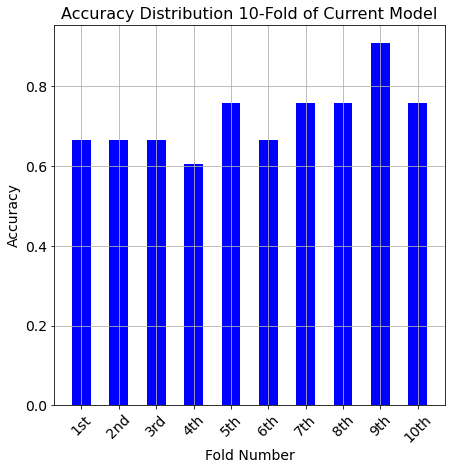

<Figure size 504x504 with 0 Axes>

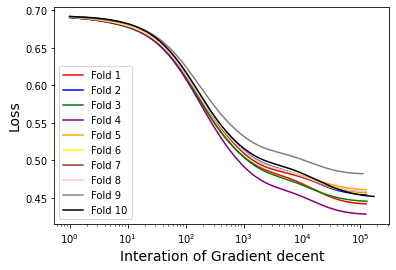

<Figure size 504x504 with 0 Axes>

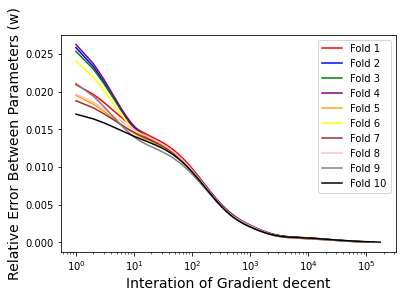

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  177102
0.6666666666666666
No.2 fold start
interations  170183
0.6666666666666666
No.3 fold start
interations  161215
0.696969696969697
No.4 fold start
interations  163829
0.6060606060606061
No.5 fold start
interations  162394
0.7878787878787878
No.6 fold start
interations  170583
0.6666666666666666
No.7 fold start
interations  164043
0.7272727272727273
No.8 fold start
interations  164256
0.7272727272727273
No.9 fold start
interations  148273
0.8484848484848485
No.10 fold start
interations  214990
0.7575757575757576
Average Accuracy --> 0.7151515151515152


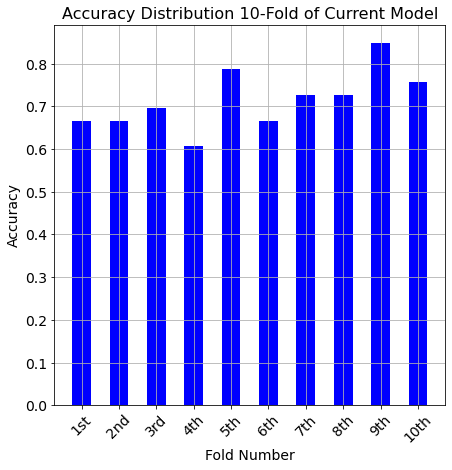

<Figure size 504x504 with 0 Axes>

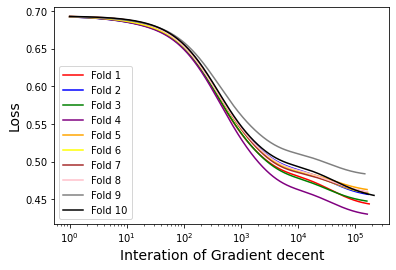

<Figure size 504x504 with 0 Axes>

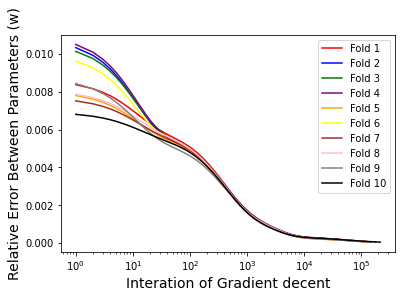

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  187088
0.696969696969697
No.2 fold start
interations  174979
0.696969696969697
No.3 fold start
interations  160954
0.696969696969697
No.4 fold start
interations  172067
0.6060606060606061
No.5 fold start
interations  154497
0.7878787878787878
No.6 fold start
interations  163882
0.6666666666666666
No.7 fold start
interations  157389
0.7272727272727273
No.8 fold start
interations  164214
0.6666666666666666
No.9 fold start
interations  154663
0.8484848484848485
No.10 fold start
interations  198327
0.7878787878787878
Average Accuracy --> 0.7181818181818183


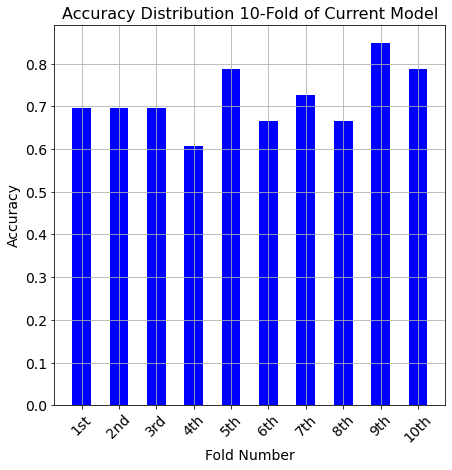

<Figure size 504x504 with 0 Axes>

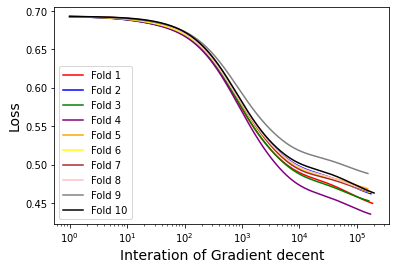

<Figure size 504x504 with 0 Axes>

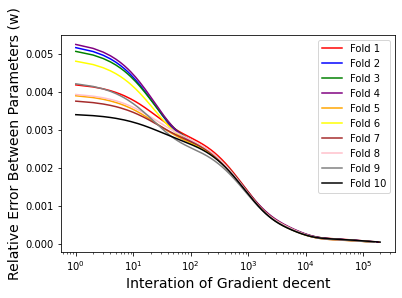

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  134888
0.7272727272727273
No.2 fold start
interations  119293
0.6666666666666666
No.3 fold start
interations  116152
0.6666666666666666
No.4 fold start
interations  120841
0.5757575757575758
No.5 fold start
interations  79837
0.7575757575757576
No.6 fold start
interations  101178
0.696969696969697
No.7 fold start
interations  88425
0.7272727272727273
No.8 fold start
interations  101578
0.6666666666666666
No.9 fold start
interations  102273
0.8787878787878788
No.10 fold start
interations  125727
0.7272727272727273
Average Accuracy --> 0.7090909090909092


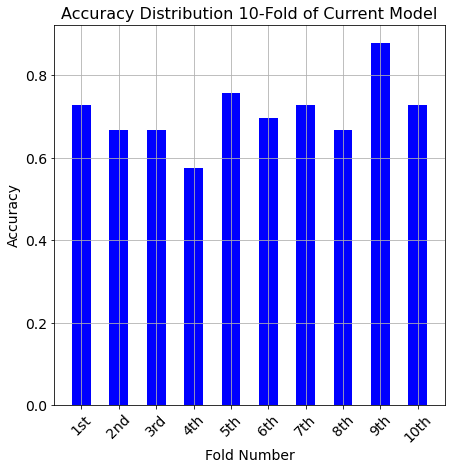

<Figure size 504x504 with 0 Axes>

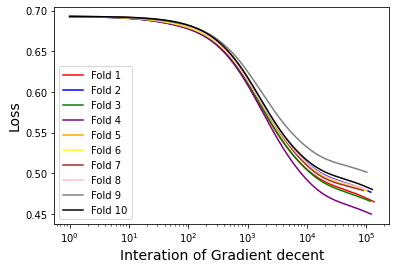

<Figure size 504x504 with 0 Axes>

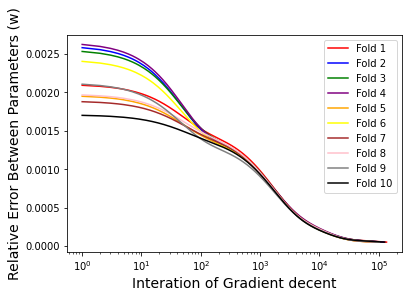

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  48388
0.696969696969697
No.2 fold start
interations  47697
0.7272727272727273
No.3 fold start
interations  50571
0.6363636363636364
No.4 fold start
interations  51960
0.6666666666666666
No.5 fold start
interations  46780
0.7575757575757576
No.6 fold start
interations  45546
0.7272727272727273
No.7 fold start
interations  47746
0.7272727272727273
No.8 fold start
interations  48341
0.6363636363636364
No.9 fold start
interations  45589
0.8484848484848485
No.10 fold start
interations  45416
0.7878787878787878
Average Accuracy --> 0.7212121212121213


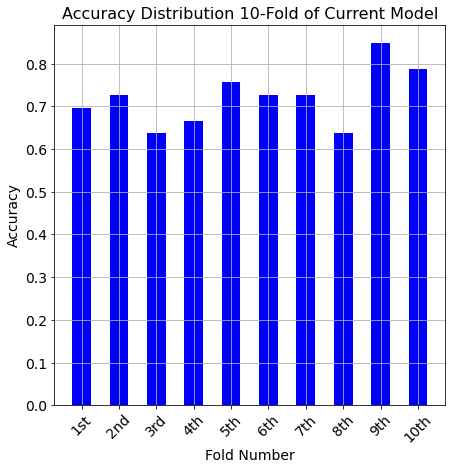

<Figure size 504x504 with 0 Axes>

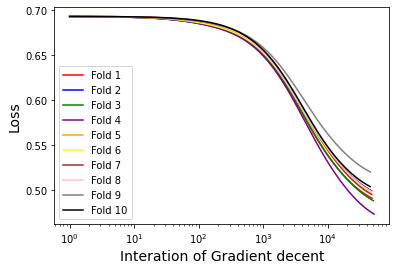

<Figure size 504x504 with 0 Axes>

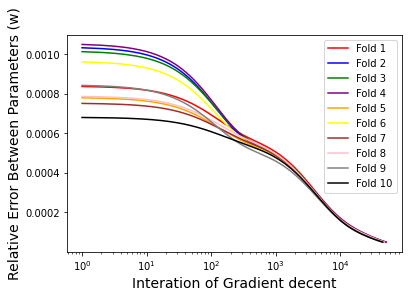

In [ ]:
## Running for the raw data
print('-------- Raw Data Test Start --------')
# create list to save data
raw_order2_accur=[]
raw_order2_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 2
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(2, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  raw_order2_accur.append(sum(all_acu)/10)
  raw_order2_iteration.append(sum(all_interation)/10)

Test 2. Standardization features

-------- Standardization Data Test Start --------
The order of the linear model is now: 2
The shape of X ---> 330x18
-------- Now testing learing rate is 1--------
No.1 fold start
interations  6940
0.7575757575757576
No.2 fold start
interations  7307
0.7878787878787878
No.3 fold start
interations  7389
0.7575757575757576
No.4 fold start
interations  6713
0.8484848484848485
No.5 fold start
interations  8948
0.6060606060606061
No.6 fold start
interations  6343
0.6363636363636364
No.7 fold start
interations  6084
0.8787878787878788
No.8 fold start
interations  7161
0.7575757575757576
No.9 fold start
interations  6510
0.696969696969697
No.10 fold start
interations  7903
0.8181818181818182
Average Accuracy --> 0.7545454545454546


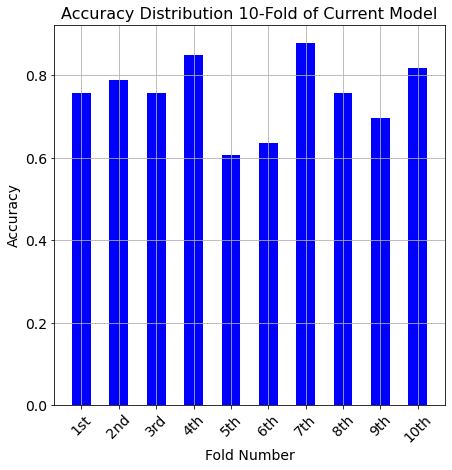

<Figure size 504x504 with 0 Axes>

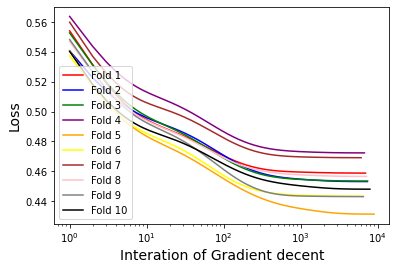

<Figure size 504x504 with 0 Axes>

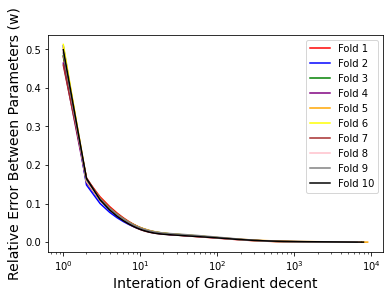

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  10850
0.7272727272727273
No.2 fold start
interations  11887
0.7878787878787878
No.3 fold start
interations  11778
0.7575757575757576
No.4 fold start
interations  10640
0.8484848484848485
No.5 fold start
interations  14798
0.6060606060606061
No.6 fold start
interations  10005
0.6363636363636364
No.7 fold start
interations  9531
0.8787878787878788
No.8 fold start
interations  11377
0.7575757575757576
No.9 fold start
interations  9775
0.696969696969697
No.10 fold start
interations  12962
0.8484848484848485
Average Accuracy --> 0.7545454545454546


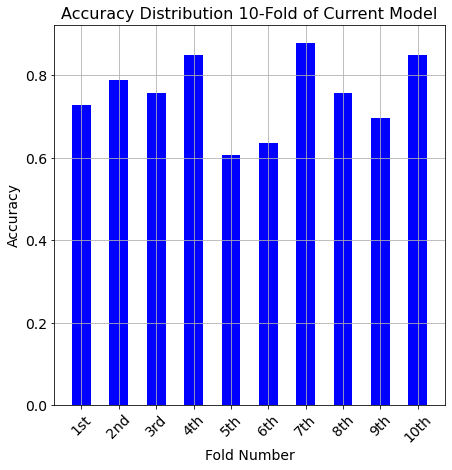

<Figure size 504x504 with 0 Axes>

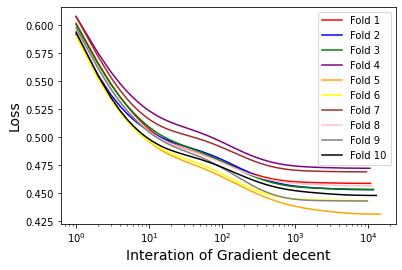

<Figure size 504x504 with 0 Axes>

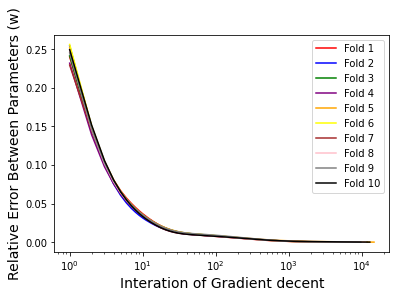

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  15609
0.7272727272727273
No.2 fold start
interations  18286
0.7878787878787878
No.3 fold start
interations  17524
0.7878787878787878
No.4 fold start
interations  15697
0.8484848484848485
No.5 fold start
interations  23372
0.6060606060606061
No.6 fold start
interations  14624
0.6363636363636364
No.7 fold start
interations  13754
0.8787878787878788
No.8 fold start
interations  16872
0.7575757575757576
No.9 fold start
interations  13037
0.696969696969697
No.10 fold start
interations  20205
0.8484848484848485
Average Accuracy --> 0.7575757575757576


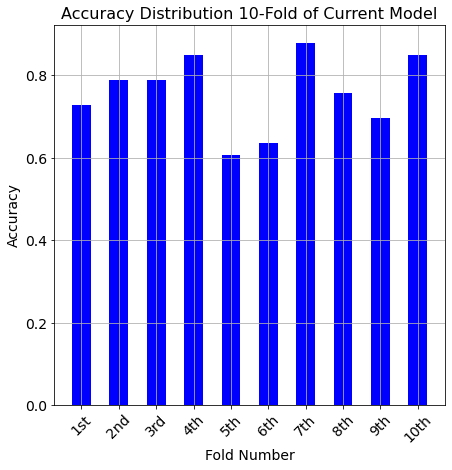

<Figure size 504x504 with 0 Axes>

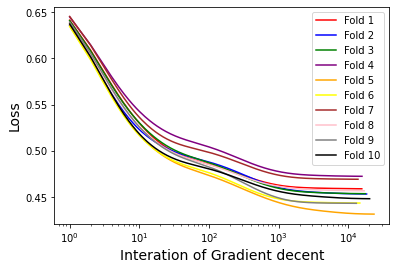

<Figure size 504x504 with 0 Axes>

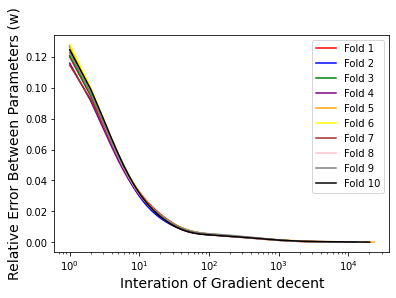

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  18832
0.7272727272727273
No.2 fold start
interations  27362
0.7878787878787878
No.3 fold start
interations  23699
0.7575757575757576
No.4 fold start
interations  20926
0.8484848484848485
No.5 fold start
interations  37671
0.5757575757575758
No.6 fold start
interations  18694
0.6363636363636364
No.7 fold start
interations  16830
0.8787878787878788
No.8 fold start
interations  22915
0.7575757575757576
No.9 fold start
interations  13729
0.696969696969697
No.10 fold start
interations  31403
0.8484848484848485
Average Accuracy --> 0.7515151515151516


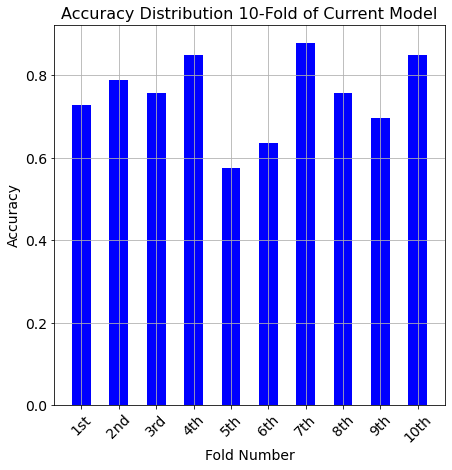

<Figure size 504x504 with 0 Axes>

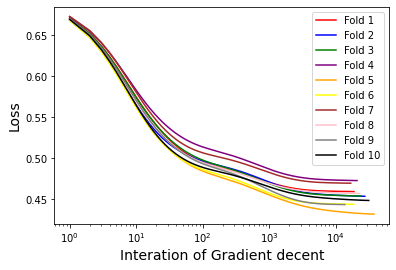

<Figure size 504x504 with 0 Axes>

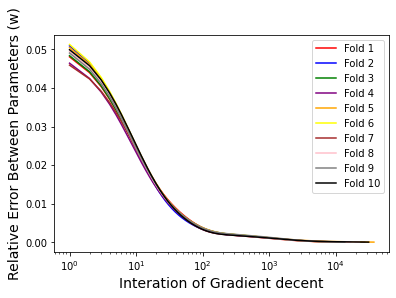

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  16657
0.7272727272727273
No.2 fold start
interations  27317
0.7878787878787878
No.3 fold start
interations  21426
0.7575757575757576
No.4 fold start
interations  20005
0.8484848484848485
No.5 fold start
interations  43716
0.5757575757575758
No.6 fold start
interations  17738
0.6363636363636364
No.7 fold start
interations  17251
0.8787878787878788
No.8 fold start
interations  20909
0.7575757575757576
No.9 fold start
interations  17534
0.696969696969697
No.10 fold start
interations  33783
0.8787878787878788
Average Accuracy --> 0.7545454545454546


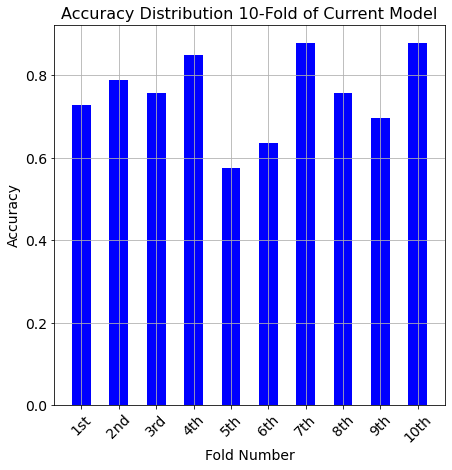

<Figure size 504x504 with 0 Axes>

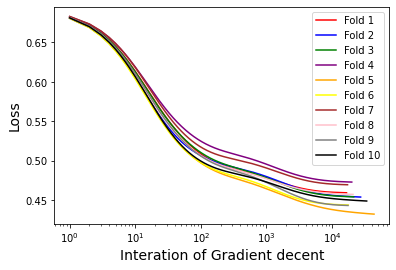

<Figure size 504x504 with 0 Axes>

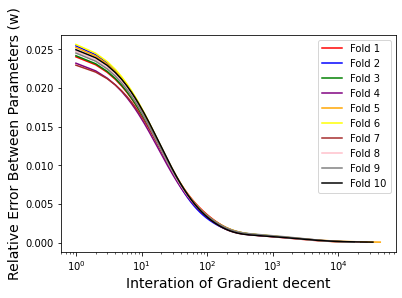

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  19535
0.7272727272727273
No.2 fold start
interations  25170
0.7878787878787878
No.3 fold start
interations  23341
0.7575757575757576
No.4 fold start
interations  22400
0.8484848484848485
No.5 fold start
interations  36577
0.5454545454545454
No.6 fold start
interations  20870
0.6363636363636364
No.7 fold start
interations  21153
0.8787878787878788
No.8 fold start
interations  21562
0.7575757575757576
No.9 fold start
interations  23460
0.696969696969697
No.10 fold start
interations  27537
0.8181818181818182
Average Accuracy --> 0.7454545454545455


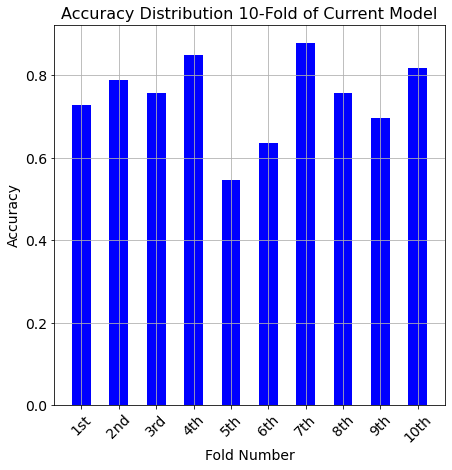

<Figure size 504x504 with 0 Axes>

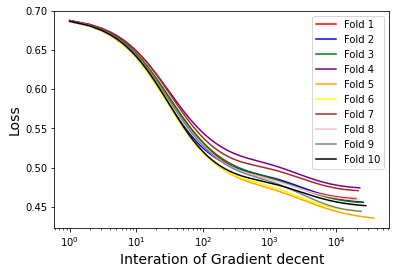

<Figure size 504x504 with 0 Axes>

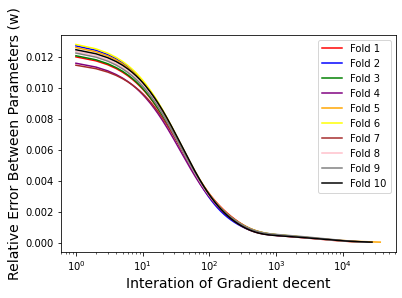

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  23254
0.6666666666666666
No.2 fold start
interations  27862
0.7878787878787878
No.3 fold start
interations  26527
0.7575757575757576
No.4 fold start
interations  25435
0.8787878787878788
No.5 fold start
interations  32401
0.5757575757575758
No.6 fold start
interations  25287
0.6363636363636364
No.7 fold start
interations  25186
0.8484848484848485
No.8 fold start
interations  23231
0.7575757575757576
No.9 fold start
interations  29807
0.696969696969697
No.10 fold start
interations  26482
0.7575757575757576
Average Accuracy --> 0.7363636363636364


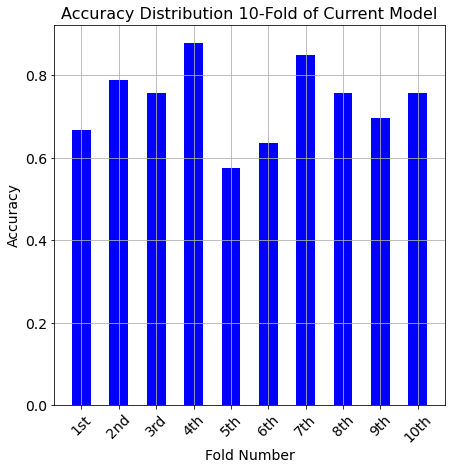

<Figure size 504x504 with 0 Axes>

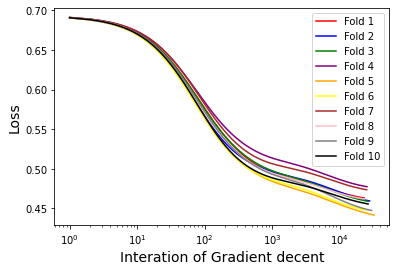

<Figure size 504x504 with 0 Axes>

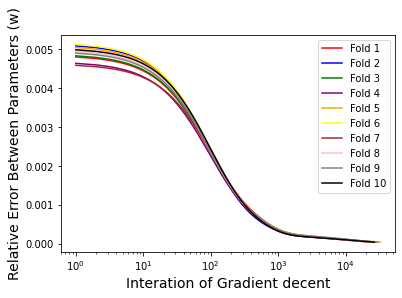

In [ ]:
## Running for the Standardization data
print('-------- Standardization Data Test Start --------')
# create list to save data
std_order2_accur=[]
std_order2_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 2
X_kidney = changeModelOrder(2, X_kidney)
X_kidney = featureStandardization(X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  std_order2_accur.append(sum(all_acu)/10)
  std_order2_iteration.append(sum(all_interation)/10)

Test 3. Removing outlier

-------- Remove Outliers Data Test Start --------
The order of the linear model is now: 2
The shape of X ---> 296x18
-------- Now testing learing rate is 1--------
No.1 fold start
interations  211482
0.7931034482758621
No.2 fold start
interations  236832
0.5517241379310345
No.3 fold start
interations  206250
0.7241379310344828
No.4 fold start
interations  225975
0.7931034482758621
No.5 fold start
interations  181196
0.7586206896551724
No.6 fold start
interations  110536
0.7931034482758621
No.7 fold start
interations  207264
0.8275862068965517
No.8 fold start
interations  256499
0.5517241379310345
No.9 fold start
interations  219045
0.8275862068965517
No.10 fold start
interations  261833
0.6571428571428571
Average Accuracy --> 0.7277832512315271


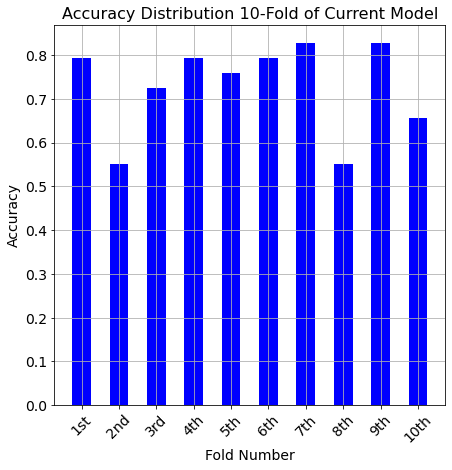

<Figure size 504x504 with 0 Axes>

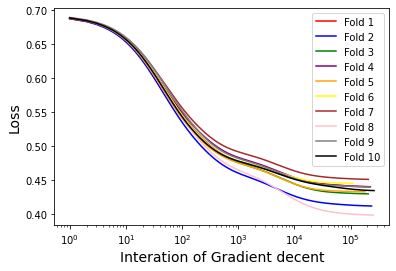

<Figure size 504x504 with 0 Axes>

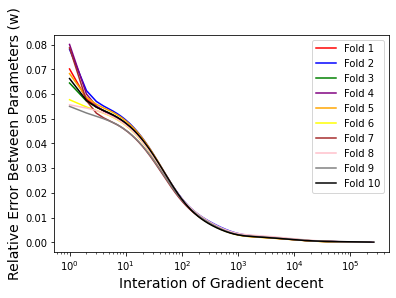

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  243083
0.7931034482758621
No.2 fold start
interations  267430
0.5517241379310345
No.3 fold start
interations  222430
0.7241379310344828
No.4 fold start
interations  250156
0.7931034482758621
No.5 fold start
interations  177473
0.7586206896551724
No.6 fold start
interations  126079
0.7931034482758621
No.7 fold start
interations  233437
0.8275862068965517
No.8 fold start
interations  286892
0.5517241379310345
No.9 fold start
interations  242176
0.8275862068965517
No.10 fold start
interations  332014
0.6571428571428571
Average Accuracy --> 0.7277832512315271


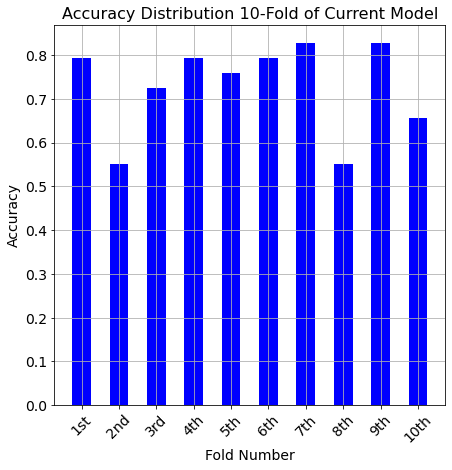

<Figure size 504x504 with 0 Axes>

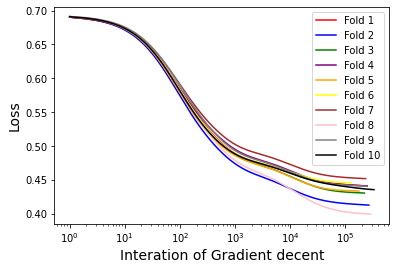

<Figure size 504x504 with 0 Axes>

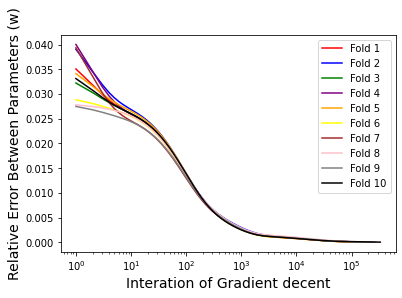

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  211497
0.7931034482758621
No.2 fold start
interations  225592
0.5517241379310345
No.3 fold start
interations  208993
0.7241379310344828
No.4 fold start
interations  211963
0.7931034482758621
No.5 fold start
interations  175154
0.7586206896551724
No.6 fold start
interations  156157
0.7931034482758621
No.7 fold start
interations  204504
0.8275862068965517
No.8 fold start
interations  280062
0.5517241379310345
No.9 fold start
interations  199616
0.8275862068965517
No.10 fold start
interations  304951
0.6857142857142857
Average Accuracy --> 0.73064039408867


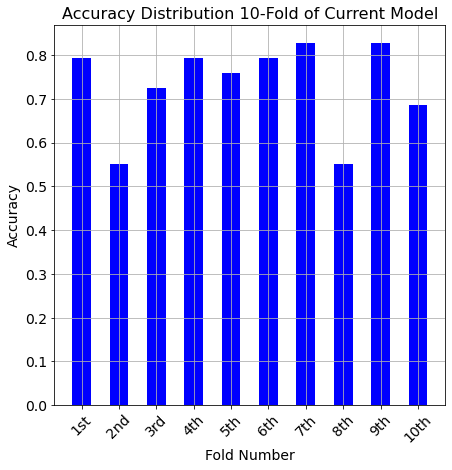

<Figure size 504x504 with 0 Axes>

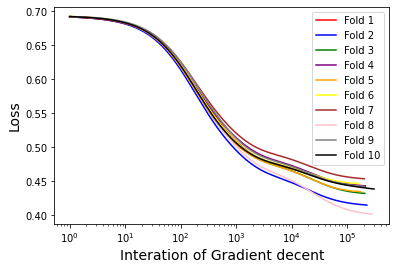

<Figure size 504x504 with 0 Axes>

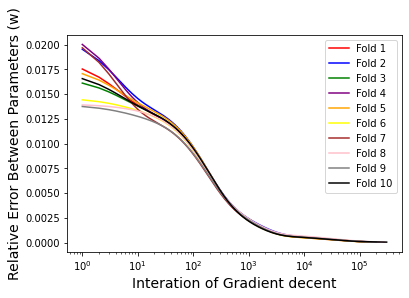

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  197700
0.7931034482758621
No.2 fold start
interations  218952
0.5517241379310345
No.3 fold start
interations  232252
0.7931034482758621
No.4 fold start
interations  211715
0.8275862068965517
No.5 fold start
interations  210036
0.7586206896551724
No.6 fold start
interations  187832
0.7586206896551724
No.7 fold start
interations  206182
0.8275862068965517
No.8 fold start
interations  282692
0.6206896551724138
No.9 fold start
interations  207402
0.8275862068965517
No.10 fold start
interations  211491
0.7142857142857143
Average Accuracy --> 0.7472906403940887


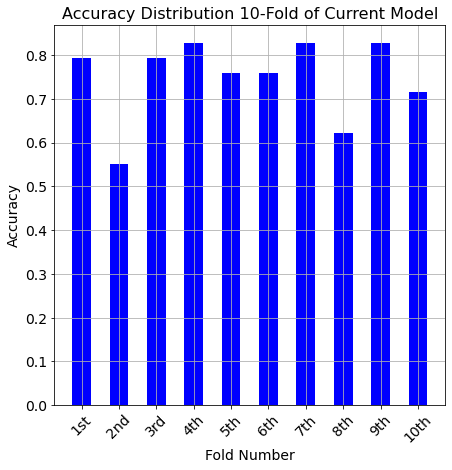

<Figure size 504x504 with 0 Axes>

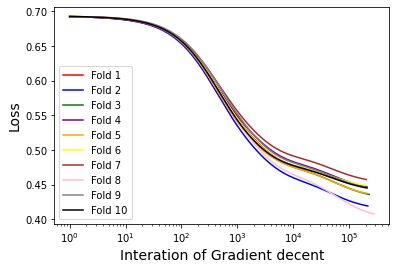

<Figure size 504x504 with 0 Axes>

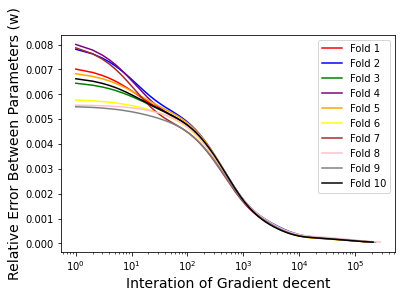

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  175991
0.8275862068965517
No.2 fold start
interations  201197
0.5172413793103449
No.3 fold start
interations  209585
0.7931034482758621
No.4 fold start
interations  194623
0.7931034482758621
No.5 fold start
interations  202307
0.7241379310344828
No.6 fold start
interations  169604
0.7241379310344828
No.7 fold start
interations  186179
0.8275862068965517
No.8 fold start
interations  257620
0.6206896551724138
No.9 fold start
interations  192740
0.8275862068965517
No.10 fold start
interations  178787
0.6571428571428571
Average Accuracy --> 0.7312315270935961


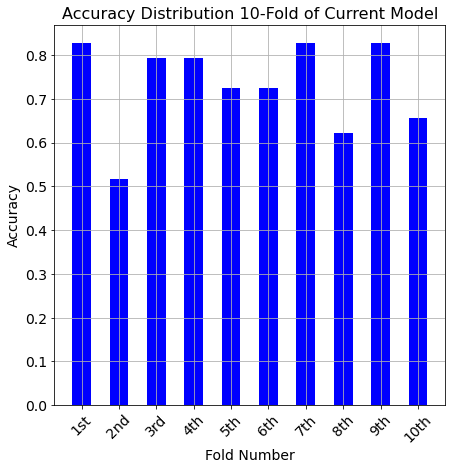

<Figure size 504x504 with 0 Axes>

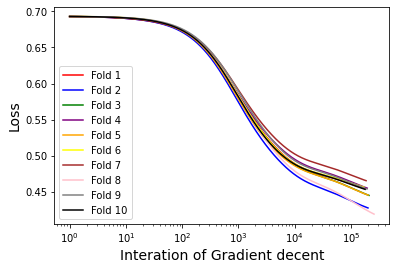

<Figure size 504x504 with 0 Axes>

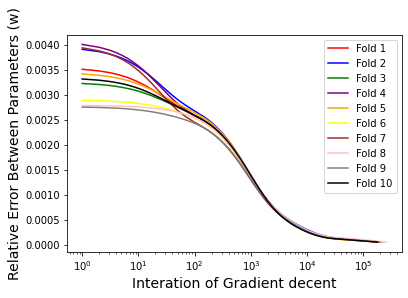

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  83397
0.7931034482758621
No.2 fold start
interations  123627
0.5172413793103449
No.3 fold start
interations  111544
0.6896551724137931
No.4 fold start
interations  101236
0.7931034482758621
No.5 fold start
interations  111465
0.7241379310344828
No.6 fold start
interations  77778
0.6896551724137931
No.7 fold start
interations  98071
0.8275862068965517
No.8 fold start
interations  162053
0.7241379310344828
No.9 fold start
interations  105011
0.7586206896551724
No.10 fold start
interations  91739
0.6571428571428571
Average Accuracy --> 0.7174384236453203


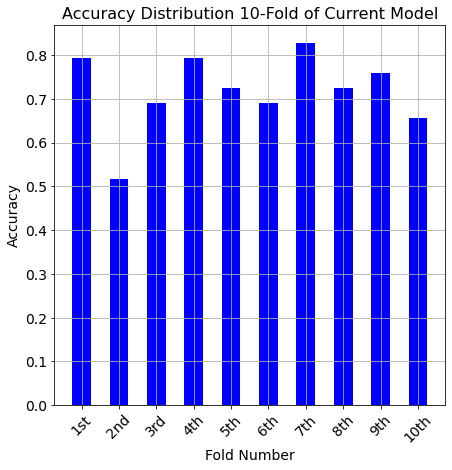

<Figure size 504x504 with 0 Axes>

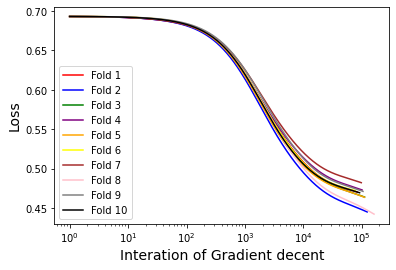

<Figure size 504x504 with 0 Axes>

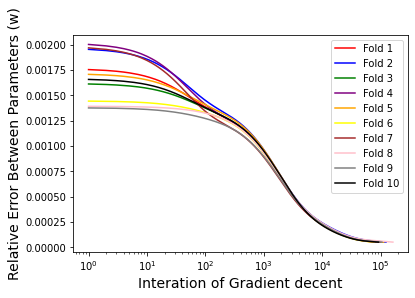

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  55053
0.7586206896551724
No.2 fold start
interations  60360
0.5862068965517241
No.3 fold start
interations  54308
0.6551724137931034
No.4 fold start
interations  54896
0.7931034482758621
No.5 fold start
interations  51422
0.6896551724137931
No.6 fold start
interations  50353
0.6896551724137931
No.7 fold start
interations  52234
0.8620689655172413
No.8 fold start
interations  58332
0.7241379310344828
No.9 fold start
interations  52448
0.7586206896551724
No.10 fold start
interations  48790
0.6857142857142857
Average Accuracy --> 0.7202955665024631


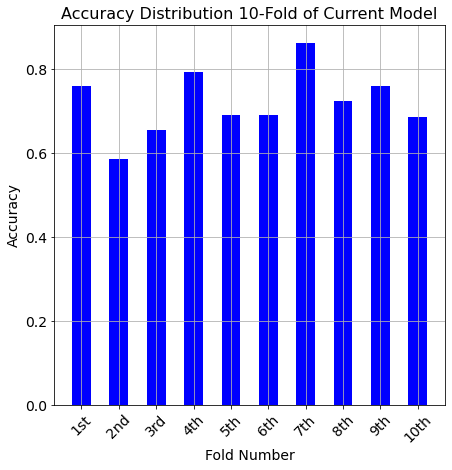

<Figure size 504x504 with 0 Axes>

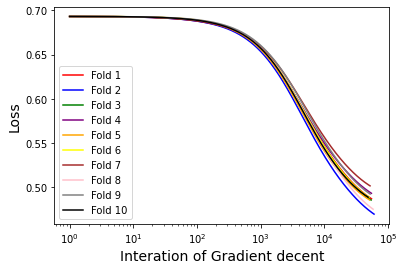

<Figure size 504x504 with 0 Axes>

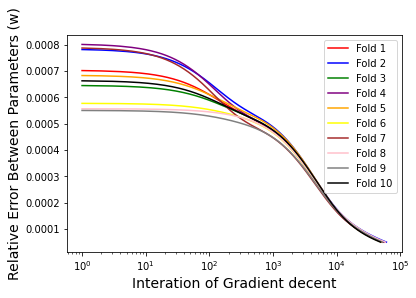

In [ ]:
## Running for the remove outlier data
print('-------- Remove Outliers Data Test Start --------')
# create list to save data
remove_order2_accur=[]
remove_order2_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
columns = ['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
# remove outlier in features
outliers = detect_outliers(kidney_df, columns)
outliers = list(set(outliers))
kidney_df = kidney_df.drop(outliers)
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 2
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(2, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove_order2_accur.append(sum(all_acu)/10)
  remove_order2_iteration.append(sum(all_interation)/10)

Test 4. Removing relatively low correlation value between features and label (Age and heart rate)

-------- Remove Data Test2 Start --------
The order of the linear model is now: 2
The shape of X ---> 330x14
-------- Now testing learing rate is 1--------
No.1 fold start
interations  52576
0.8484848484848485
No.2 fold start
interations  73632
0.6060606060606061
No.3 fold start
interations  47038
0.8181818181818182
No.4 fold start
interations  54585
0.6363636363636364
No.5 fold start
interations  41719
0.7878787878787878
No.6 fold start
interations  54616
0.8181818181818182
No.7 fold start
interations  67168
0.6060606060606061
No.8 fold start
interations  34168
0.696969696969697
No.9 fold start
interations  57717
0.8484848484848485
No.10 fold start
interations  80888
0.696969696969697
Average Accuracy --> 0.7363636363636366


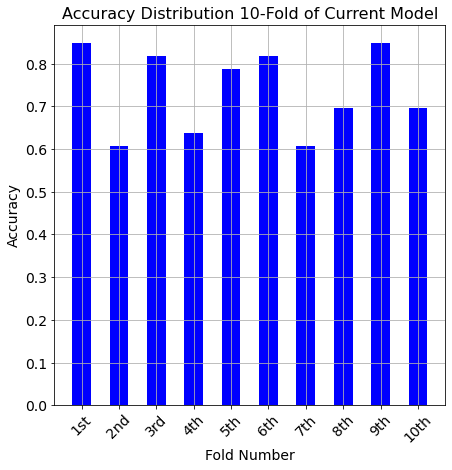

<Figure size 504x504 with 0 Axes>

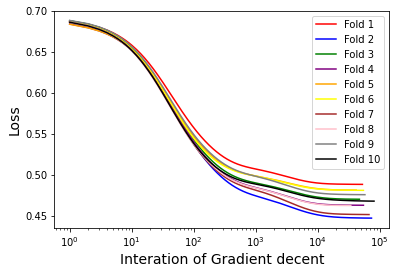

<Figure size 504x504 with 0 Axes>

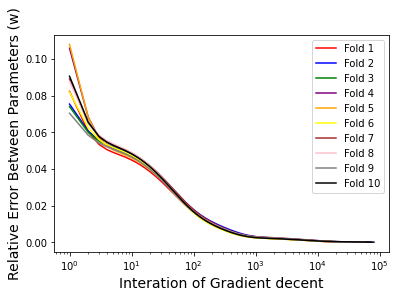

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  62112
0.8484848484848485
No.2 fold start
interations  93873
0.6060606060606061
No.3 fold start
interations  69101
0.8181818181818182
No.4 fold start
interations  61085
0.6363636363636364
No.5 fold start
interations  58964
0.7878787878787878
No.6 fold start
interations  67105
0.8181818181818182
No.7 fold start
interations  78464
0.6363636363636364
No.8 fold start
interations  50318
0.696969696969697
No.9 fold start
interations  70194
0.8484848484848485
No.10 fold start
interations  105643
0.6666666666666666
Average Accuracy --> 0.7363636363636366


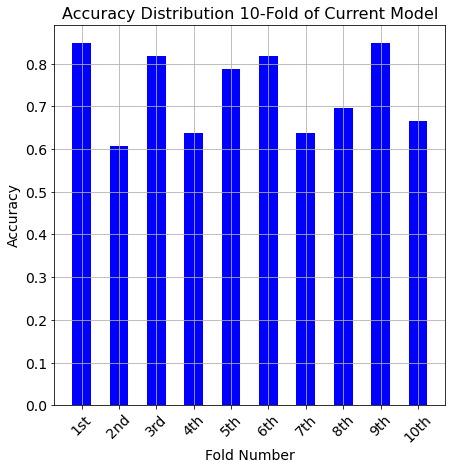

<Figure size 504x504 with 0 Axes>

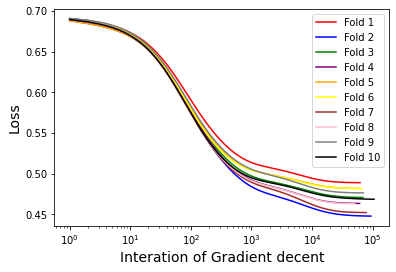

<Figure size 504x504 with 0 Axes>

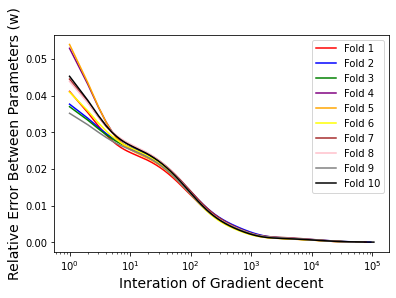

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  77252
0.8484848484848485
No.2 fold start
interations  111604
0.6060606060606061
No.3 fold start
interations  94364
0.8181818181818182
No.4 fold start
interations  78821
0.6363636363636364
No.5 fold start
interations  80831
0.7878787878787878
No.6 fold start
interations  79989
0.8181818181818182
No.7 fold start
interations  96620
0.6363636363636364
No.8 fold start
interations  75571
0.696969696969697
No.9 fold start
interations  85267
0.8181818181818182
No.10 fold start
interations  113493
0.6666666666666666
Average Accuracy --> 0.7333333333333335


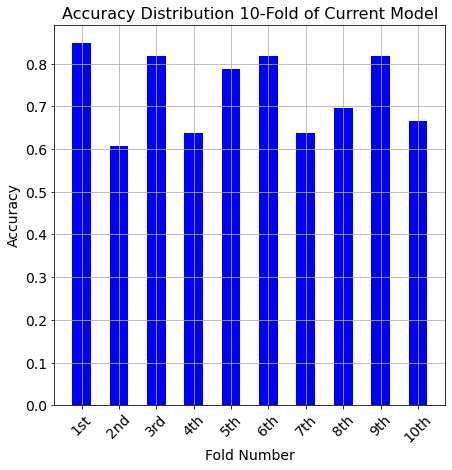

<Figure size 504x504 with 0 Axes>

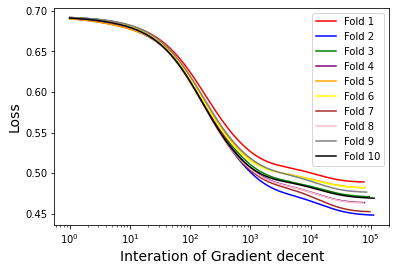

<Figure size 504x504 with 0 Axes>

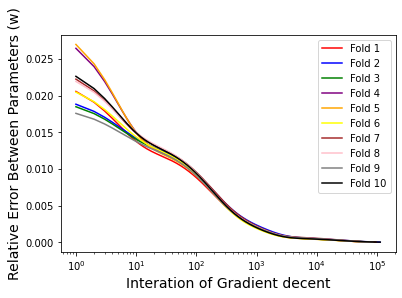

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  109338
0.8484848484848485
No.2 fold start
interations  141380
0.5757575757575758
No.3 fold start
interations  125400
0.8484848484848485
No.4 fold start
interations  114662
0.6363636363636364
No.5 fold start
interations  112585
0.7878787878787878
No.6 fold start
interations  106531
0.8181818181818182
No.7 fold start
interations  138126
0.6363636363636364
No.8 fold start
interations  116203
0.696969696969697
No.9 fold start
interations  117912
0.8181818181818182
No.10 fold start
interations  124328
0.6666666666666666
Average Accuracy --> 0.7333333333333335


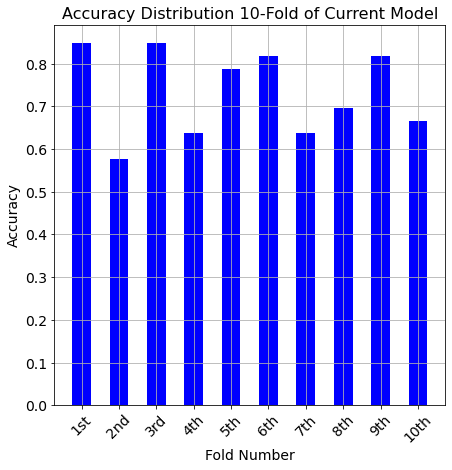

<Figure size 504x504 with 0 Axes>

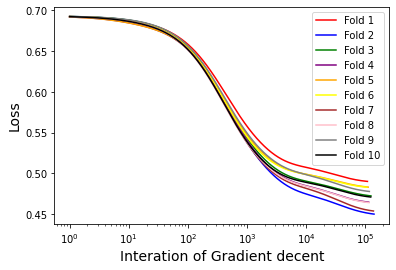

<Figure size 504x504 with 0 Axes>

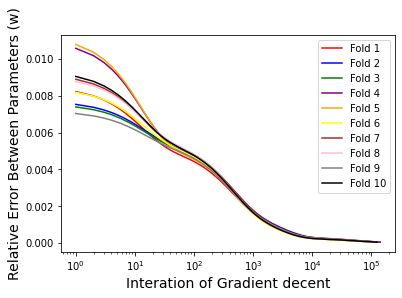

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  120064
0.8484848484848485
No.2 fold start
interations  147447
0.6060606060606061
No.3 fold start
interations  126531
0.7878787878787878
No.4 fold start
interations  128885
0.6363636363636364
No.5 fold start
interations  116327
0.7575757575757576
No.6 fold start
interations  112874
0.8181818181818182
No.7 fold start
interations  155872
0.6060606060606061
No.8 fold start
interations  131386
0.696969696969697
No.9 fold start
interations  130682
0.7575757575757576
No.10 fold start
interations  126401
0.6666666666666666
Average Accuracy --> 0.7181818181818183


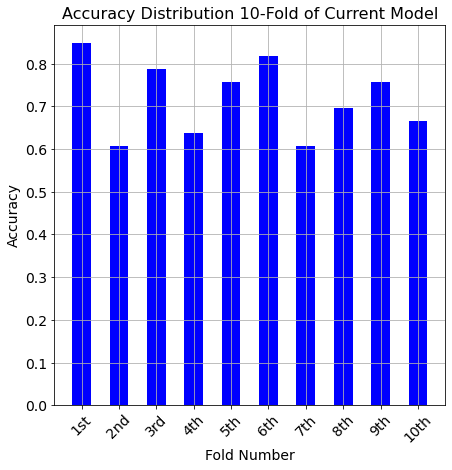

<Figure size 504x504 with 0 Axes>

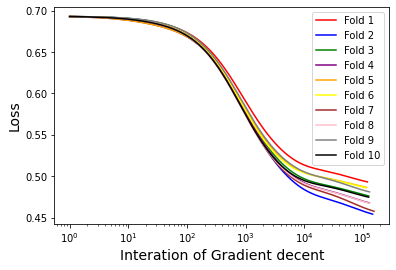

<Figure size 504x504 with 0 Axes>

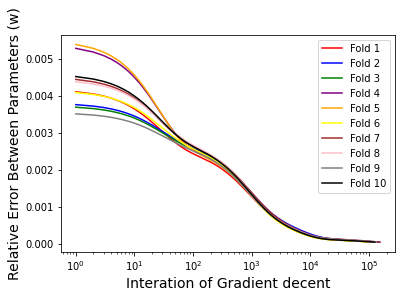

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  71443
0.8787878787878788
No.2 fold start
interations  94742
0.6060606060606061
No.3 fold start
interations  65103
0.7878787878787878
No.4 fold start
interations  84800
0.6363636363636364
No.5 fold start
interations  58989
0.7575757575757576
No.6 fold start
interations  65230
0.7878787878787878
No.7 fold start
interations  114609
0.6060606060606061
No.8 fold start
interations  83775
0.7272727272727273
No.9 fold start
interations  89511
0.7272727272727273
No.10 fold start
interations  64975
0.6060606060606061
Average Accuracy --> 0.7121212121212122


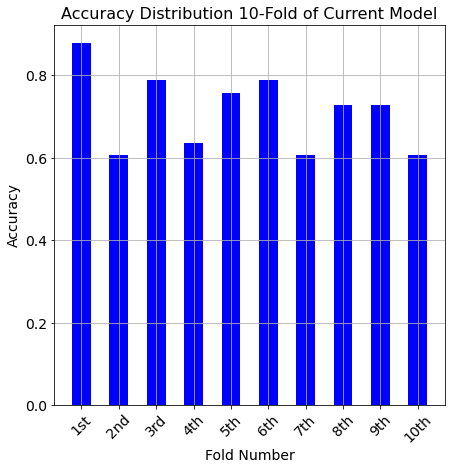

<Figure size 504x504 with 0 Axes>

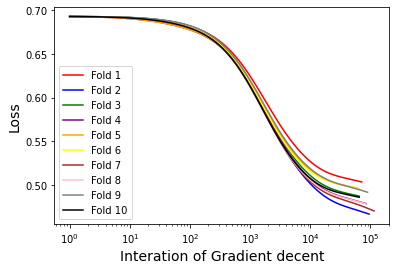

<Figure size 504x504 with 0 Axes>

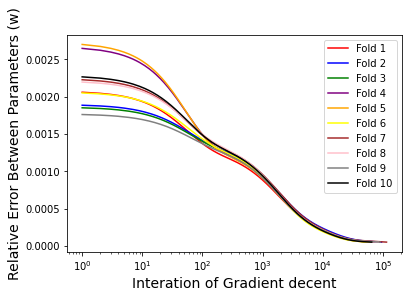

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  43887
0.9090909090909091
No.2 fold start
interations  53101
0.696969696969697
No.3 fold start
interations  45749
0.7878787878787878
No.4 fold start
interations  47350
0.6666666666666666
No.5 fold start
interations  42825
0.7575757575757576
No.6 fold start
interations  39400
0.696969696969697
No.7 fold start
interations  48237
0.6060606060606061
No.8 fold start
interations  45485
0.696969696969697
No.9 fold start
interations  45091
0.696969696969697
No.10 fold start
interations  42003
0.6060606060606061
Average Accuracy --> 0.7121212121212122


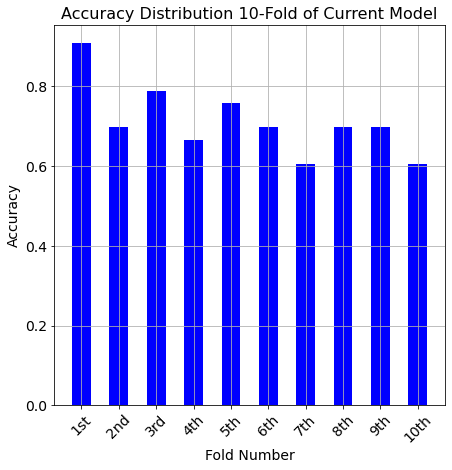

<Figure size 504x504 with 0 Axes>

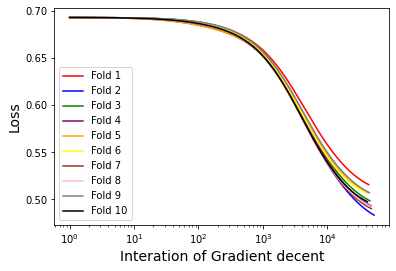

<Figure size 504x504 with 0 Axes>

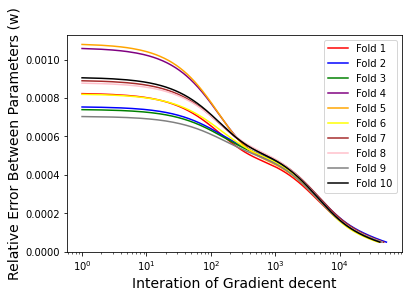

In [ ]:
## Running 
print('-------- Remove Data Test2 Start --------')
# create list to save data
remove2_order2_accur=[]
remove2_order2_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 2
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(2, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove2_order2_accur.append(sum(all_acu)/10)
  remove2_order2_iteration.append(sum(all_interation)/10)

Test 5. Removing features has many 0 values (SkinThickness, Heart rate)

-------- Remove Data Test3 Start --------
The order of the linear model is now: 2
The shape of X ---> 330x14
-------- Now testing learing rate is 1--------
No.1 fold start
interations  64051
0.6060606060606061
No.2 fold start
interations  50689
0.7272727272727273
No.3 fold start
interations  61208
0.7878787878787878
No.4 fold start
interations  52021
0.6363636363636364
No.5 fold start
interations  59139
0.8787878787878788
No.6 fold start
interations  61412
0.8484848484848485
No.7 fold start
interations  59178
0.8787878787878788
No.8 fold start
interations  60204
0.6666666666666666
No.9 fold start
interations  52533
0.696969696969697
No.10 fold start
interations  65292
0.7575757575757576
Average Accuracy --> 0.7484848484848485


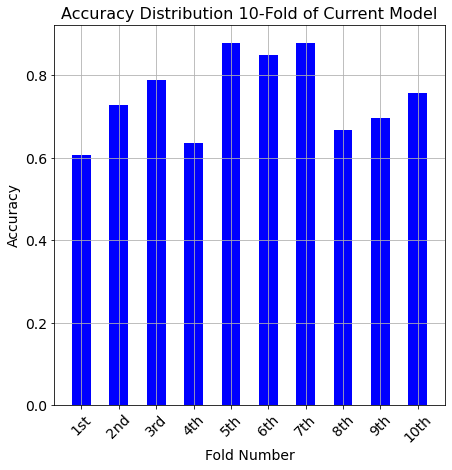

<Figure size 504x504 with 0 Axes>

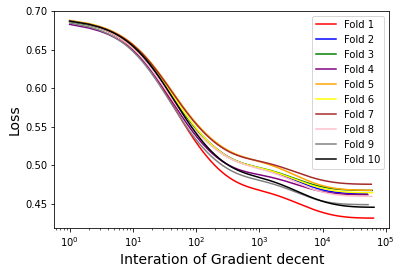

<Figure size 504x504 with 0 Axes>

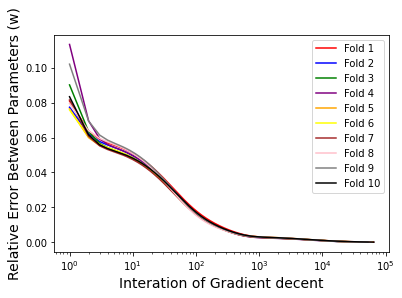

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  98948
0.6060606060606061
No.2 fold start
interations  78920
0.7272727272727273
No.3 fold start
interations  87614
0.7878787878787878
No.4 fold start
interations  78773
0.6363636363636364
No.5 fold start
interations  88827
0.8787878787878788
No.6 fold start
interations  91860
0.8181818181818182
No.7 fold start
interations  88138
0.8484848484848485
No.8 fold start
interations  88317
0.6666666666666666
No.9 fold start
interations  80547
0.696969696969697
No.10 fold start
interations  101146
0.7575757575757576
Average Accuracy --> 0.7424242424242424


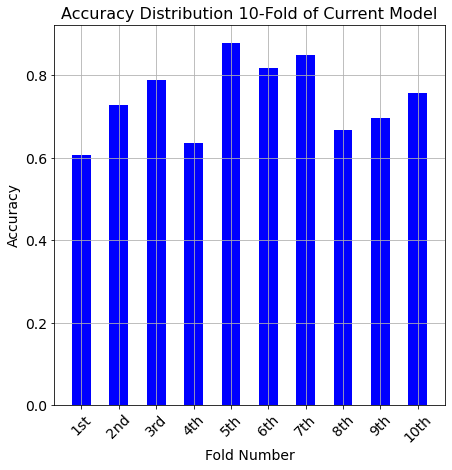

<Figure size 504x504 with 0 Axes>

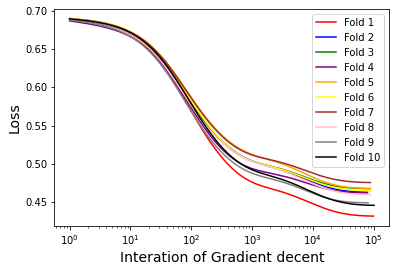

<Figure size 504x504 with 0 Axes>

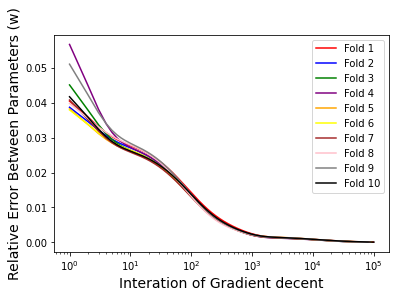

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  140988
0.6060606060606061
No.2 fold start
interations  114297
0.7272727272727273
No.3 fold start
interations  117012
0.7878787878787878
No.4 fold start
interations  110477
0.6363636363636364
No.5 fold start
interations  125506
0.8787878787878788
No.6 fold start
interations  128356
0.7878787878787878
No.7 fold start
interations  122827
0.8484848484848485
No.8 fold start
interations  122385
0.6666666666666666
No.9 fold start
interations  113716
0.696969696969697
No.10 fold start
interations  144499
0.7575757575757576
Average Accuracy --> 0.7393939393939395


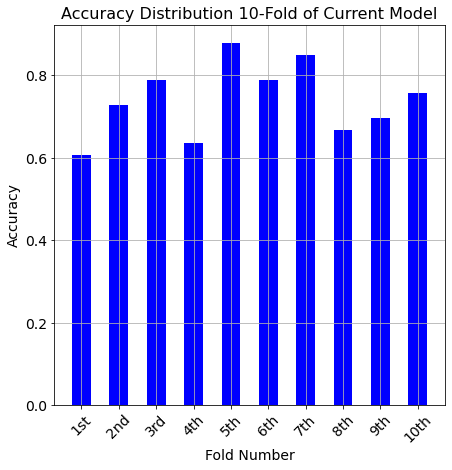

<Figure size 504x504 with 0 Axes>

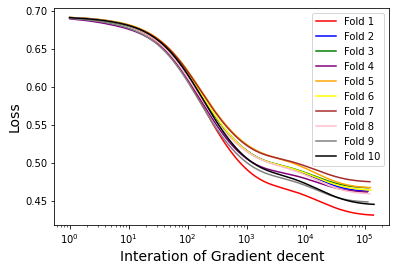

<Figure size 504x504 with 0 Axes>

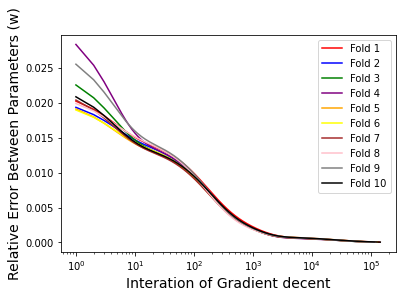

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  184853
0.6060606060606061
No.2 fold start
interations  159579
0.696969696969697
No.3 fold start
interations  150053
0.7878787878787878
No.4 fold start
interations  146033
0.6060606060606061
No.5 fold start
interations  168672
0.8484848484848485
No.6 fold start
interations  164955
0.7575757575757576
No.7 fold start
interations  158268
0.8484848484848485
No.8 fold start
interations  164384
0.6666666666666666
No.9 fold start
interations  154061
0.696969696969697
No.10 fold start
interations  187808
0.7575757575757576
Average Accuracy --> 0.7272727272727273


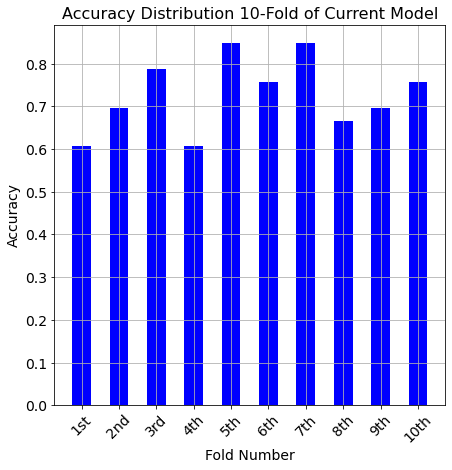

<Figure size 504x504 with 0 Axes>

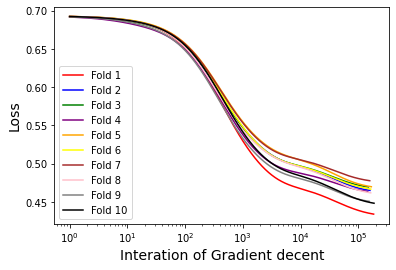

<Figure size 504x504 with 0 Axes>

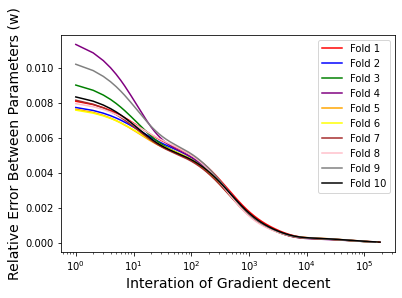

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  182949
0.6060606060606061
No.2 fold start
interations  170998
0.7272727272727273
No.3 fold start
interations  157500
0.7575757575757576
No.4 fold start
interations  150058
0.6363636363636364
No.5 fold start
interations  178393
0.8181818181818182
No.6 fold start
interations  165370
0.7575757575757576
No.7 fold start
interations  159496
0.8787878787878788
No.8 fold start
interations  175237
0.6666666666666666
No.9 fold start
interations  167092
0.6666666666666666
No.10 fold start
interations  187090
0.7878787878787878
Average Accuracy --> 0.7303030303030303


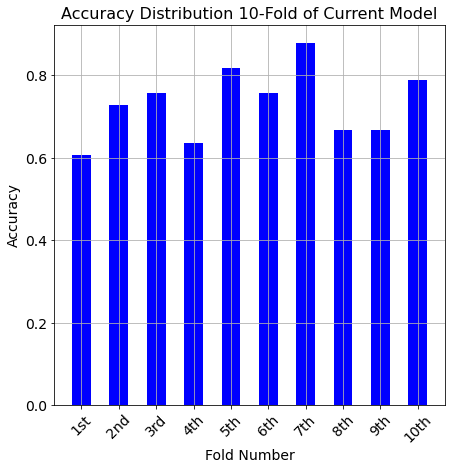

<Figure size 504x504 with 0 Axes>

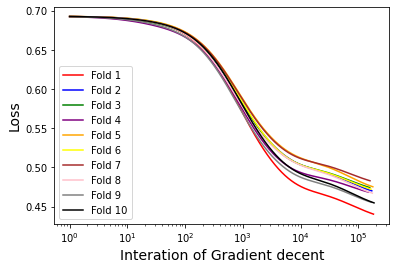

<Figure size 504x504 with 0 Axes>

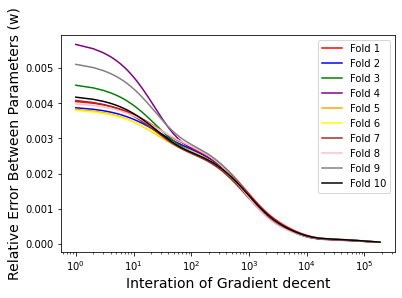

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  115809
0.5454545454545454
No.2 fold start
interations  117306
0.7878787878787878
No.3 fold start
interations  104567
0.7272727272727273
No.4 fold start
interations  84485
0.696969696969697
No.5 fold start
interations  131363
0.8181818181818182
No.6 fold start
interations  110062
0.7575757575757576
No.7 fold start
interations  100874
0.8787878787878788
No.8 fold start
interations  126180
0.696969696969697
No.9 fold start
interations  111878
0.696969696969697
No.10 fold start
interations  126267
0.7878787878787878
Average Accuracy --> 0.7393939393939395


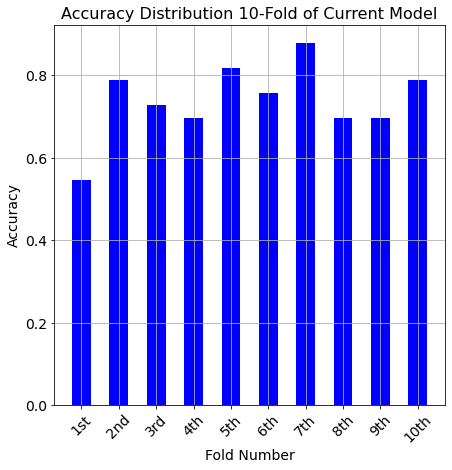

<Figure size 504x504 with 0 Axes>

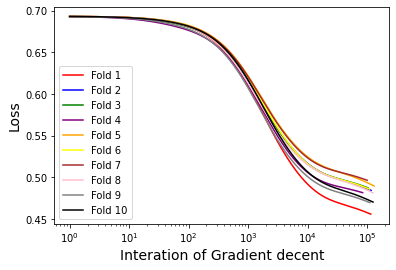

<Figure size 504x504 with 0 Axes>

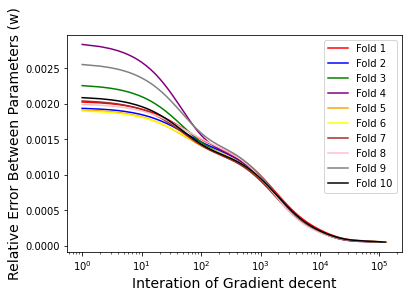

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  47356
0.5757575757575758
No.2 fold start
interations  41839
0.7272727272727273
No.3 fold start
interations  40578
0.7575757575757576
No.4 fold start
interations  39628
0.7272727272727273
No.5 fold start
interations  40868
0.8181818181818182
No.6 fold start
interations  40976
0.696969696969697
No.7 fold start
interations  39258
0.8484848484848485
No.8 fold start
interations  39854
0.6666666666666666
No.9 fold start
interations  42352
0.696969696969697
No.10 fold start
interations  44474
0.7575757575757576
Average Accuracy --> 0.7272727272727274


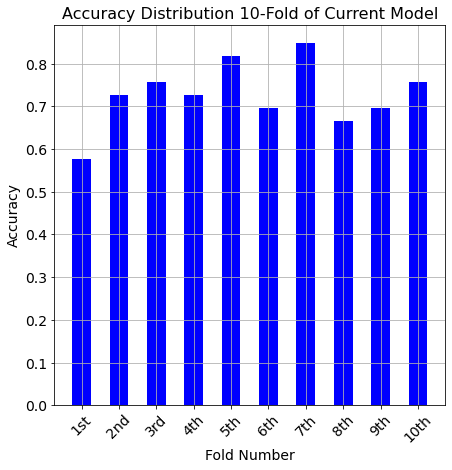

<Figure size 504x504 with 0 Axes>

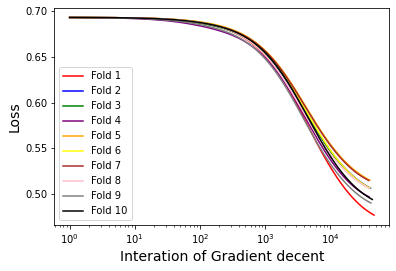

<Figure size 504x504 with 0 Axes>

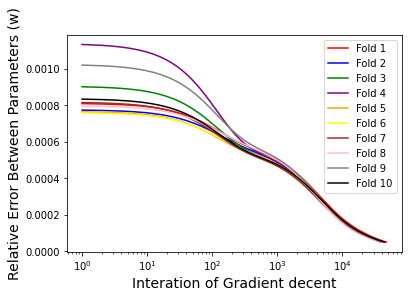

In [ ]:
## Running 
print('-------- Remove Data Test3 Start --------')
# create list to save data
remove3_order2_accur=[]
remove3_order2_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 2
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(2, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate ---  
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove3_order2_accur.append(sum(all_acu)/10)
  remove3_order2_iteration.append(sum(all_interation)/10)

Test 6. Use log transform to make the distribution has less skewness for some features

-------- log transform Data Test Start --------


<ipython-input-56-12e88d029529>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  temp.hist(bins=100, ax=ax)


The order of the linear model is now: 2
The shape of X ---> 330x18
-------- Now testing learing rate is 1--------
No.1 fold start
interations  7039
0.7575757575757576
No.2 fold start
interations  7641
0.6060606060606061
No.3 fold start
interations  7319
0.7575757575757576
No.4 fold start
interations  8827
0.6666666666666666
No.5 fold start
interations  6762
0.6363636363636364
No.6 fold start
interations  6952
0.7878787878787878
No.7 fold start
interations  7853
0.8181818181818182
No.8 fold start
interations  7814
0.6363636363636364
No.9 fold start
interations  7300
0.7272727272727273
No.10 fold start
interations  6963
0.9090909090909091
Average Accuracy --> 0.7303030303030303


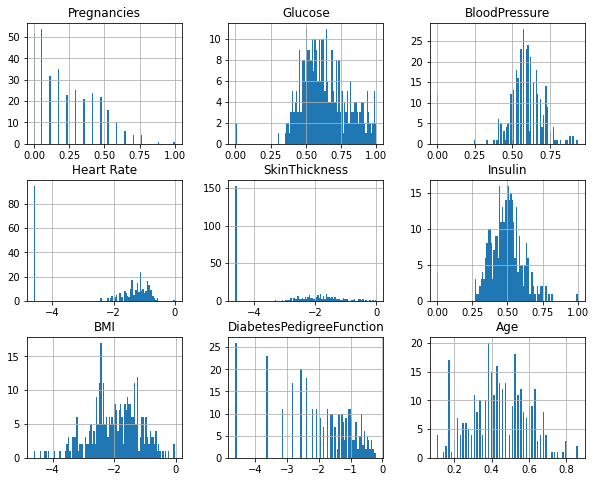

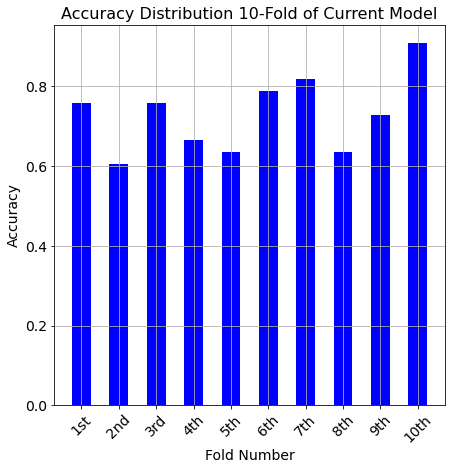

<Figure size 504x504 with 0 Axes>

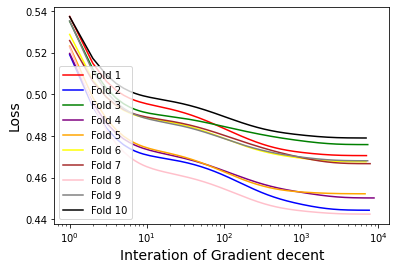

<Figure size 504x504 with 0 Axes>

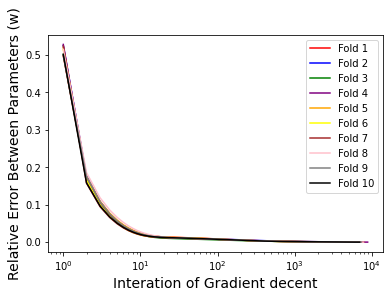

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  11454
0.7575757575757576
No.2 fold start
interations  12606
0.6060606060606061
No.3 fold start
interations  11943
0.7575757575757576
No.4 fold start
interations  14441
0.6666666666666666
No.5 fold start
interations  10628
0.6363636363636364
No.6 fold start
interations  11377
0.7878787878787878
No.7 fold start
interations  12940
0.8181818181818182
No.8 fold start
interations  12546
0.6363636363636364
No.9 fold start
interations  11908
0.7272727272727273
No.10 fold start
interations  11257
0.9090909090909091
Average Accuracy --> 0.7303030303030303


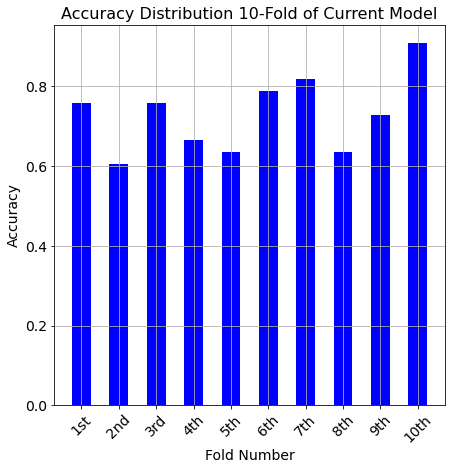

<Figure size 504x504 with 0 Axes>

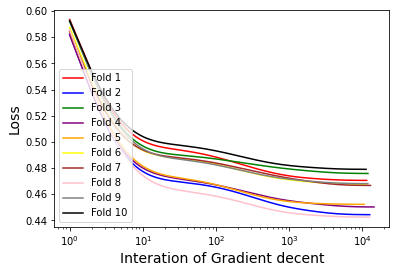

<Figure size 504x504 with 0 Axes>

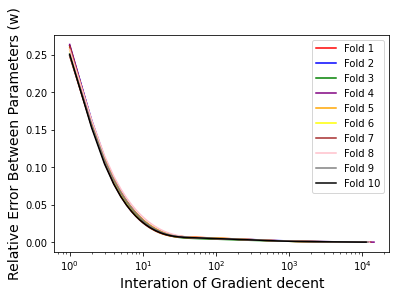

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  17667
0.7575757575757576
No.2 fold start
interations  19913
0.6060606060606061
No.3 fold start
interations  18497
0.7575757575757576
No.4 fold start
interations  22444
0.6666666666666666
No.5 fold start
interations  15578
0.6363636363636364
No.6 fold start
interations  17708
0.7878787878787878
No.7 fold start
interations  20406
0.8181818181818182
No.8 fold start
interations  19001
0.6363636363636364
No.9 fold start
interations  18447
0.7272727272727273
No.10 fold start
interations  17242
0.9090909090909091
Average Accuracy --> 0.7303030303030303


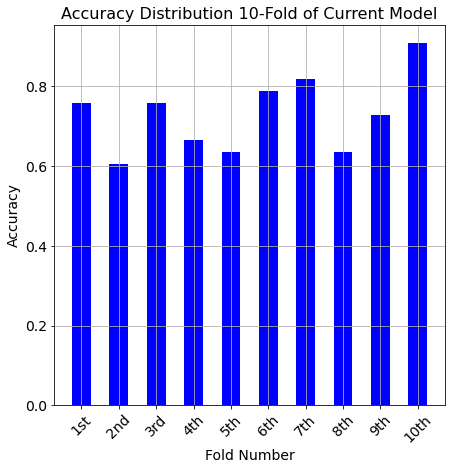

<Figure size 504x504 with 0 Axes>

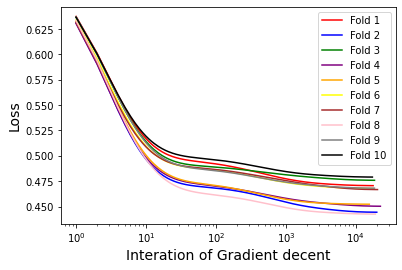

<Figure size 504x504 with 0 Axes>

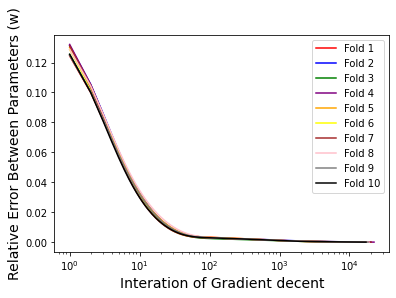

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  26878
0.7575757575757576
No.2 fold start
interations  32450
0.6060606060606061
No.3 fold start
interations  28467
0.7575757575757576
No.4 fold start
interations  34713
0.6666666666666666
No.5 fold start
interations  21035
0.6363636363636364
No.6 fold start
interations  27599
0.7878787878787878
No.7 fold start
interations  33156
0.8181818181818182
No.8 fold start
interations  27750
0.6666666666666666
No.9 fold start
interations  28407
0.7272727272727273
No.10 fold start
interations  26007
0.9090909090909091
Average Accuracy --> 0.7333333333333334


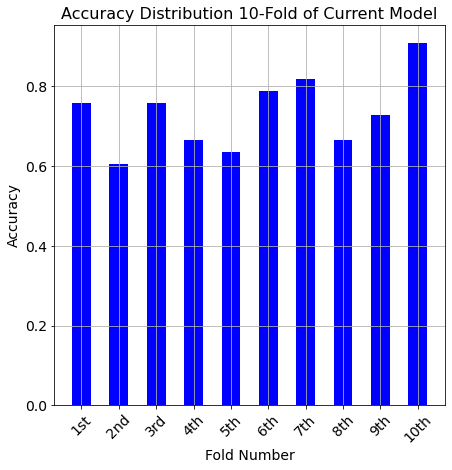

<Figure size 504x504 with 0 Axes>

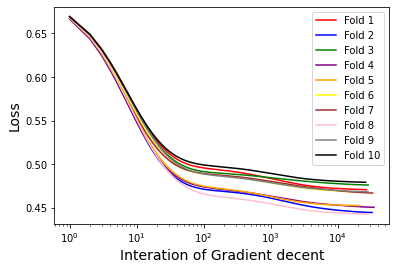

<Figure size 504x504 with 0 Axes>

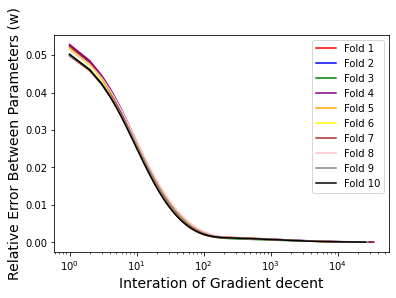

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  28558
0.7575757575757576
No.2 fold start
interations  39154
0.6060606060606061
No.3 fold start
interations  30929
0.7575757575757576
No.4 fold start
interations  37289
0.6666666666666666
No.5 fold start
interations  21205
0.6363636363636364
No.6 fold start
interations  30320
0.7878787878787878
No.7 fold start
interations  39918
0.8181818181818182
No.8 fold start
interations  27704
0.6363636363636364
No.9 fold start
interations  30480
0.7575757575757576
No.10 fold start
interations  27284
0.9090909090909091
Average Accuracy --> 0.7333333333333334


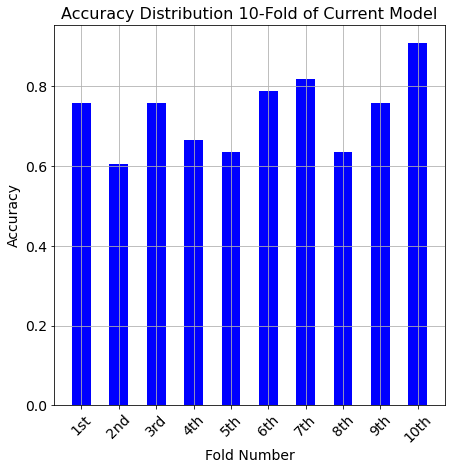

<Figure size 504x504 with 0 Axes>

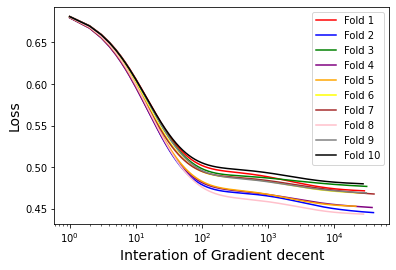

<Figure size 504x504 with 0 Axes>

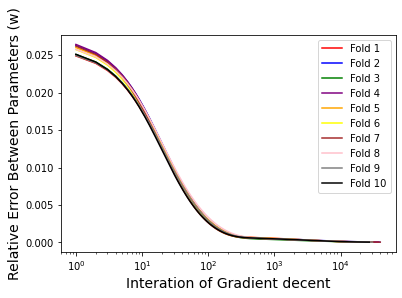

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  26671
0.7878787878787878
No.2 fold start
interations  34192
0.6060606060606061
No.3 fold start
interations  23417
0.7878787878787878
No.4 fold start
interations  27757
0.6060606060606061
No.5 fold start
interations  22876
0.6363636363636364
No.6 fold start
interations  24869
0.7878787878787878
No.7 fold start
interations  33351
0.8181818181818182
No.8 fold start
interations  25517
0.6363636363636364
No.9 fold start
interations  24621
0.7575757575757576
No.10 fold start
interations  23112
0.8787878787878788
Average Accuracy --> 0.7303030303030303


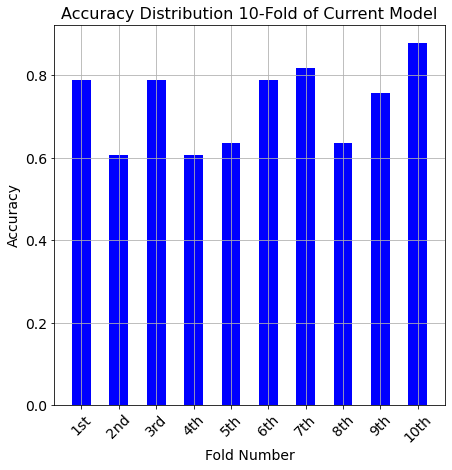

<Figure size 504x504 with 0 Axes>

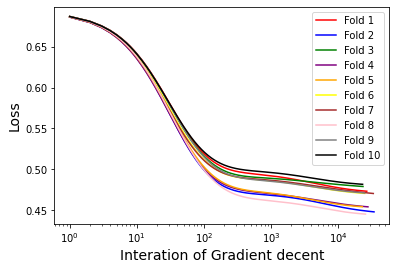

<Figure size 504x504 with 0 Axes>

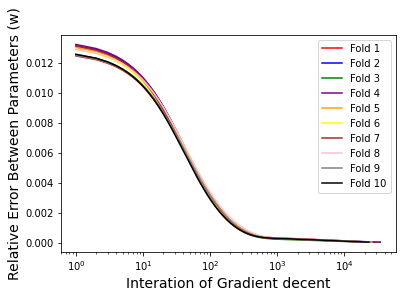

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  23554
0.7878787878787878
No.2 fold start
interations  26726
0.6060606060606061
No.3 fold start
interations  14014
0.7878787878787878
No.4 fold start
interations  21144
0.6363636363636364
No.5 fold start
interations  21520
0.6060606060606061
No.6 fold start
interations  20339
0.7878787878787878
No.7 fold start
interations  20171
0.8181818181818182
No.8 fold start
interations  22634
0.6363636363636364
No.9 fold start
interations  19031
0.7272727272727273
No.10 fold start
interations  19697
0.8484848484848485
Average Accuracy --> 0.7242424242424244


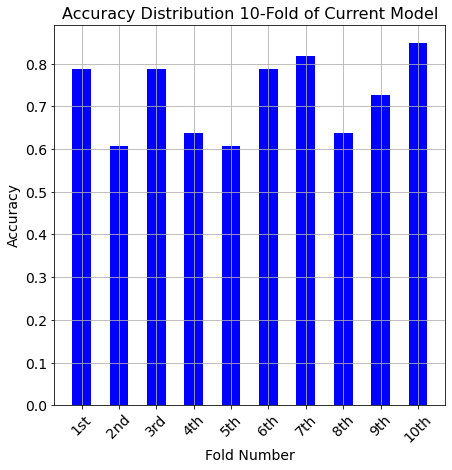

<Figure size 504x504 with 0 Axes>

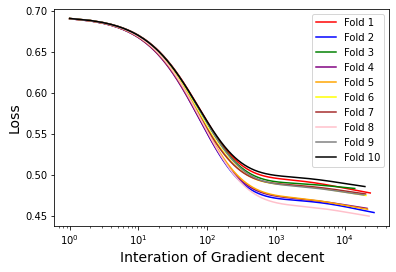

<Figure size 504x504 with 0 Axes>

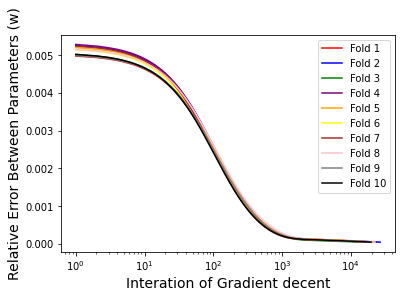

In [ ]:
## Running 
print('-------- log transform Data Test Start --------')
# create list to save data
remove4_order2_accur=[]
remove4_order2_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')

kidney_df[['Heart Rate', 'SkinThickness', 'BMI', 'DiabetesPedigreeFunction']] = kidney_df[['Heart Rate', 'SkinThickness', 'BMI', 'DiabetesPedigreeFunction']] + 0.01
kidney_df[['Heart Rate', 'SkinThickness', 'BMI', 'DiabetesPedigreeFunction']] = kidney_df[['Heart Rate', 'SkinThickness', 'BMI', 'DiabetesPedigreeFunction']].apply(np.log)
# check again hist plot
fig, ax = plt.subplots(figsize=(10, 8))
temp = kidney_df.drop('blood label', axis=1)
temp.hist(bins=100, ax=ax)
fig.show()
#
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 2
X_kidney = changeModelOrder(2, X_kidney)
X_kidney = featureStandardization(X_kidney)
## testing 7 different learning rates
learn_test = learn_para 
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove4_order2_accur.append(sum(all_acu)/10)
  remove4_order2_iteration.append(sum(all_interation)/10)

Plot the Second model result

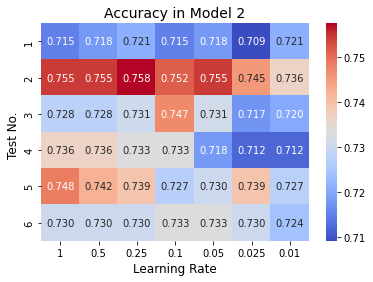

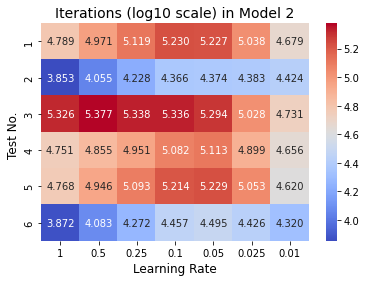

In [ ]:
acc = np.array([raw_order2_accur, std_order2_accur, remove_order2_accur,remove2_order2_accur,remove3_order2_accur,remove4_order2_accur])
xticklabels = ['1', '0.5', '0.25', '0.1', '0.05', '0.025', '0.01']
yticklabels = ['1', '2', '3', '4', '5', '6']
ax = sns.heatmap(acc, annot=True, fmt='.3f', xticklabels=xticklabels, yticklabels=yticklabels, cmap='coolwarm')
ax.set_xlabel('Learning Rate', fontsize=12)
ax.set_ylabel('Test No. ', fontsize=12)
ax.set_title("Accuracy in Model 2", fontsize=14)
plt.show()

time = np.log10(np.array([raw_order2_iteration,std_order2_iteration,remove_order2_iteration,remove2_order2_iteration,remove3_order2_iteration,remove4_order2_iteration]))
xticklabels = ['1', '0.5', '0.25', '0.1', '0.05', '0.025', '0.01']
yticklabels = ['1', '2', '3', '4', '5', '6']
ax = sns.heatmap(time, annot=True, fmt='.3f', xticklabels=xticklabels, yticklabels=yticklabels, cmap='coolwarm')
ax.set_xlabel('Learning Rate', fontsize=12)
ax.set_ylabel('Test No. ', fontsize=12)
ax.set_title("Iterations (log10 scale) in Model 2", fontsize=14)
plt.show()

-------- Model 3 (polynomial order 3)-------  stop_thresold increase to 0.0001 because of features increase

Test 1. Raw data

-------- Raw Data Test Start --------
The order of the linear model is now: 3
The shape of X ---> 330x36
-------- Now testing learing rate is 1--------
No.1 fold start
interations  391485
0.7878787878787878
No.2 fold start
interations  357635
0.7272727272727273
No.3 fold start
interations  312263
0.696969696969697
No.4 fold start
interations  321731
0.5757575757575758
No.5 fold start
interations  450980
0.7575757575757576
No.6 fold start
interations  256104
0.696969696969697
No.7 fold start
interations  403044
0.6060606060606061
No.8 fold start
interations  287138
0.696969696969697
No.9 fold start
interations  424358
0.6666666666666666
No.10 fold start
interations  440482
0.8787878787878788
Average Accuracy --> 0.7090909090909092


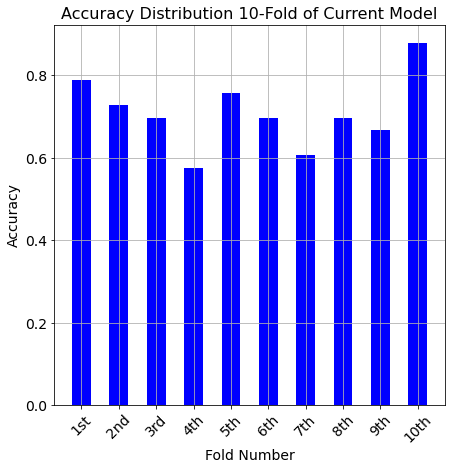

<Figure size 504x504 with 0 Axes>

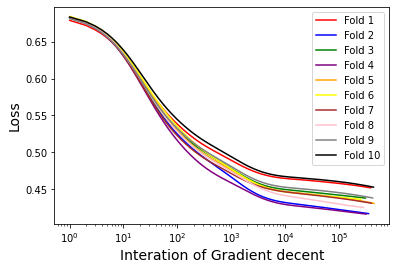

<Figure size 504x504 with 0 Axes>

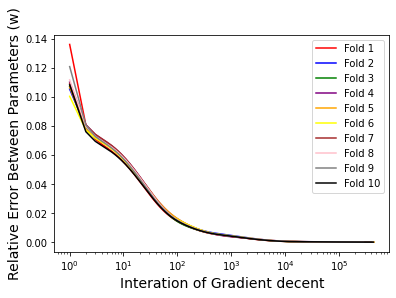

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  140186
0.7878787878787878
No.2 fold start
interations  170993
0.7272727272727273
No.3 fold start
interations  143957
0.696969696969697
No.4 fold start
interations  161398
0.5757575757575758
No.5 fold start
interations  162447
0.7272727272727273
No.6 fold start
interations  130594
0.7575757575757576
No.7 fold start
interations  166921
0.6363636363636364
No.8 fold start
interations  202154
0.696969696969697
No.9 fold start
interations  152193
0.6666666666666666
No.10 fold start
interations  142951
0.8787878787878788
Average Accuracy --> 0.7151515151515152


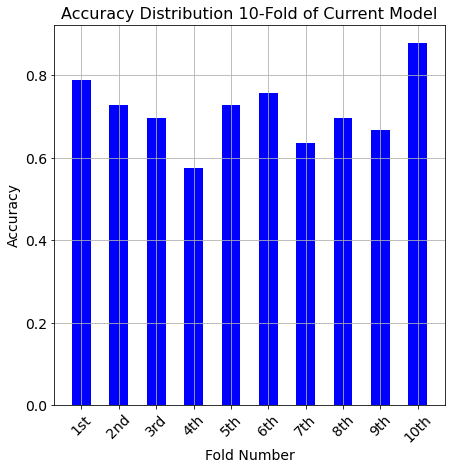

<Figure size 504x504 with 0 Axes>

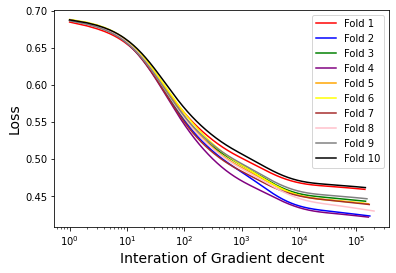

<Figure size 504x504 with 0 Axes>

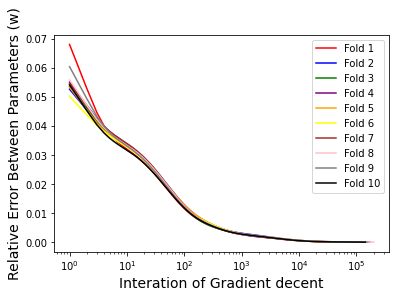

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  58176
0.8787878787878788
No.2 fold start
interations  85799
0.7575757575757576
No.3 fold start
interations  69270
0.696969696969697
No.4 fold start
interations  73963
0.5454545454545454
No.5 fold start
interations  71512
0.7272727272727273
No.6 fold start
interations  69698
0.7878787878787878
No.7 fold start
interations  77729
0.6363636363636364
No.8 fold start
interations  101284
0.7272727272727273
No.9 fold start
interations  64642
0.6666666666666666
No.10 fold start
interations  60992
0.9090909090909091
Average Accuracy --> 0.7333333333333334


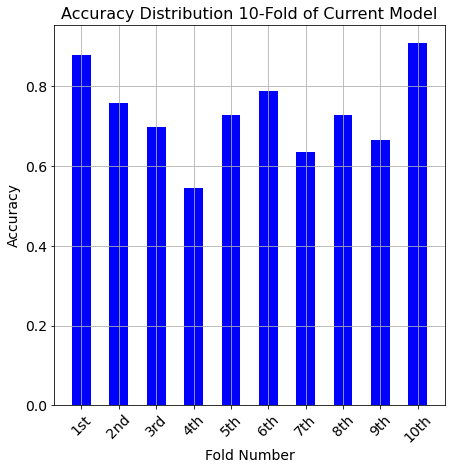

<Figure size 504x504 with 0 Axes>

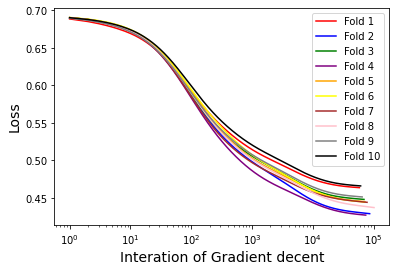

<Figure size 504x504 with 0 Axes>

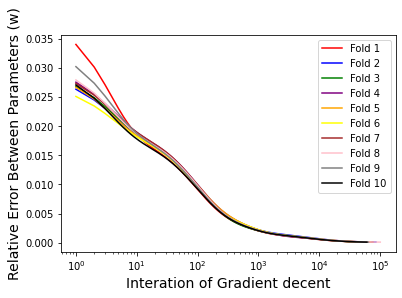

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  56307
0.8787878787878788
No.2 fold start
interations  67172
0.6363636363636364
No.3 fold start
interations  59767
0.696969696969697
No.4 fold start
interations  68431
0.48484848484848486
No.5 fold start
interations  64253
0.696969696969697
No.6 fold start
interations  65014
0.7272727272727273
No.7 fold start
interations  58974
0.6363636363636364
No.8 fold start
interations  71538
0.7272727272727273
No.9 fold start
interations  60694
0.6666666666666666
No.10 fold start
interations  59267
0.9090909090909091
Average Accuracy --> 0.7060606060606062


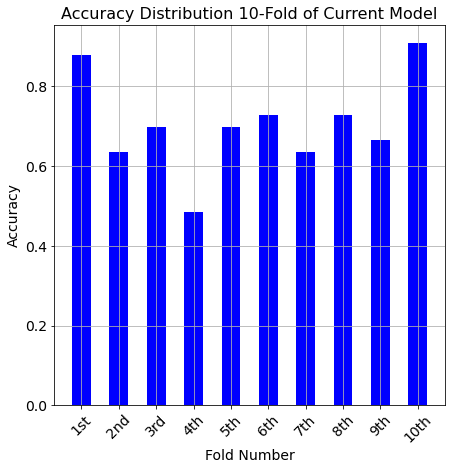

<Figure size 504x504 with 0 Axes>

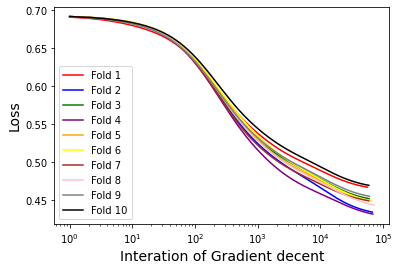

<Figure size 504x504 with 0 Axes>

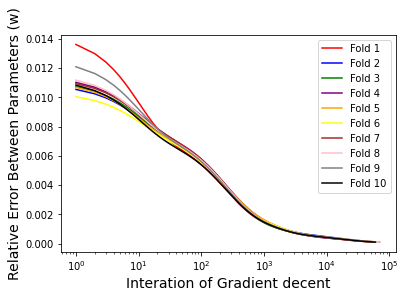

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  53695
0.9090909090909091
No.2 fold start
interations  66109
0.6363636363636364
No.3 fold start
interations  59405
0.696969696969697
No.4 fold start
interations  61248
0.5151515151515151
No.5 fold start
interations  61966
0.696969696969697
No.6 fold start
interations  62482
0.696969696969697
No.7 fold start
interations  53159
0.6363636363636364
No.8 fold start
interations  65125
0.7272727272727273
No.9 fold start
interations  58742
0.7272727272727273
No.10 fold start
interations  57544
0.9090909090909091
Average Accuracy --> 0.7151515151515152


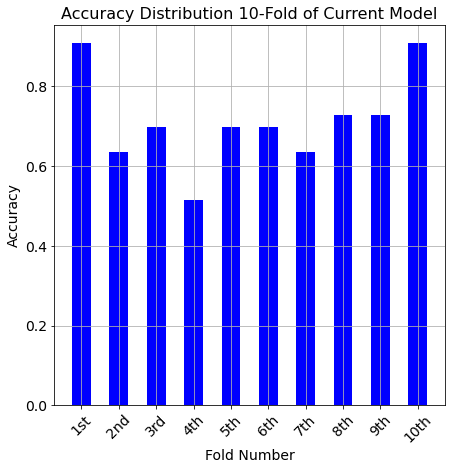

<Figure size 504x504 with 0 Axes>

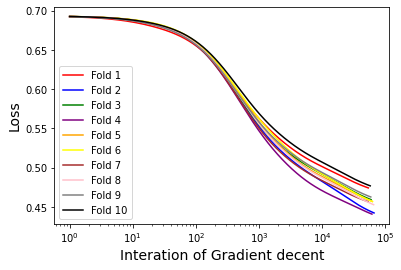

<Figure size 504x504 with 0 Axes>

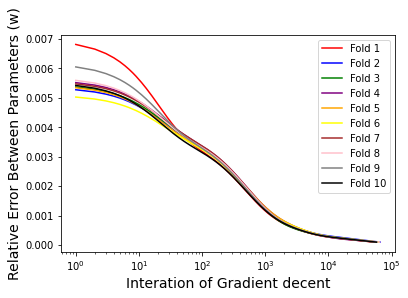

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  37869
0.8787878787878788
No.2 fold start
interations  51932
0.6363636363636364
No.3 fold start
interations  43621
0.7575757575757576
No.4 fold start
interations  33576
0.5454545454545454
No.5 fold start
interations  41854
0.7272727272727273
No.6 fold start
interations  45382
0.696969696969697
No.7 fold start
interations  38247
0.6363636363636364
No.8 fold start
interations  42397
0.7575757575757576
No.9 fold start
interations  41828
0.6666666666666666
No.10 fold start
interations  41421
0.8787878787878788
Average Accuracy --> 0.7181818181818183


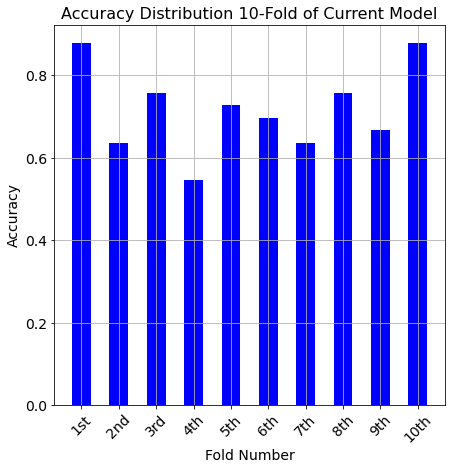

<Figure size 504x504 with 0 Axes>

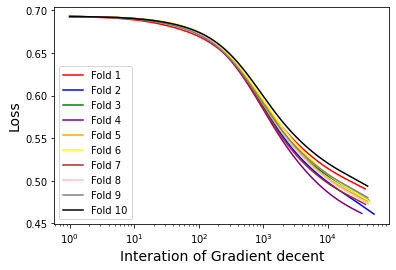

<Figure size 504x504 with 0 Axes>

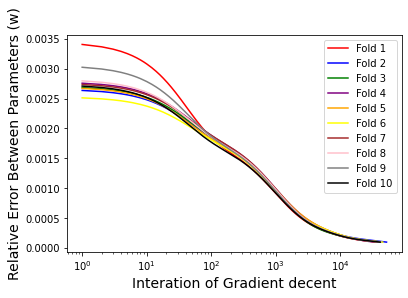

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  17771
0.8787878787878788
No.2 fold start
interations  19666
0.696969696969697
No.3 fold start
interations  17265
0.6060606060606061
No.4 fold start
interations  20438
0.6060606060606061
No.5 fold start
interations  20538
0.696969696969697
No.6 fold start
interations  20663
0.6666666666666666
No.7 fold start
interations  18487
0.6666666666666666
No.8 fold start
interations  18906
0.7878787878787878
No.9 fold start
interations  18375
0.6666666666666666
No.10 fold start
interations  18132
0.7878787878787878
Average Accuracy --> 0.7060606060606062


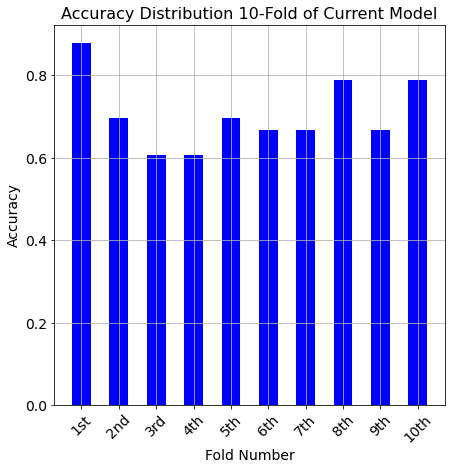

<Figure size 504x504 with 0 Axes>

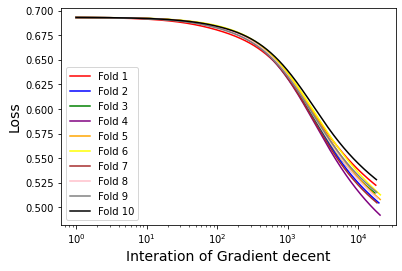

<Figure size 504x504 with 0 Axes>

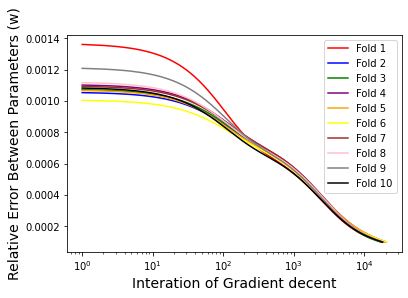

In [ ]:
## Running for the raw data
print('-------- Raw Data Test Start --------')
# create list to save data
raw_order3_accur=[]
raw_order3_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 3
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(3, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.0001, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  raw_order3_accur.append(sum(all_acu)/10)
  raw_order3_iteration.append(sum(all_interation)/10)

Test 2. Standardization features

-------- Standardization Data Test Start --------
The order of the linear model is now: 3
The shape of X ---> 330x36
-------- Now testing learing rate is 1--------
No.1 fold start
interations  173863
0.8181818181818182
No.2 fold start
interations  190851
0.6666666666666666
No.3 fold start
interations  216612
0.7575757575757576
No.4 fold start
interations  190022
0.8484848484848485
No.5 fold start
interations  154707
0.7878787878787878
No.6 fold start
interations  158926
0.8181818181818182
No.7 fold start
interations  55080
0.6666666666666666
No.8 fold start
interations  187180
0.6666666666666666
No.9 fold start
interations  244748
0.5757575757575758
No.10 fold start
interations  190758
0.7575757575757576
Average Accuracy --> 0.7363636363636366


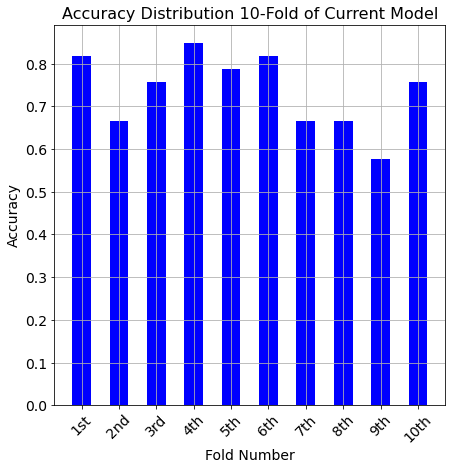

<Figure size 504x504 with 0 Axes>

/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


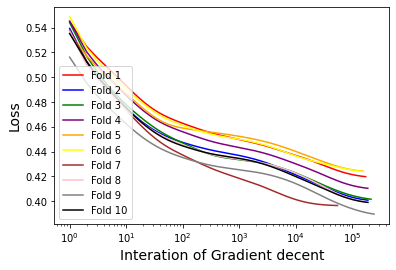

<Figure size 504x504 with 0 Axes>

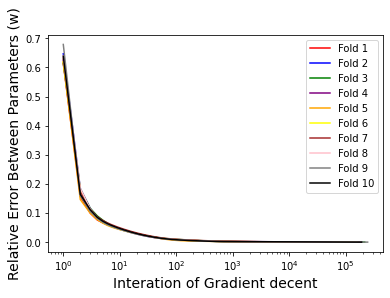

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  188768
0.7878787878787878
No.2 fold start
interations  207756
0.6666666666666666
No.3 fold start
interations  209749
0.7878787878787878
No.4 fold start
interations  204057
0.8484848484848485
No.5 fold start
interations  170394
0.7878787878787878
No.6 fold start
interations  161657
0.7878787878787878
No.7 fold start
interations  67584
0.6666666666666666
No.8 fold start
interations  213946
0.6666666666666666
No.9 fold start
interations  236941
0.5757575757575758
No.10 fold start
interations  209056
0.7272727272727273
Average Accuracy --> 0.7303030303030305


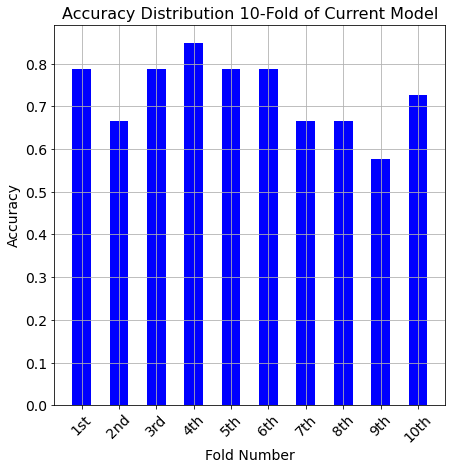

<Figure size 504x504 with 0 Axes>

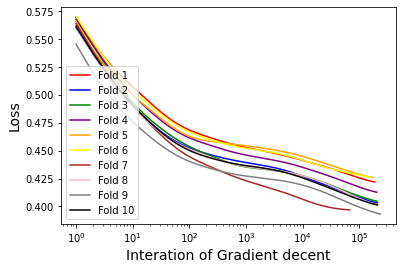

<Figure size 504x504 with 0 Axes>

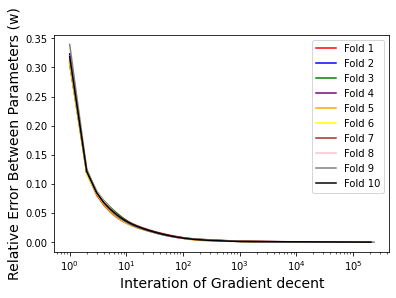

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  155045
0.7878787878787878
No.2 fold start
interations  167968
0.696969696969697
No.3 fold start
interations  165764
0.7575757575757576
No.4 fold start
interations  169178
0.8181818181818182
No.5 fold start
interations  145455
0.8181818181818182
No.6 fold start
interations  105350
0.7878787878787878
No.7 fold start
interations  77001
0.6666666666666666
No.8 fold start
interations  191742
0.6666666666666666
No.9 fold start
interations  180315
0.5757575757575758
No.10 fold start
interations  169082
0.7272727272727273
Average Accuracy --> 0.7303030303030305


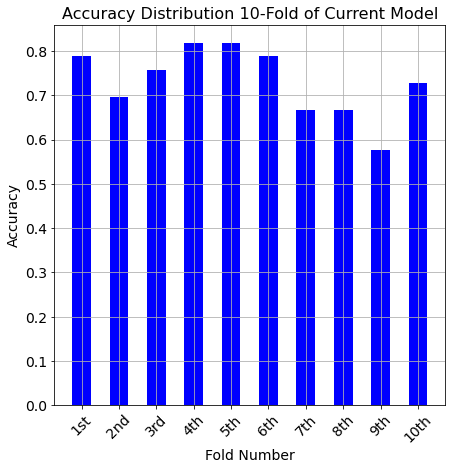

<Figure size 504x504 with 0 Axes>

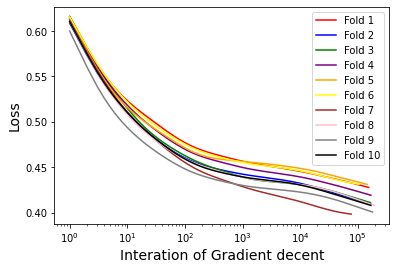

<Figure size 504x504 with 0 Axes>

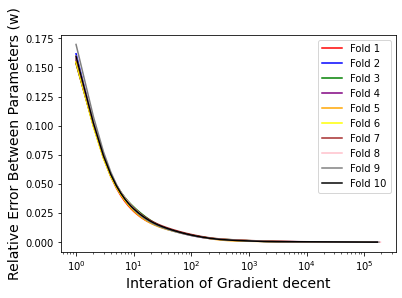

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  58723
0.7878787878787878
No.2 fold start
interations  76466
0.7272727272727273
No.3 fold start
interations  55606
0.7575757575757576
No.4 fold start
interations  64010
0.7878787878787878
No.5 fold start
interations  60589
0.7878787878787878
No.6 fold start
interations  66563
0.7878787878787878
No.7 fold start
interations  69120
0.6666666666666666
No.8 fold start
interations  59437
0.6666666666666666
No.9 fold start
interations  59132
0.6363636363636364
No.10 fold start
interations  74739
0.7272727272727273
Average Accuracy --> 0.7333333333333335


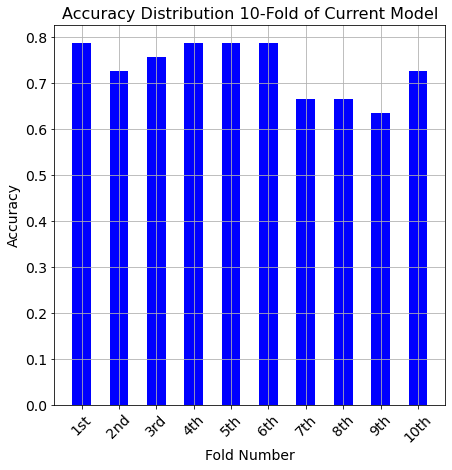

<Figure size 504x504 with 0 Axes>

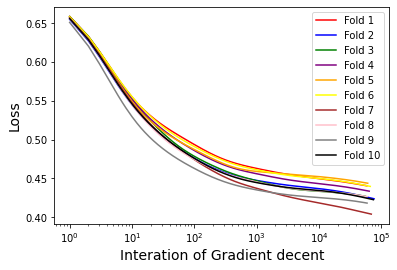

<Figure size 504x504 with 0 Axes>

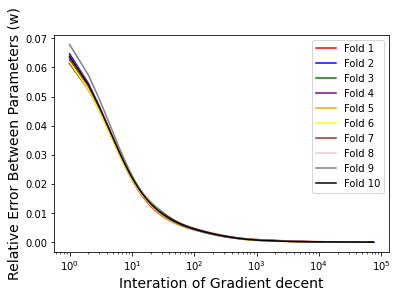

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  21132
0.7878787878787878
No.2 fold start
interations  19549
0.6363636363636364
No.3 fold start
interations  13514
0.7575757575757576
No.4 fold start
interations  18938
0.7878787878787878
No.5 fold start
interations  15073
0.8181818181818182
No.6 fold start
interations  16083
0.7878787878787878
No.7 fold start
interations  32281
0.696969696969697
No.8 fold start
interations  13934
0.6363636363636364
No.9 fold start
interations  13153
0.696969696969697
No.10 fold start
interations  14631
0.7272727272727273
Average Accuracy --> 0.7333333333333335


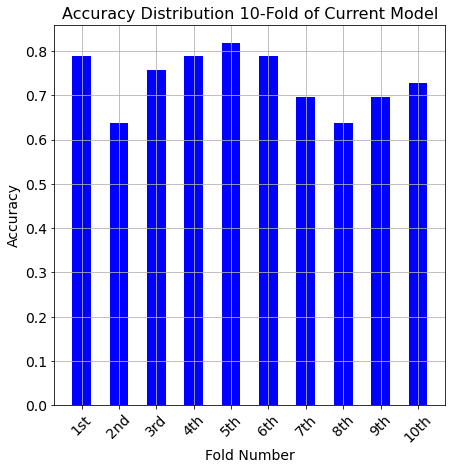

<Figure size 504x504 with 0 Axes>

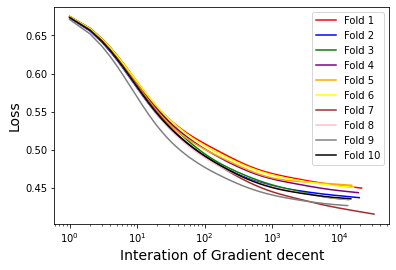

<Figure size 504x504 with 0 Axes>

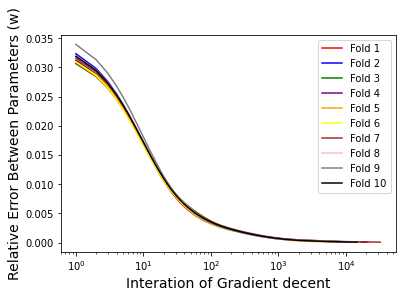

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  13314
0.7878787878787878
No.2 fold start
interations  11214
0.6060606060606061
No.3 fold start
interations  13655
0.7575757575757576
No.4 fold start
interations  13210
0.8484848484848485
No.5 fold start
interations  6675
0.7878787878787878
No.6 fold start
interations  11899
0.8181818181818182
No.7 fold start
interations  17908
0.696969696969697
No.8 fold start
interations  12614
0.6363636363636364
No.9 fold start
interations  11045
0.6666666666666666
No.10 fold start
interations  11104
0.7272727272727273
Average Accuracy --> 0.7333333333333335


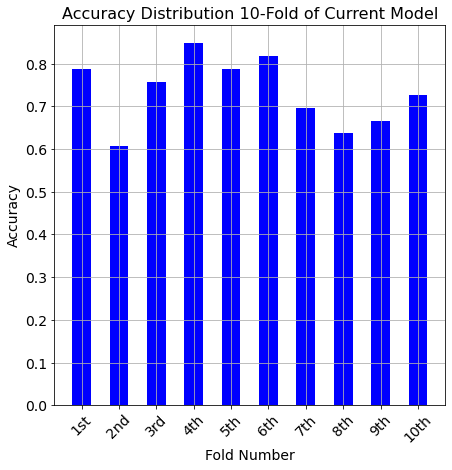

<Figure size 504x504 with 0 Axes>

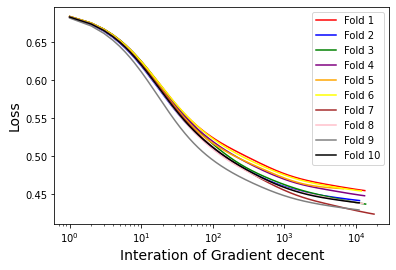

<Figure size 504x504 with 0 Axes>

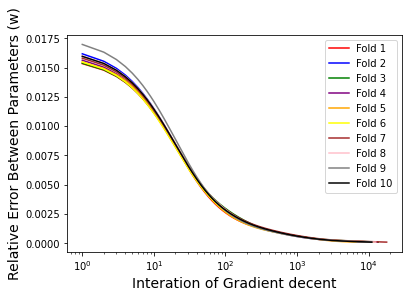

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  7751
0.7878787878787878
No.2 fold start
interations  7113
0.6060606060606061
No.3 fold start
interations  9076
0.8181818181818182
No.4 fold start
interations  7553
0.8484848484848485
No.5 fold start
interations  6331
0.8484848484848485
No.6 fold start
interations  7735
0.8181818181818182
No.7 fold start
interations  9610
0.7272727272727273
No.8 fold start
interations  8049
0.696969696969697
No.9 fold start
interations  7278
0.6363636363636364
No.10 fold start
interations  7582
0.7272727272727273
Average Accuracy --> 0.7515151515151517


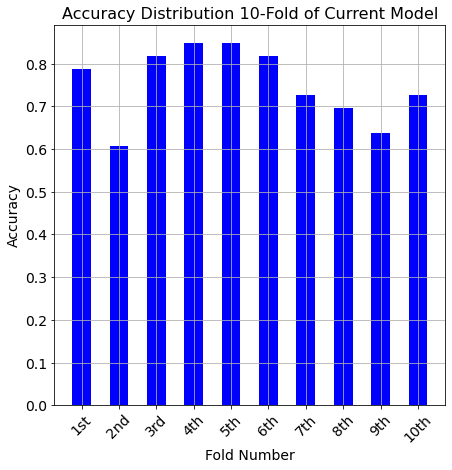

<Figure size 504x504 with 0 Axes>

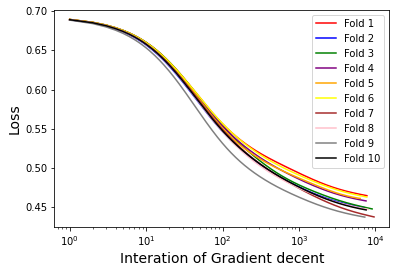

<Figure size 504x504 with 0 Axes>

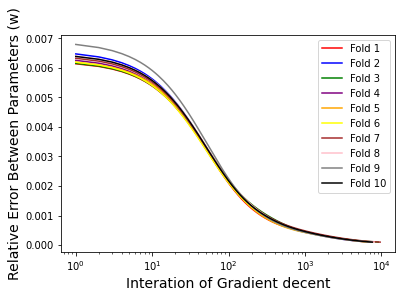

In [ ]:
## Running for the Standardization data
print('-------- Standardization Data Test Start --------')
# create list to save data
std_order3_accur=[]
std_order3_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()

# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 3
X_kidney = changeModelOrder(3, X_kidney)
X_kidney = featureStandardization(X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.0001, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  std_order3_accur.append(sum(all_acu)/10)
  std_order3_iteration.append(sum(all_interation)/10)

Test 3. Removing outlier

-------- Remove Outliers Data Test Start --------
The order of the linear model is now: 3
The shape of X ---> 296x36
-------- Now testing learing rate is 1--------
No.1 fold start
interations  611108
0.6896551724137931
No.2 fold start
interations  522104
0.6896551724137931
No.3 fold start
interations  287249
0.7241379310344828
No.4 fold start
interations  476896
0.8275862068965517
No.5 fold start
interations  509042
0.7241379310344828
No.6 fold start
interations  563184
0.8620689655172413
No.7 fold start
interations  661676
0.7586206896551724
No.8 fold start
interations  510978
0.7241379310344828
No.9 fold start
interations  459092
0.7241379310344828
No.10 fold start
interations  475725
0.8285714285714286
Average Accuracy --> 0.7552709359605911


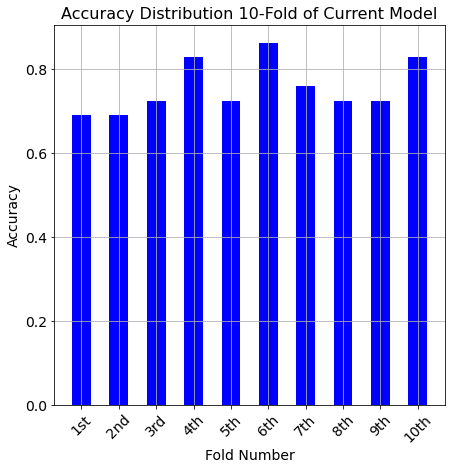

<Figure size 504x504 with 0 Axes>

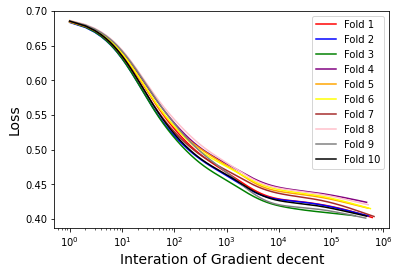

<Figure size 504x504 with 0 Axes>

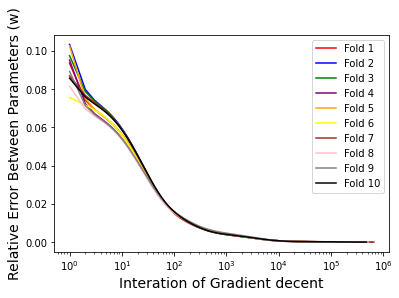

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  270401
0.6896551724137931
No.2 fold start
interations  272030
0.6896551724137931
No.3 fold start
interations  144873
0.7241379310344828
No.4 fold start
interations  228890
0.7586206896551724
No.5 fold start
interations  276358
0.7586206896551724
No.6 fold start
interations  291447
0.8620689655172413
No.7 fold start
interations  340591
0.7586206896551724
No.8 fold start
interations  258218
0.7241379310344828
No.9 fold start
interations  220517
0.7586206896551724
No.10 fold start
interations  259497
0.8285714285714286
Average Accuracy --> 0.7552709359605911


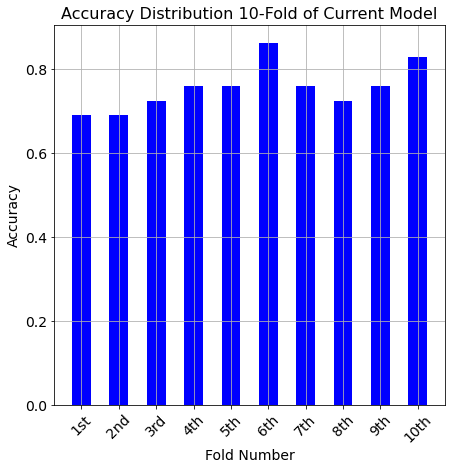

<Figure size 504x504 with 0 Axes>

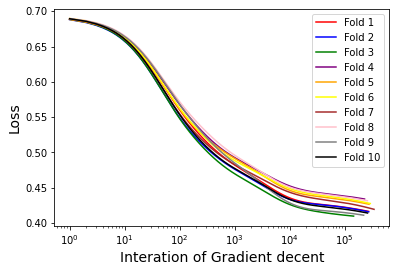

<Figure size 504x504 with 0 Axes>

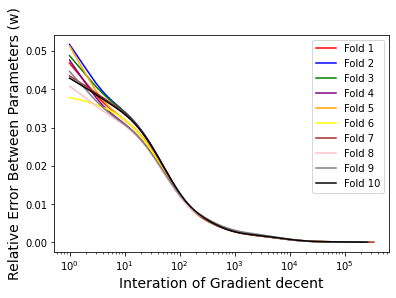

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  78590
0.7241379310344828
No.2 fold start
interations  75034
0.6896551724137931
No.3 fold start
interations  100100
0.7241379310344828
No.4 fold start
interations  93171
0.7586206896551724
No.5 fold start
interations  90751
0.7586206896551724
No.6 fold start
interations  96507
0.8620689655172413
No.7 fold start
interations  104075
0.7586206896551724
No.8 fold start
interations  95591
0.7241379310344828
No.9 fold start
interations  72513
0.7241379310344828
No.10 fold start
interations  85545
0.8571428571428571
Average Accuracy --> 0.758128078817734


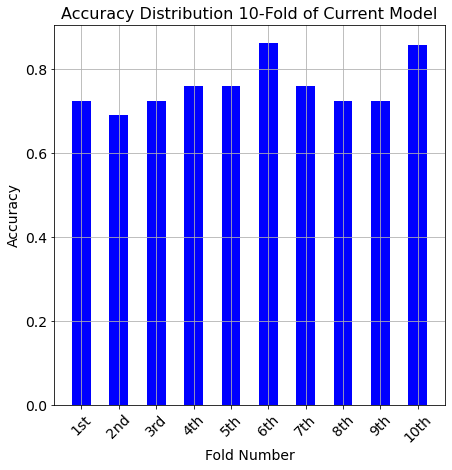

<Figure size 504x504 with 0 Axes>

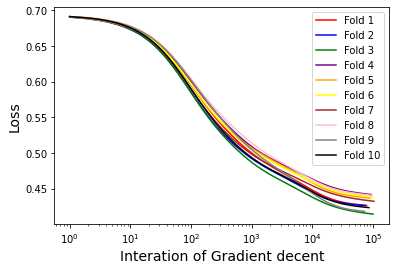

<Figure size 504x504 with 0 Axes>

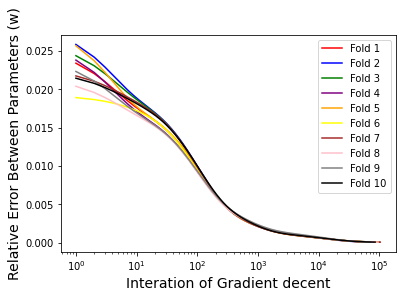

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  75452
0.7241379310344828
No.2 fold start
interations  68407
0.6896551724137931
No.3 fold start
interations  79218
0.7241379310344828
No.4 fold start
interations  77976
0.7586206896551724
No.5 fold start
interations  74938
0.7586206896551724
No.6 fold start
interations  75583
0.896551724137931
No.7 fold start
interations  76540
0.7931034482758621
No.8 fold start
interations  74905
0.7241379310344828
No.9 fold start
interations  81697
0.7241379310344828
No.10 fold start
interations  77635
0.8571428571428571
Average Accuracy --> 0.7650246305418719


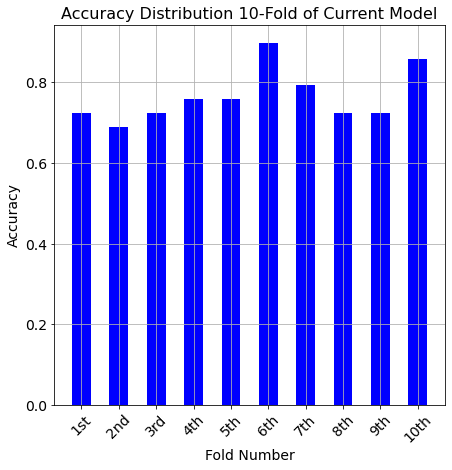

<Figure size 504x504 with 0 Axes>

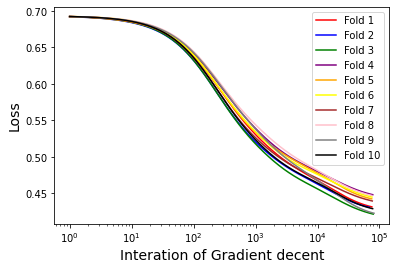

<Figure size 504x504 with 0 Axes>

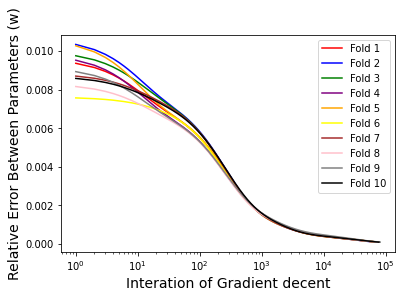

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  73481
0.6896551724137931
No.2 fold start
interations  68622
0.6896551724137931
No.3 fold start
interations  70509
0.6551724137931034
No.4 fold start
interations  68519
0.7931034482758621
No.5 fold start
interations  73676
0.7931034482758621
No.6 fold start
interations  67814
0.9310344827586207
No.7 fold start
interations  66827
0.6896551724137931
No.8 fold start
interations  70100
0.7586206896551724
No.9 fold start
interations  83246
0.7241379310344828
No.10 fold start
interations  73929
0.7714285714285715
Average Accuracy --> 0.7495566502463055


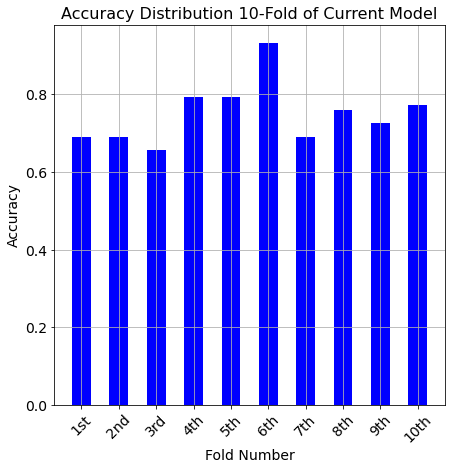

<Figure size 504x504 with 0 Axes>

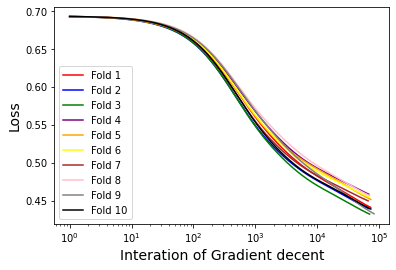

<Figure size 504x504 with 0 Axes>

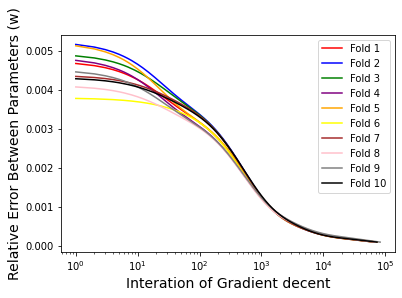

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  43994
0.6551724137931034
No.2 fold start
interations  41130
0.6206896551724138
No.3 fold start
interations  39378
0.5862068965517241
No.4 fold start
interations  37911
0.7586206896551724
No.5 fold start
interations  45206
0.8275862068965517
No.6 fold start
interations  37007
0.7931034482758621
No.7 fold start
interations  36508
0.6551724137931034
No.8 fold start
interations  43543
0.7586206896551724
No.9 fold start
interations  56509
0.7586206896551724
No.10 fold start
interations  40616
0.7142857142857143
Average Accuracy --> 0.712807881773399


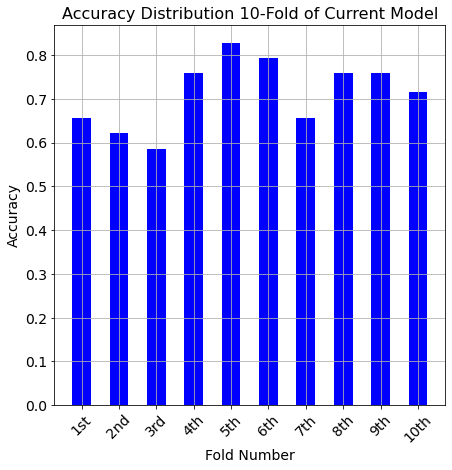

<Figure size 504x504 with 0 Axes>

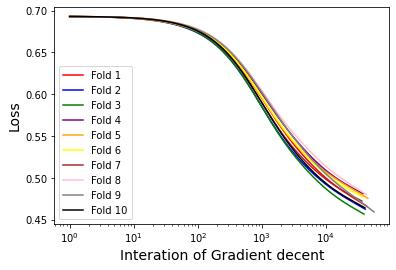

<Figure size 504x504 with 0 Axes>

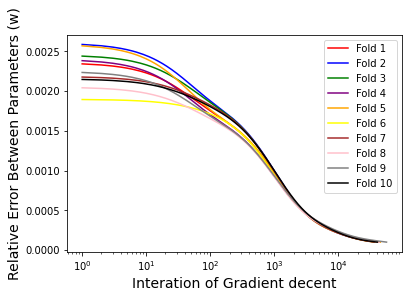

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  20749
0.6551724137931034
No.2 fold start
interations  18964
0.6206896551724138
No.3 fold start
interations  19904
0.5517241379310345
No.4 fold start
interations  20699
0.8620689655172413
No.5 fold start
interations  18821
0.7586206896551724
No.6 fold start
interations  20262
0.8620689655172413
No.7 fold start
interations  19240
0.6206896551724138
No.8 fold start
interations  20907
0.7931034482758621
No.9 fold start
interations  22220
0.7931034482758621
No.10 fold start
interations  20285
0.7142857142857143
Average Accuracy --> 0.7231527093596058


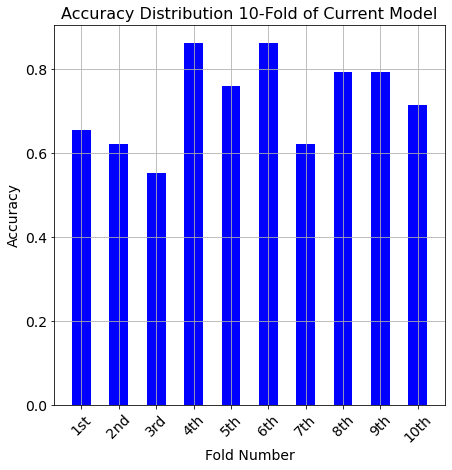

<Figure size 504x504 with 0 Axes>

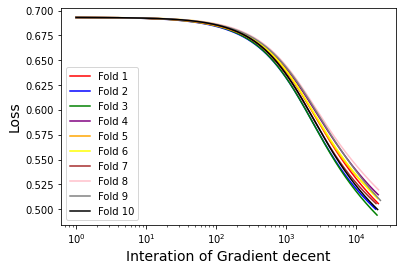

<Figure size 504x504 with 0 Axes>

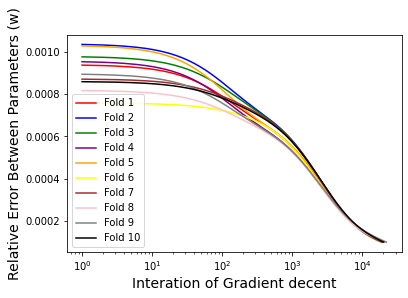

In [ ]:
## Running for the remove outlier data
print('-------- Remove Outliers Data Test Start --------')
# create list to save data
remove_order3_accur=[]
remove_order3_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
columns = ['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
# remove outlier in features
outliers = detect_outliers(kidney_df, columns)
outliers = list(set(outliers))
kidney_df = kidney_df.drop(outliers)
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 3
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(3, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.0001, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove_order3_accur.append(sum(all_acu)/10)
  remove_order3_iteration.append(sum(all_interation)/10)

Test 4. Removing relatively low correlation value between features and label (Age and heart rate)

-------- Remove Data Test2 Start --------
The order of the linear model is now: 3
The shape of X ---> 330x28
-------- Now testing learing rate is 1--------
No.1 fold start
interations  253597
0.5757575757575758
No.2 fold start
interations  203978
0.6666666666666666
No.3 fold start
interations  429074
0.7272727272727273
No.4 fold start
interations  268158
0.7575757575757576
No.5 fold start
interations  309834
0.7272727272727273
No.6 fold start
interations  358976
0.696969696969697
No.7 fold start
interations  352802
0.6060606060606061
No.8 fold start
interations  215104
0.7878787878787878
No.9 fold start
interations  341142
0.8181818181818182
No.10 fold start
interations  181607
0.6060606060606061
Average Accuracy --> 0.6969696969696971


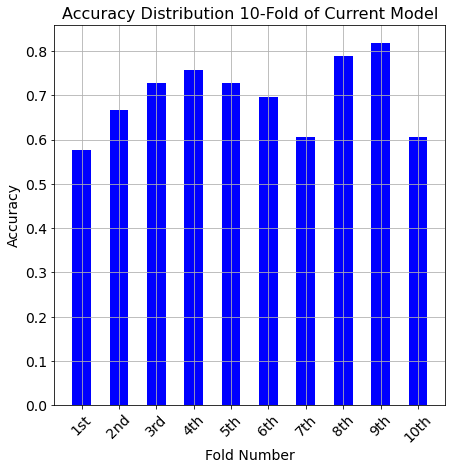

<Figure size 504x504 with 0 Axes>

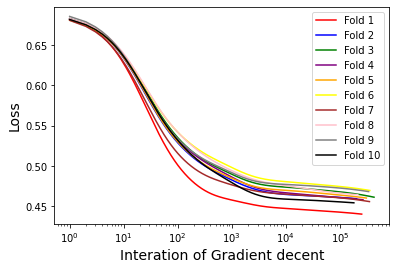

<Figure size 504x504 with 0 Axes>

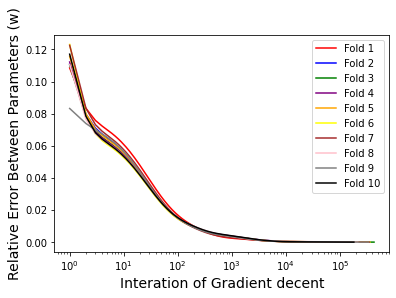

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  91145
0.6060606060606061
No.2 fold start
interations  68045
0.696969696969697
No.3 fold start
interations  119017
0.7272727272727273
No.4 fold start
interations  102566
0.7878787878787878
No.5 fold start
interations  120966
0.7272727272727273
No.6 fold start
interations  113497
0.7575757575757576
No.7 fold start
interations  84883
0.6363636363636364
No.8 fold start
interations  145457
0.7878787878787878
No.9 fold start
interations  92427
0.8181818181818182
No.10 fold start
interations  69475
0.6060606060606061
Average Accuracy --> 0.7151515151515153


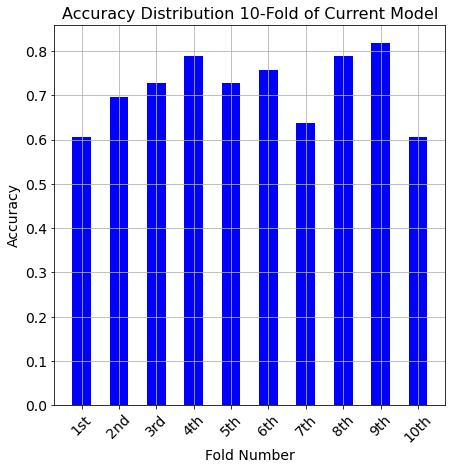

<Figure size 504x504 with 0 Axes>

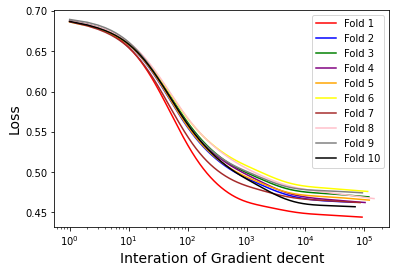

<Figure size 504x504 with 0 Axes>

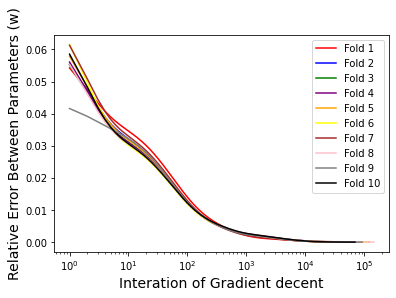

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  42499
0.6060606060606061
No.2 fold start
interations  45839
0.6666666666666666
No.3 fold start
interations  49472
0.7272727272727273
No.4 fold start
interations  61679
0.7878787878787878
No.5 fold start
interations  46335
0.7272727272727273
No.6 fold start
interations  57549
0.7878787878787878
No.7 fold start
interations  42948
0.6666666666666666
No.8 fold start
interations  100443
0.7878787878787878
No.9 fold start
interations  36026
0.8484848484848485
No.10 fold start
interations  37530
0.6060606060606061
Average Accuracy --> 0.7212121212121214


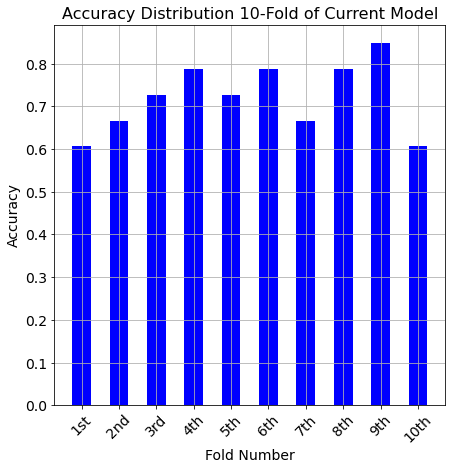

<Figure size 504x504 with 0 Axes>

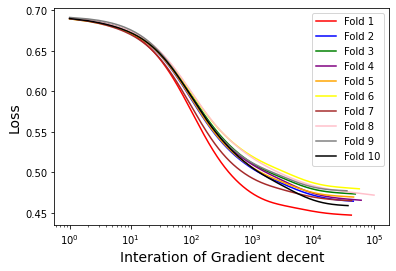

<Figure size 504x504 with 0 Axes>

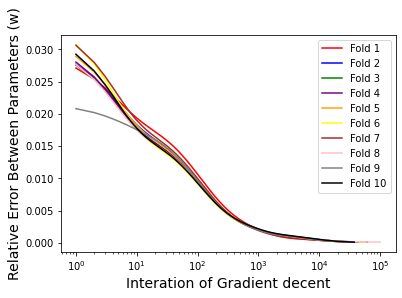

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  38463
0.5757575757575758
No.2 fold start
interations  48165
0.6363636363636364
No.3 fold start
interations  41344
0.7272727272727273
No.4 fold start
interations  48073
0.7878787878787878
No.5 fold start
interations  40320
0.7272727272727273
No.6 fold start
interations  44834
0.7878787878787878
No.7 fold start
interations  37960
0.6666666666666666
No.8 fold start
interations  50185
0.7878787878787878
No.9 fold start
interations  38998
0.8484848484848485
No.10 fold start
interations  46476
0.6060606060606061
Average Accuracy --> 0.7151515151515153


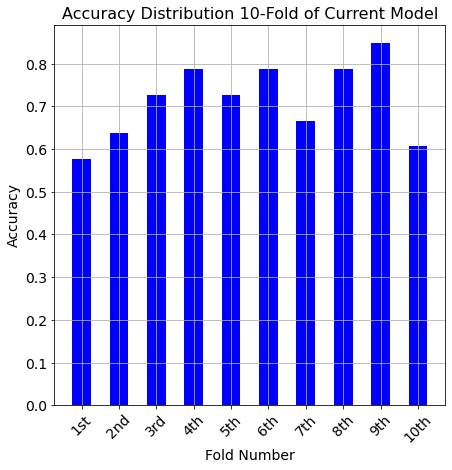

<Figure size 504x504 with 0 Axes>

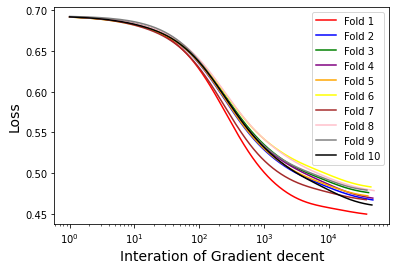

<Figure size 504x504 with 0 Axes>

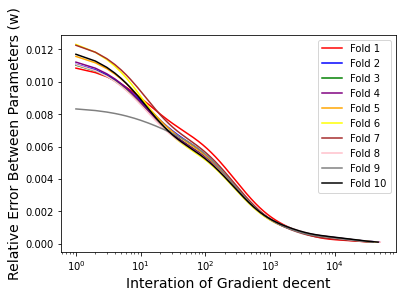

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  30157
0.6060606060606061
No.2 fold start
interations  45454
0.6060606060606061
No.3 fold start
interations  43101
0.7272727272727273
No.4 fold start
interations  47625
0.7878787878787878
No.5 fold start
interations  42122
0.7575757575757576
No.6 fold start
interations  45211
0.7878787878787878
No.7 fold start
interations  34882
0.6363636363636364
No.8 fold start
interations  44576
0.7878787878787878
No.9 fold start
interations  41584
0.8484848484848485
No.10 fold start
interations  49626
0.6363636363636364
Average Accuracy --> 0.7181818181818184


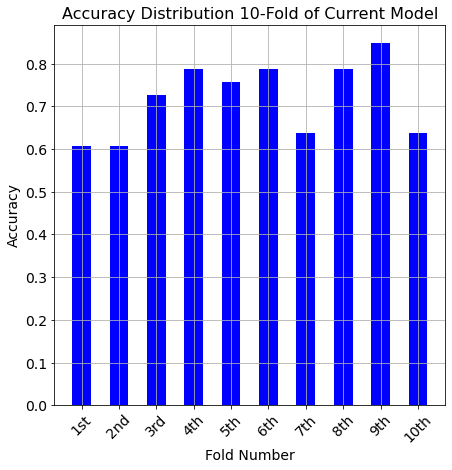

<Figure size 504x504 with 0 Axes>

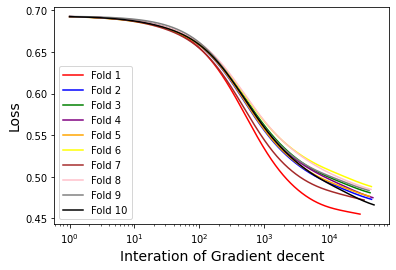

<Figure size 504x504 with 0 Axes>

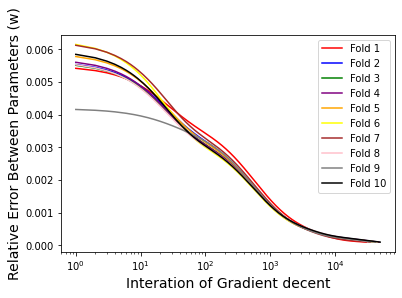

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  21473
0.5757575757575758
No.2 fold start
interations  32520
0.6060606060606061
No.3 fold start
interations  31081
0.7575757575757576
No.4 fold start
interations  35200
0.7272727272727273
No.5 fold start
interations  30117
0.7272727272727273
No.6 fold start
interations  32141
0.8484848484848485
No.7 fold start
interations  22397
0.5757575757575758
No.8 fold start
interations  32471
0.7878787878787878
No.9 fold start
interations  30541
0.8484848484848485
No.10 fold start
interations  38385
0.6363636363636364
Average Accuracy --> 0.7090909090909092


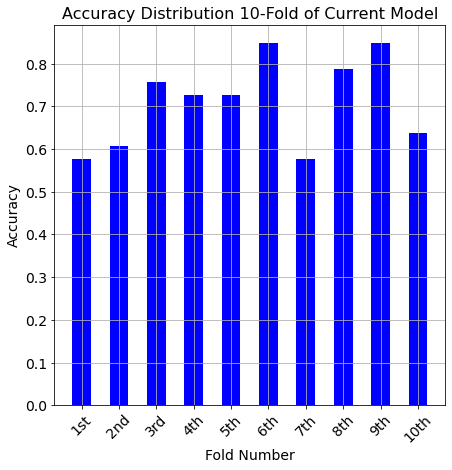

<Figure size 504x504 with 0 Axes>

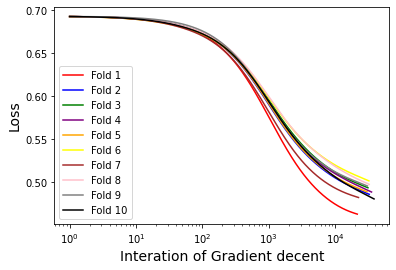

<Figure size 504x504 with 0 Axes>

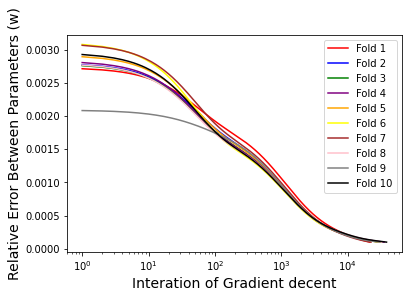

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  19538
0.5757575757575758
No.2 fold start
interations  18607
0.6666666666666666
No.3 fold start
interations  18135
0.7575757575757576
No.4 fold start
interations  17620
0.7272727272727273
No.5 fold start
interations  18609
0.7272727272727273
No.6 fold start
interations  17637
0.7878787878787878
No.7 fold start
interations  17279
0.5757575757575758
No.8 fold start
interations  19157
0.8181818181818182
No.9 fold start
interations  17539
0.7878787878787878
No.10 fold start
interations  19388
0.696969696969697
Average Accuracy --> 0.7121212121212123


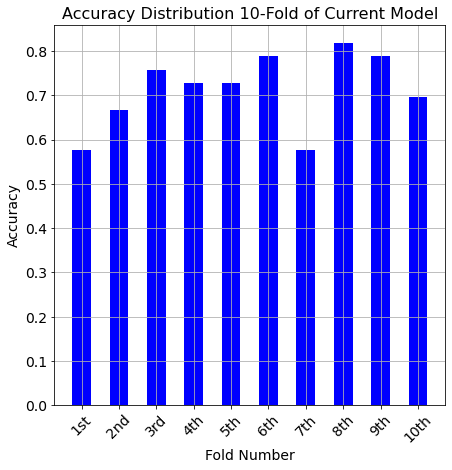

<Figure size 504x504 with 0 Axes>

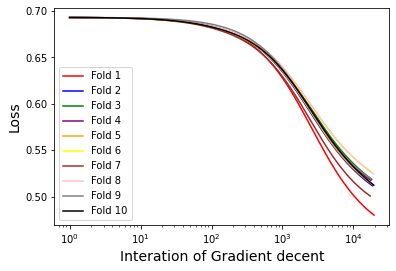

<Figure size 504x504 with 0 Axes>

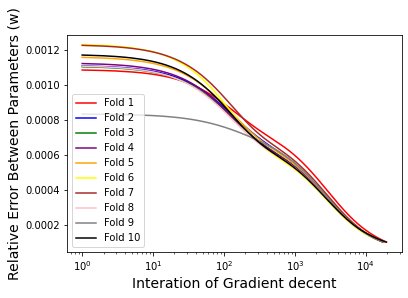

In [ ]:
## Running 
print('-------- Remove Data Test2 Start --------')
# create list to save data
remove2_order3_accur=[]
remove2_order3_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 3
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(3, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.0001, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove2_order3_accur.append(sum(all_acu)/10)
  remove2_order3_iteration.append(sum(all_interation)/10)

Test 5. Removing features has many 0 values (SkinThickness, Heart rate)

-------- Remove Data Test3 Start --------
The order of the linear model is now: 3
The shape of X ---> 330x28
-------- Now testing learing rate is 1--------
No.1 fold start
interations  209320
0.7878787878787878
No.2 fold start
interations  243498
0.7272727272727273
No.3 fold start
interations  251338
0.6666666666666666
No.4 fold start
interations  214641
0.6666666666666666
No.5 fold start
interations  276627
0.7878787878787878
No.6 fold start
interations  313498
0.7272727272727273
No.7 fold start
interations  267508
0.696969696969697
No.8 fold start
interations  265373
0.8181818181818182
No.9 fold start
interations  235741
0.696969696969697
No.10 fold start
interations  212881
0.7878787878787878
Average Accuracy --> 0.7363636363636364


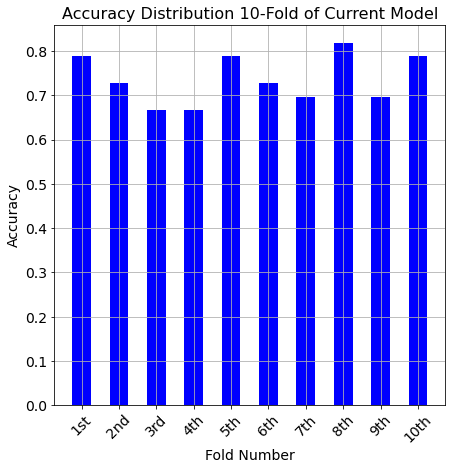

<Figure size 504x504 with 0 Axes>

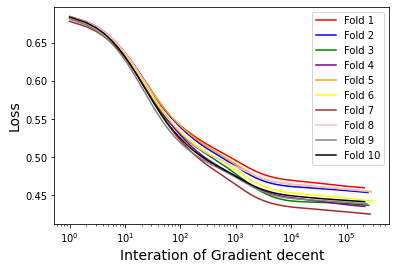

<Figure size 504x504 with 0 Axes>

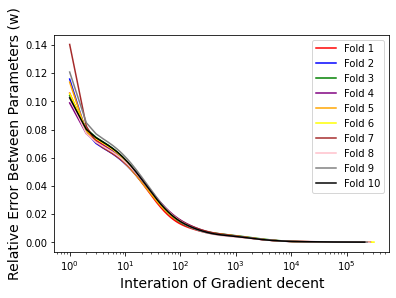

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  143666
0.8484848484848485
No.2 fold start
interations  105815
0.7272727272727273
No.3 fold start
interations  48747
0.6666666666666666
No.4 fold start
interations  160448
0.6666666666666666
No.5 fold start
interations  126617
0.7575757575757576
No.6 fold start
interations  134719
0.7272727272727273
No.7 fold start
interations  121683
0.6666666666666666
No.8 fold start
interations  110344
0.8181818181818182
No.9 fold start
interations  95782
0.696969696969697
No.10 fold start
interations  100439
0.7878787878787878
Average Accuracy --> 0.7363636363636364


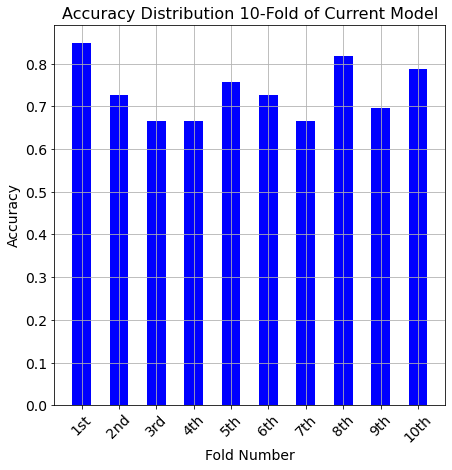

<Figure size 504x504 with 0 Axes>

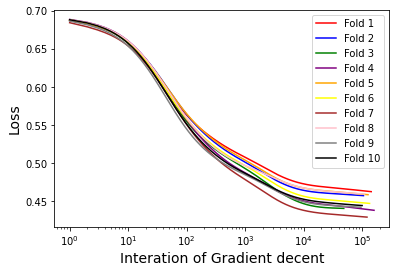

<Figure size 504x504 with 0 Axes>

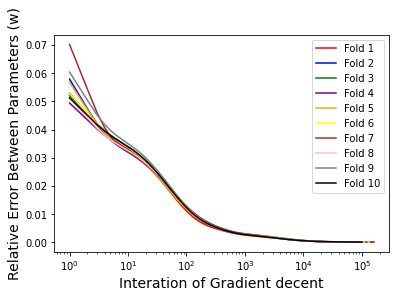

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  71052
0.8787878787878788
No.2 fold start
interations  53969
0.7575757575757576
No.3 fold start
interations  50972
0.6666666666666666
No.4 fold start
interations  83739
0.6666666666666666
No.5 fold start
interations  66487
0.7878787878787878
No.6 fold start
interations  62341
0.7575757575757576
No.7 fold start
interations  63288
0.6666666666666666
No.8 fold start
interations  61577
0.8181818181818182
No.9 fold start
interations  54125
0.6363636363636364
No.10 fold start
interations  67739
0.7878787878787878
Average Accuracy --> 0.7424242424242424


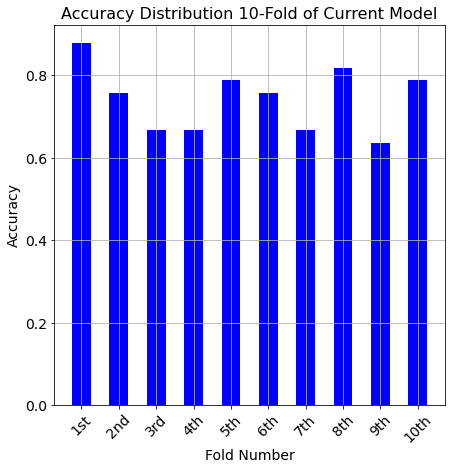

<Figure size 504x504 with 0 Axes>

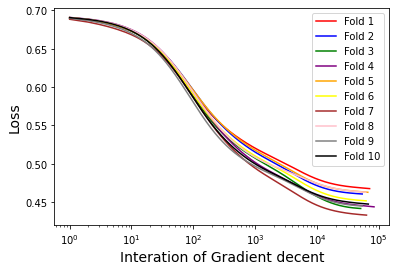

<Figure size 504x504 with 0 Axes>

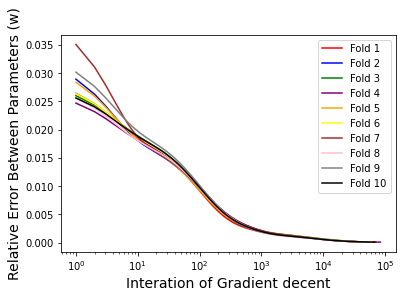

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  57370
0.8787878787878788
No.2 fold start
interations  55305
0.7272727272727273
No.3 fold start
interations  66928
0.696969696969697
No.4 fold start
interations  61625
0.6666666666666666
No.5 fold start
interations  55521
0.7272727272727273
No.6 fold start
interations  60309
0.7575757575757576
No.7 fold start
interations  58891
0.6363636363636364
No.8 fold start
interations  57088
0.8181818181818182
No.9 fold start
interations  60524
0.696969696969697
No.10 fold start
interations  58003
0.7575757575757576
Average Accuracy --> 0.7363636363636364


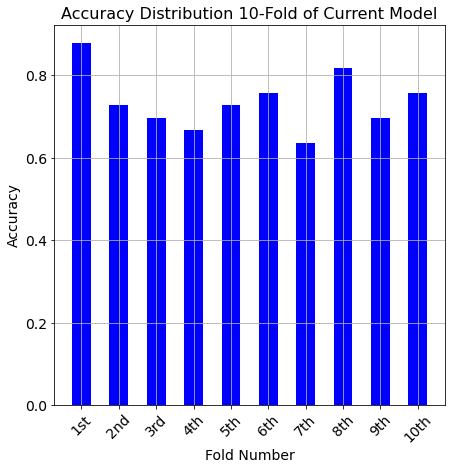

<Figure size 504x504 with 0 Axes>

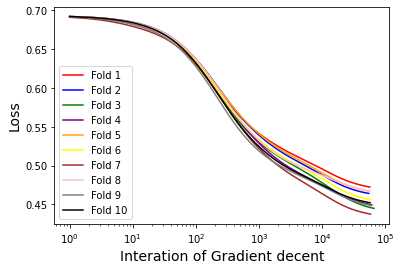

<Figure size 504x504 with 0 Axes>

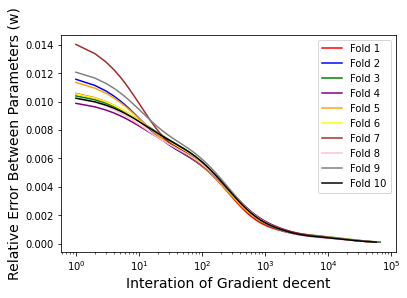

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  55226
0.9090909090909091
No.2 fold start
interations  55813
0.7272727272727273
No.3 fold start
interations  68196
0.696969696969697
No.4 fold start
interations  57827
0.6666666666666666
No.5 fold start
interations  55406
0.7272727272727273
No.6 fold start
interations  61136
0.7575757575757576
No.7 fold start
interations  57909
0.6363636363636364
No.8 fold start
interations  52816
0.8181818181818182
No.9 fold start
interations  58813
0.696969696969697
No.10 fold start
interations  54828
0.696969696969697
Average Accuracy --> 0.7333333333333334


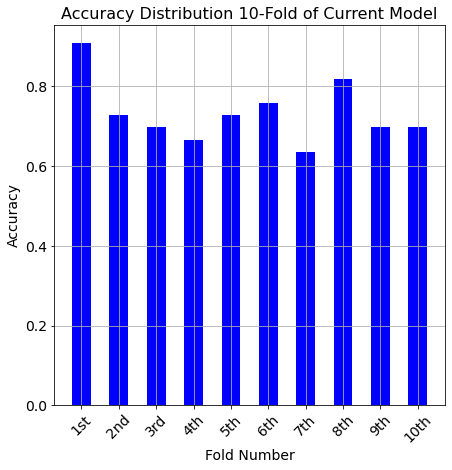

<Figure size 504x504 with 0 Axes>

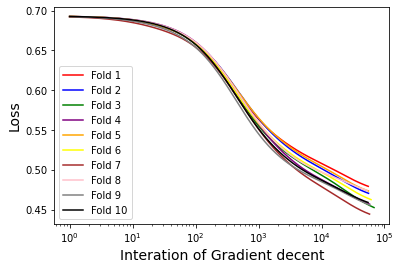

<Figure size 504x504 with 0 Axes>

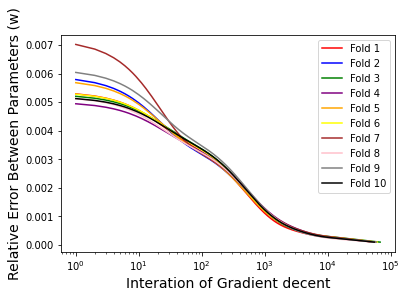

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  40200
0.8787878787878788
No.2 fold start
interations  44342
0.7575757575757576
No.3 fold start
interations  52152
0.6666666666666666
No.4 fold start
interations  41689
0.6666666666666666
No.5 fold start
interations  45273
0.7575757575757576
No.6 fold start
interations  47579
0.7272727272727273
No.7 fold start
interations  47520
0.6363636363636364
No.8 fold start
interations  30382
0.7878787878787878
No.9 fold start
interations  39412
0.7272727272727273
No.10 fold start
interations  39789
0.6666666666666666
Average Accuracy --> 0.7272727272727273


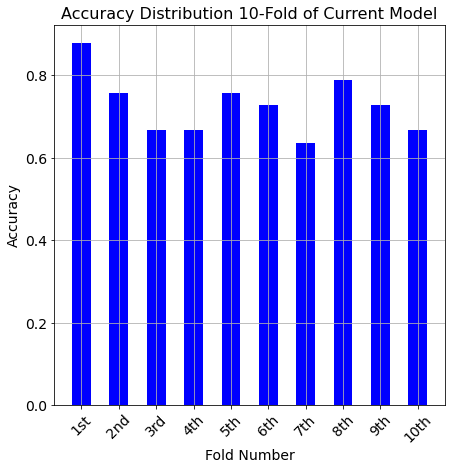

<Figure size 504x504 with 0 Axes>

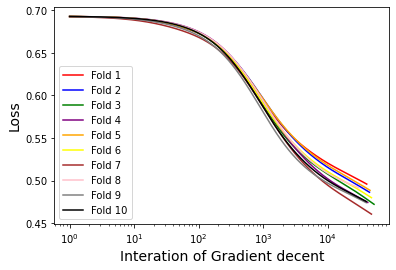

<Figure size 504x504 with 0 Axes>

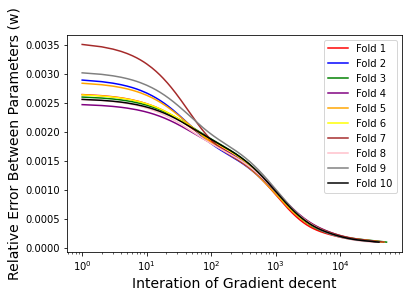

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  14816
0.8181818181818182
No.2 fold start
interations  17321
0.7272727272727273
No.3 fold start
interations  16550
0.7575757575757576
No.4 fold start
interations  19266
0.6666666666666666
No.5 fold start
interations  17430
0.8181818181818182
No.6 fold start
interations  17433
0.6666666666666666
No.7 fold start
interations  19141
0.696969696969697
No.8 fold start
interations  17238
0.8181818181818182
No.9 fold start
interations  16149
0.6363636363636364
No.10 fold start
interations  17392
0.6060606060606061
Average Accuracy --> 0.7212121212121213


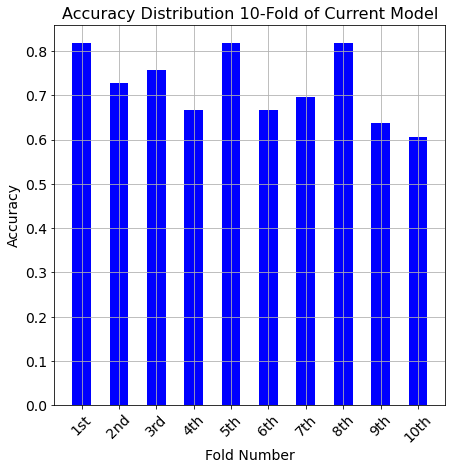

<Figure size 504x504 with 0 Axes>

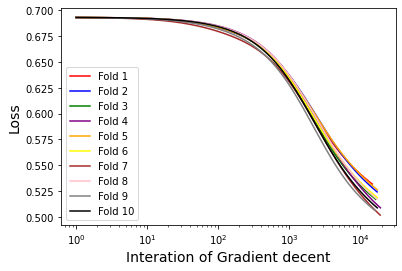

<Figure size 504x504 with 0 Axes>

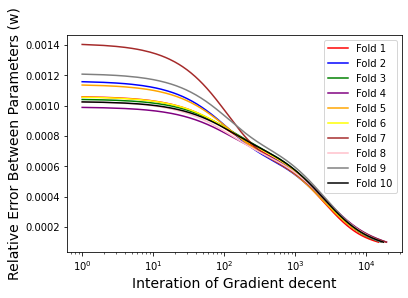

In [ ]:
## Running 
print('-------- Remove Data Test3 Start --------')
# create list to save data
remove3_order3_accur=[]
remove3_order3_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 3
#X_kidney = featureStandardization(X_kidney)
X_kidney = changeModelOrder(3, X_kidney)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate ---  
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.0001, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove3_order3_accur.append(sum(all_acu)/10)
  remove3_order3_iteration.append(sum(all_interation)/10)

Test 6. Use log transform to make the distribution has less skewness for some features

-------- log transform Data Test Start --------


<ipython-input-72-1cab38ea375c>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  temp.hist(bins=100, ax=ax)


The order of the linear model is now: 3
The shape of X ---> 330x36
-------- Now testing learing rate is 1--------
No.1 fold start
interations  238657
0.6363636363636364
No.2 fold start
interations  179915
0.7575757575757576
No.3 fold start
interations  180259
0.7575757575757576
No.4 fold start
interations  186491
0.7272727272727273
No.5 fold start
interations  292635
0.7272727272727273
No.6 fold start
interations  171008
0.8484848484848485
No.7 fold start
interations  162794
0.7575757575757576
No.8 fold start
interations  186808
0.696969696969697
No.9 fold start
interations  161323
0.7878787878787878
No.10 fold start
interations  204337
0.696969696969697
Average Accuracy --> 0.7393939393939395


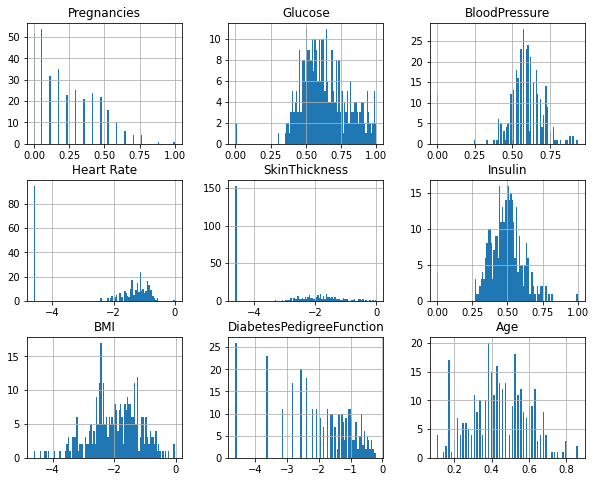

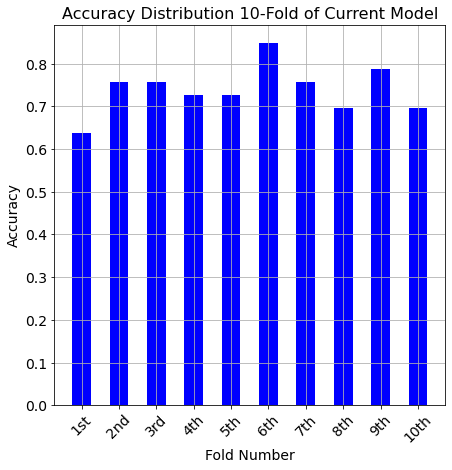

<Figure size 504x504 with 0 Axes>

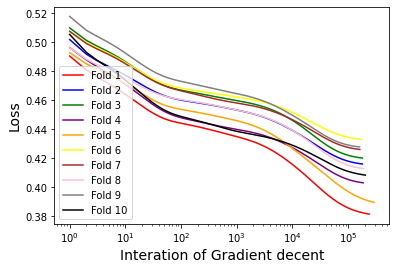

<Figure size 504x504 with 0 Axes>

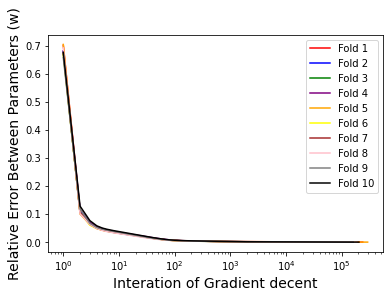

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  246019
0.6666666666666666
No.2 fold start
interations  200421
0.7575757575757576
No.3 fold start
interations  201172
0.7272727272727273
No.4 fold start
interations  213104
0.7575757575757576
No.5 fold start
interations  297616
0.7575757575757576
No.6 fold start
interations  179235
0.8484848484848485
No.7 fold start
interations  188119
0.7575757575757576
No.8 fold start
interations  213561
0.6666666666666666
No.9 fold start
interations  184162
0.7878787878787878
No.10 fold start
interations  207364
0.7272727272727273
Average Accuracy --> 0.7454545454545456


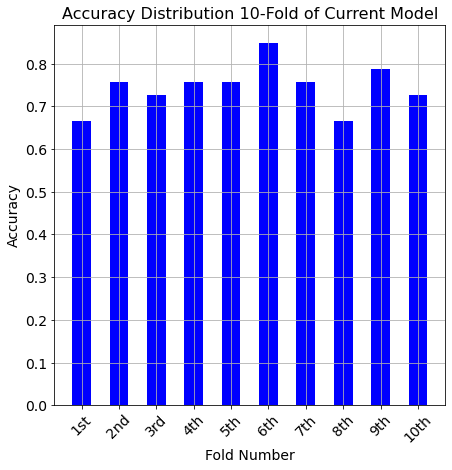

<Figure size 504x504 with 0 Axes>

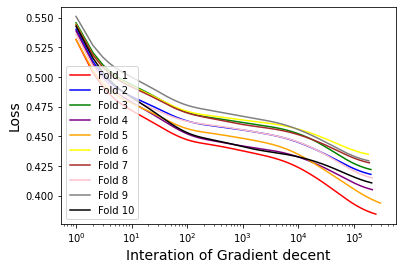

<Figure size 504x504 with 0 Axes>

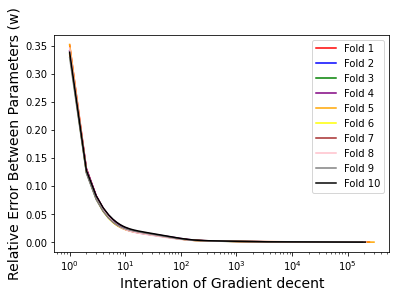

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  229310
0.6666666666666666
No.2 fold start
interations  187902
0.7272727272727273
No.3 fold start
interations  198887
0.7575757575757576
No.4 fold start
interations  196411
0.7272727272727273
No.5 fold start
interations  240119
0.7575757575757576
No.6 fold start
interations  163405
0.7878787878787878
No.7 fold start
interations  176925
0.7575757575757576
No.8 fold start
interations  204680
0.7272727272727273
No.9 fold start
interations  180610
0.8181818181818182
No.10 fold start
interations  175367
0.7272727272727273
Average Accuracy --> 0.7454545454545456


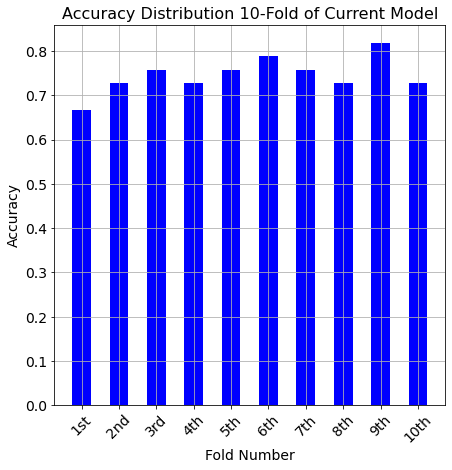

<Figure size 504x504 with 0 Axes>

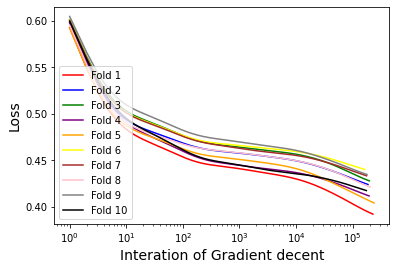

<Figure size 504x504 with 0 Axes>

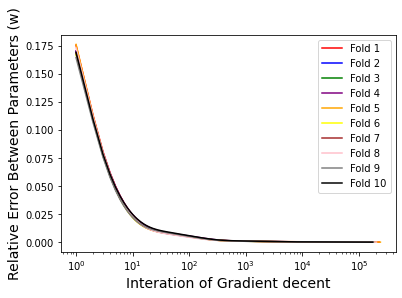

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  113691
0.6666666666666666
No.2 fold start
interations  77420
0.696969696969697
No.3 fold start
interations  85507
0.7575757575757576
No.4 fold start
interations  71277
0.7272727272727273
No.5 fold start
interations  109096
0.7575757575757576
No.6 fold start
interations  54208
0.7575757575757576
No.7 fold start
interations  63125
0.696969696969697
No.8 fold start
interations  80928
0.7272727272727273
No.9 fold start
interations  82947
0.7878787878787878
No.10 fold start
interations  38684
0.7575757575757576
Average Accuracy --> 0.7333333333333335


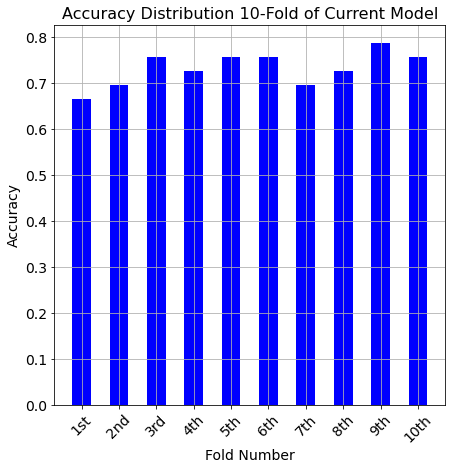

<Figure size 504x504 with 0 Axes>

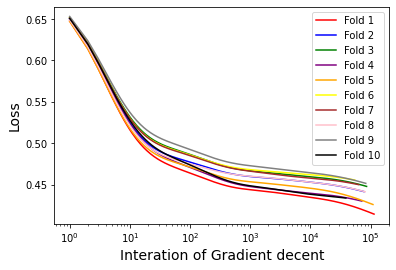

<Figure size 504x504 with 0 Axes>

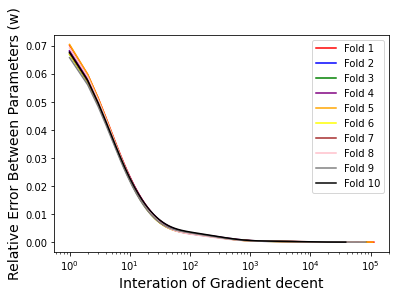

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  22380
0.6363636363636364
No.2 fold start
interations  16560
0.7272727272727273
No.3 fold start
interations  14579
0.7575757575757576
No.4 fold start
interations  14730
0.7272727272727273
No.5 fold start
interations  19917
0.7272727272727273
No.6 fold start
interations  12239
0.7272727272727273
No.7 fold start
interations  14413
0.696969696969697
No.8 fold start
interations  17176
0.7575757575757576
No.9 fold start
interations  17163
0.7878787878787878
No.10 fold start
interations  18441
0.7272727272727273
Average Accuracy --> 0.7272727272727274


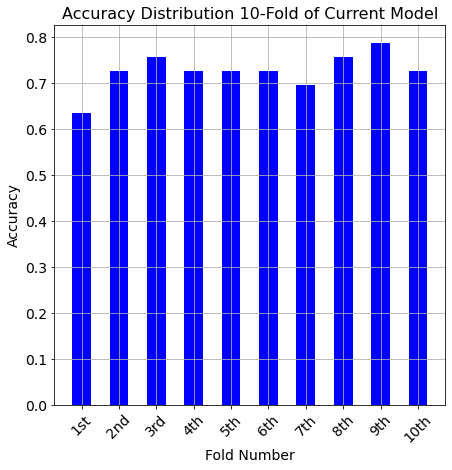

<Figure size 504x504 with 0 Axes>

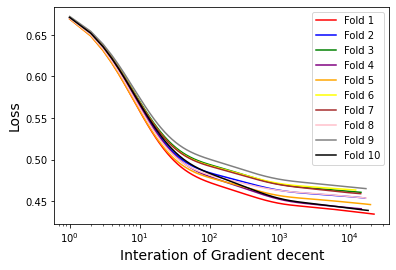

<Figure size 504x504 with 0 Axes>

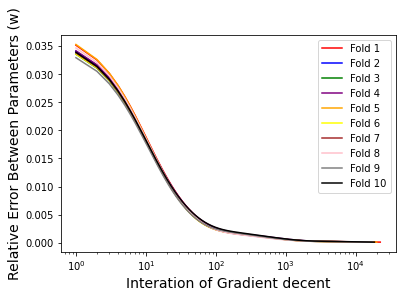

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  9748
0.696969696969697
No.2 fold start
interations  6256
0.696969696969697
No.3 fold start
interations  7530
0.7575757575757576
No.4 fold start
interations  9004
0.7272727272727273
No.5 fold start
interations  7580
0.7575757575757576
No.6 fold start
interations  6537
0.7878787878787878
No.7 fold start
interations  9890
0.7272727272727273
No.8 fold start
interations  6335
0.7878787878787878
No.9 fold start
interations  9349
0.8181818181818182
No.10 fold start
interations  11633
0.7272727272727273
Average Accuracy --> 0.7484848484848486


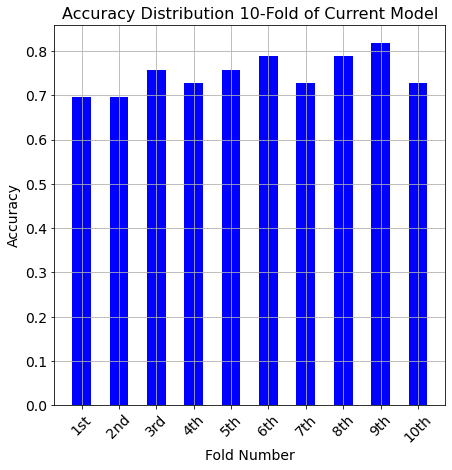

<Figure size 504x504 with 0 Axes>

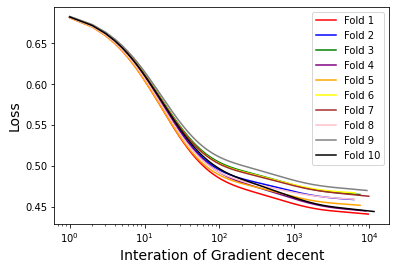

<Figure size 504x504 with 0 Axes>

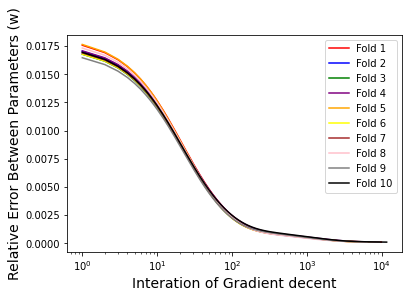

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  5673
0.6363636363636364
No.2 fold start
interations  5474
0.6666666666666666
No.3 fold start
interations  5771
0.7575757575757576
No.4 fold start
interations  6574
0.696969696969697
No.5 fold start
interations  5414
0.7272727272727273
No.6 fold start
interations  5439
0.8181818181818182
No.7 fold start
interations  5692
0.7272727272727273
No.8 fold start
interations  4864
0.7575757575757576
No.9 fold start
interations  5669
0.8181818181818182
No.10 fold start
interations  6613
0.7575757575757576
Average Accuracy --> 0.7363636363636366


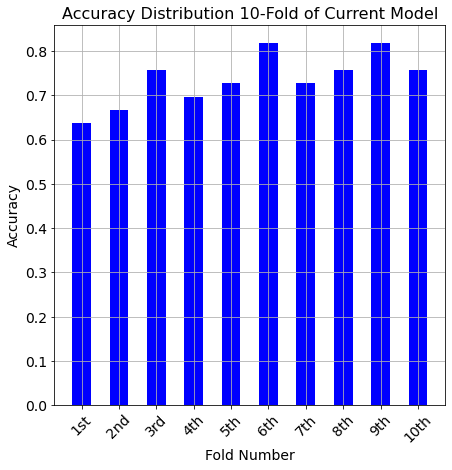

<Figure size 504x504 with 0 Axes>

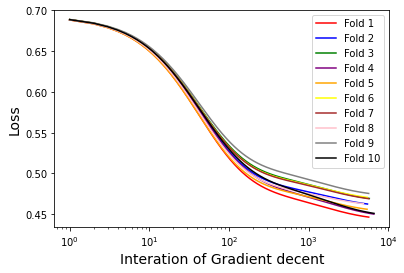

<Figure size 504x504 with 0 Axes>

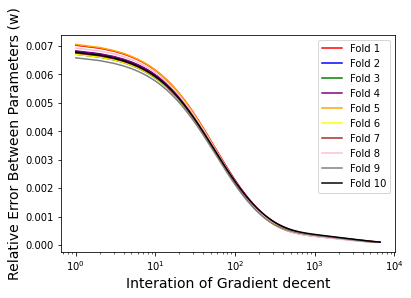

In [ ]:
## Running 
print('-------- log transform Data Test Start --------')
# create list to save data
remove4_order3_accur=[]
remove4_order3_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')

kidney_df[['Heart Rate', 'SkinThickness', 'BMI', 'DiabetesPedigreeFunction']] = kidney_df[['Heart Rate', 'SkinThickness', 'BMI', 'DiabetesPedigreeFunction']] + 0.01
kidney_df[['Heart Rate', 'SkinThickness', 'BMI', 'DiabetesPedigreeFunction']] = kidney_df[['Heart Rate', 'SkinThickness', 'BMI', 'DiabetesPedigreeFunction']].apply(np.log)
# check again hist plot
fig, ax = plt.subplots(figsize=(10, 8))
temp = kidney_df.drop('blood label', axis=1)
temp.hist(bins=100, ax=ax)
fig.show()
#
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 3
X_kidney = changeModelOrder(3, X_kidney)
X_kidney = featureStandardization(X_kidney)
## testing 7 different learning rates
learn_test = learn_para 
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.0001, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove4_order3_accur.append(sum(all_acu)/10)
  remove4_order3_iteration.append(sum(all_interation)/10)

Plot the Third model result

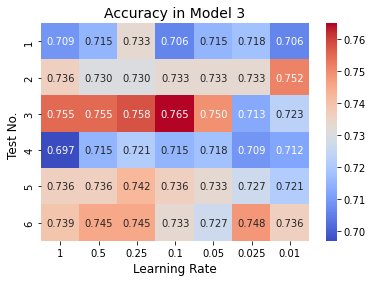

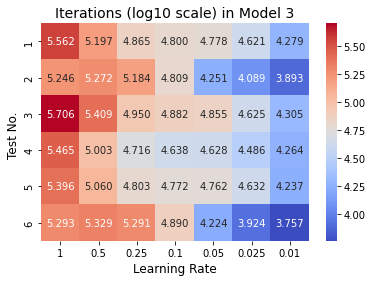

In [ ]:
acc = np.array([raw_order3_accur, std_order3_accur, remove_order3_accur,remove2_order3_accur,remove3_order3_accur,remove4_order3_accur])
xticklabels = ['1', '0.5', '0.25', '0.1', '0.05', '0.025', '0.01']
yticklabels = ['1', '2', '3', '4', '5', '6']
ax = sns.heatmap(acc, annot=True, fmt='.3f', xticklabels=xticklabels, yticklabels=yticklabels, cmap='coolwarm')
ax.set_xlabel('Learning Rate', fontsize=12)
ax.set_ylabel('Test No. ', fontsize=12)
ax.set_title("Accuracy in Model 3", fontsize=14)
plt.show()

time = np.log10(np.array([raw_order3_iteration,std_order3_iteration,remove_order3_iteration,remove2_order3_iteration,remove3_order3_iteration,remove4_order3_iteration]))
xticklabels = ['1', '0.5', '0.25', '0.1', '0.05', '0.025', '0.01']
yticklabels = ['1', '2', '3', '4', '5', '6']
ax = sns.heatmap(time, annot=True, fmt='.3f', xticklabels=xticklabels, yticklabels=yticklabels, cmap='coolwarm')
ax.set_xlabel('Learning Rate', fontsize=12)
ax.set_ylabel('Test No. ', fontsize=12)
ax.set_title("Iterations (log10 scale) in Model 3", fontsize=14)
plt.show()

-----------------------------Final Model select and test ----------------------------

Select polynomial order3 remove outliers and standardization features and decrease stop_thresold

-------- Remove Outliers Data Test Start --------
The order of the linear model is now: 3
The shape of X ---> 296x36
-------- Now testing learing rate is 0.2--------
No.1 fold start
interations  139872
0.8620689655172413
No.2 fold start
interations  143685
0.7241379310344828
No.3 fold start
interations  138384
0.8620689655172413
No.4 fold start
interations  172174
0.7586206896551724
No.5 fold start
interations  258757
0.6896551724137931
No.6 fold start
interations  167328
0.7586206896551724
No.7 fold start
interations  140996
0.7241379310344828
No.8 fold start
interations  121753
0.6206896551724138
No.9 fold start
interations  181314
0.8620689655172413
No.10 fold start
interations  180556
0.7714285714285715
Average Accuracy --> 0.7633497536945812


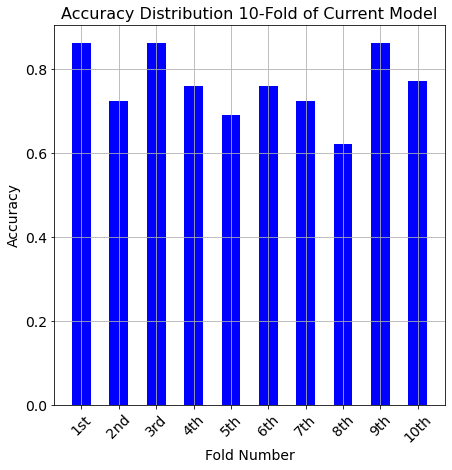

<Figure size 504x504 with 0 Axes>

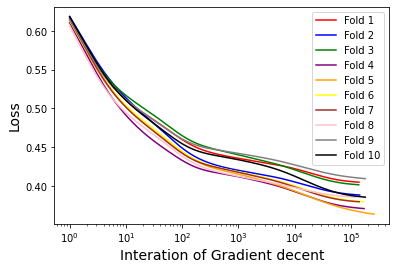

<Figure size 504x504 with 0 Axes>

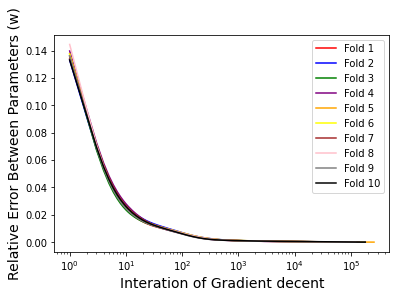

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  147799
0.896551724137931
No.2 fold start
interations  143951
0.7241379310344828
No.3 fold start
interations  149209
0.8620689655172413
No.4 fold start
interations  163841
0.7586206896551724
No.5 fold start
interations  218825
0.7241379310344828
No.6 fold start
interations  160899
0.7586206896551724
No.7 fold start
interations  149254
0.7241379310344828
No.8 fold start
interations  120221
0.6551724137931034
No.9 fold start
interations  154872
0.8620689655172413
No.10 fold start
interations  182372
0.7714285714285715
Average Accuracy --> 0.773694581280788


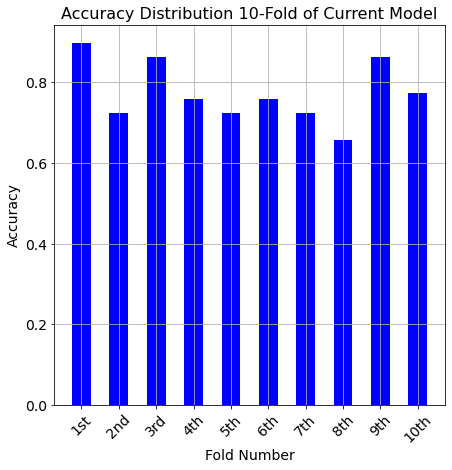

<Figure size 504x504 with 0 Axes>

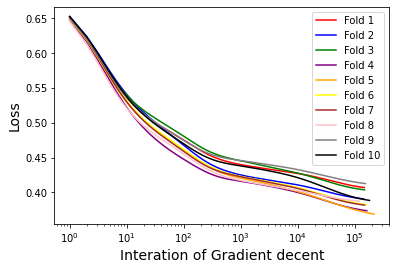

<Figure size 504x504 with 0 Axes>

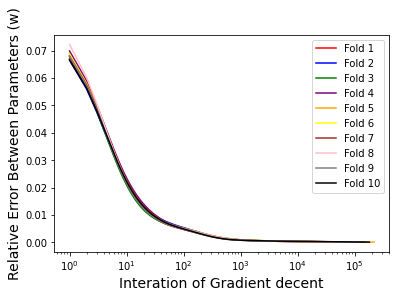

-------- Now testing learing rate is 0.08--------
No.1 fold start
interations  148660
0.896551724137931
No.2 fold start
interations  142284
0.7241379310344828
No.3 fold start
interations  150096
0.8620689655172413
No.4 fold start
interations  161885
0.7586206896551724
No.5 fold start
interations  203286
0.7241379310344828
No.6 fold start
interations  157770
0.7586206896551724
No.7 fold start
interations  149511
0.7241379310344828
No.8 fold start
interations  117819
0.6551724137931034
No.9 fold start
interations  147886
0.8620689655172413
No.10 fold start
interations  181484
0.7714285714285715
Average Accuracy --> 0.773694581280788


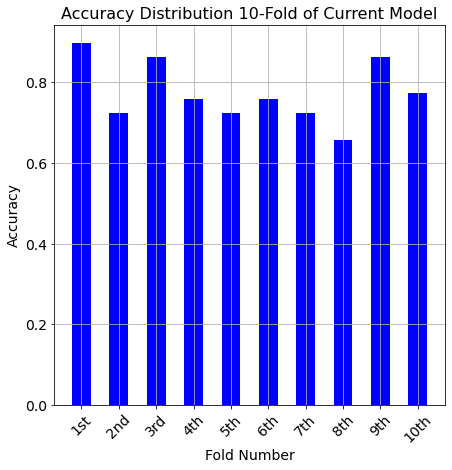

<Figure size 504x504 with 0 Axes>

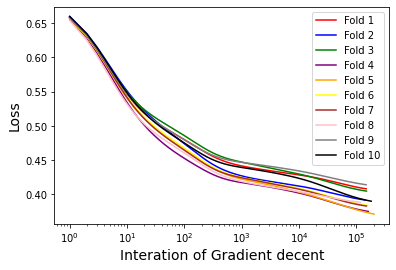

<Figure size 504x504 with 0 Axes>

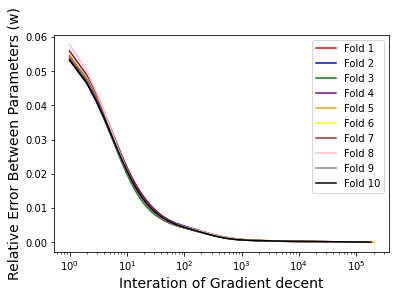

In [ ]:
## Running for the remove outlier data
print('-------- Remove Outliers Data Test Start --------')
# create list to save data
order3_accur=[]
order3_iteration=[]
# Load data again
kidney_df = pd.read_csv('Kidney disease.csv')
columns = ['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
# remove outlier in features
outliers = detect_outliers(kidney_df, columns)
outliers = list(set(outliers))
kidney_df = kidney_df.drop(outliers)
X_kidney = kidney_df[['Pregnancies', 'Glucose', 'BloodPressure', 'Heart Rate', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']].to_numpy()
y_kidney = kidney_df['blood label'].to_numpy()
# shuffling data
X_kidney, y_kidney = shuffle(X_kidney,y_kidney)
# Test in linear order 3
X_kidney = changeModelOrder(3, X_kidney)
X_kidney = featureStandardization(X_kidney)
## testing 7 different learning rates
learn_test = [0.2, 0.1, 0.08]
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_kidney,y = y_kidney, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  order3_accur.append(sum(all_acu)/10)
  order3_iteration.append(sum(all_interation)/10)